In [21]:
import os
import sys

# Add 'libs' path to sys.path in a notebook-friendly way
notebook_dir = os.getcwd()
base_path = os.path.abspath(os.path.join(notebook_dir, "../"))
if base_path not in sys.path:
    sys.path.append(base_path)

In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import lag_plot

In [23]:
from libs.utils.df_helpers import read_df_on_time_from_csv

In [24]:
from libs.utils.config_plot import PlotConfig

PlotConfig.setup_matplotlib(ts_serie=True)
%matplotlib inline

In [25]:
# Definir el estilo general de seaborn
sns.set_theme(style="whitegrid", palette="muted", font="Arial")

In [26]:
df = read_df_on_time_from_csv(f"{base_path}/var/sample_client/sample_project/processed_data/PCT/DME_CHO.CH-41.csv")
# df = df.dropna()
df['east'] = df['east'].astype(float).values
df['north'] = df['north'].astype(float).values

In [27]:
df.head()

,east,north,elevation,base_line,diff_time_abs,diff_east_abs,diff_north_abs,diff_vert_abs,diff_horz_abs,diff_disp_total_abs,...,diff_horz_rel,diff_disp_total_rel,acum_disp_total_rel,mean_vel_rel,inv_mean_vel_rel,horz_angle_rel_rad,horz_angle_rel_grad,dip_rel_rad,dip_rel_grad,azimuth_rel_grad
time,,,,,,,,,,,,,,,,,,,,,
2024-06-28 14:00:00.000,808685.1560,9.158454e+06,2709.9045,True,0.000000,0.00,0.00,0.00,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-07-05 16:00:00.000,808685.1645,9.158454e+06,2709.8980,False,7.083333,0.85,2.65,-0.65,2.782984,2.857884,...,2.782984,2.857884,2.857884,0.403466,2.478524,0.310387,17.783887,0.229449,13.146460,17.783887
2024-07-12 16:00:00.000,808685.1875,9.158454e+06,2709.8800,False,14.083333,3.15,6.65,-2.45,7.358329,7.755482,...,4.614109,4.952777,7.810661,0.707540,1.413349,0.521834,29.898902,0.371950,21.311147,29.898902
2024-07-13 15:59:59.995,808685.1835,9.158454e+06,2709.8775,False,15.083333,2.75,6.75,-2.70,7.288690,7.772709,...,0.412311,0.482183,8.292843,0.482183,2.073903,-1.325818,284.036246,0.545068,31.230070,284.036246
2024-07-16 16:00:00.000,808685.1785,9.158454e+06,2709.8730,False,18.083333,2.25,8.05,-3.15,8.358529,8.932385,...,1.392839,1.463728,9.756572,0.487909,2.049561,-0.367174,338.962489,0.312495,17.904668,338.962489


In [28]:
def analyze_time_series(df, period=None, verbose=False, plot=False):
    """
    Analiza una serie temporal para determinar estacionariedad, estacionalidad y tendencia.

    Args:
        df (pd.Series): Serie temporal con índice datetime.
        period (int, optional): Periodo estacional. Default: None (autodetección).
        verbose (bool): Si True, imprime resultados en consola.
        plot (bool): Si True, genera gráficos.

    Returns:
        dict: Resultados del análisis con claves:
              'stationarity', 'trend', 'seasonality'
    """

    results = {}

    # === Pruebas de estacionariedad ===
    if verbose:
        print("="*50)
        print("Análisis de Estacionariedad")
        print("="*50)

    adf_result = adfuller(df)
    results['stationarity'] = 'stationary' if adf_result[1] < 0.05 else 'non-stationary'

    if verbose:
        print(f'ADF Statistic: {adf_result[0]:.4f}')
        print(f'p-value: {adf_result[1]:.4f}')
        print('Critical Values:')
        for key, value in adf_result[4].items():
            print(f'   {key}: {value:.4f}')

    kpss_result = kpss(df, regression='ct')
    results['trend'] = 'trend' if kpss_result[1] < 0.05 else 'no-trend'

    if verbose:
        print(f'\nKPSS Statistic: {kpss_result[0]:.4f}')
        print(f'p-value: {kpss_result[1]:.4f}')
        print('Critical Values:')
        for key, value in kpss_result[3].items():
            print(f'   {key}: {value:.4f}')

    # === Descomposición estacional (si se proporciona periodo) ===
    if period:
        decomposition = seasonal_decompose(df, period=period)
        seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))

        if seasonal_strength > 0.6:
            results['seasonality'] = 'strong'
        elif seasonal_strength > 0.3:
            results['seasonality'] = 'moderate'
        else:
            results['seasonality'] = 'weak'

        if verbose:
            print("\n" + "="*50)
            print("Análisis de Estacionalidad y Tendencia")
            print("="*50)
            print(f"\nFuerza Estacional: {seasonal_strength:.4f}")
            print("(Valores > 0.6 sugieren fuerte estacionalidad)")
    else:
        results['seasonality'] = 'unknown'

    # === Visualizaciones ===
    if plot:
        plt.figure(figsize=(15, 14))

        # Serie original
        plt.subplot(5, 1, 1)
        df.plot(title='Serie Temporal Original')
        plt.grid(True)

        # Descomposición
        if period:
            plt.subplot(5, 1, 2)
            decomposition.trend.plot(title='Componente de Tendencia')
            plt.grid(True)

            plt.subplot(5, 1, 3)
            decomposition.seasonal.plot(title='Componente Estacional')
            plt.grid(True)

            plt.subplot(5, 1, 4)
            decomposition.resid.plot(title='Residuos')
            plt.grid(True)

        # Lag plot con línea y = x
        plt.subplot(5, 1, 5)
        lag_plot(df)
        plt.title("Lag Plot: y(t+1) vs y(t)")
        plt.grid(True)

        # Línea y = x
        min_val = min(df.min(), df.shift(-1).min())
        max_val = max(df.max(), df.shift(-1).max())
        plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
        plt.legend()

        # ACF/PACF
        n = len(df)
        max_lags = min(40, int(n // 2) - 1)
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
        plot_acf(df, lags=max_lags, ax=ax1)
        plot_pacf(df, lags=max_lags, ax=ax2)
        plt.tight_layout()
        plt.show()
        
        
    # === Interpretación textual ===
    if verbose:
        print("\n" + "="*50)
        print("Interpretación de Resultados")
        print("="*50)

        if results['stationarity'] == 'stationary':
            print("- La serie es probablemente ESTACIONARIA (ADF p-value < 0.05)")
        else:
            print("- La serie es NO ESTACIONARIA (ADF p-value >= 0.05)")

        if results['trend'] == 'trend':
            print("- Existe evidencia de TENDENCIA (KPSS p-value < 0.05)")
        else:
            print("- No se detectó tendencia significativa (KPSS p-value >= 0.05)")

        if period:
            if results['seasonality'] == 'strong':
                print("- Fuerte componente ESTACIONAL detectado")
            elif results['seasonality'] == 'moderate':
                print("- Componente estacional moderado detectado")
            else:
                print("- No se detectó componente estacional significativo")

    return results


In [29]:
# Seleccionar y preparar la serie temporal
ts_analizar = df['diff_disp_total_abs'].dropna()
analyze_time_series(ts_analizar, period=1)

C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


{'stationarity': 'non-stationary', 'trend': 'trend', 'seasonality': 'weak'}

In [30]:
def read_all_pct_csvs(base_path, dropna=False):
    """
    Lee todos los archivos CSV en la carpeta 'PCT', los convierte en DataFrames y los procesa.

    Args:
        base_path (str): Ruta base donde se encuentra la carpeta 'PCT'.
        dropna (bool): Si True, elimina filas con valores nulos.

    Returns:
        list: Lista de DataFrames procesados.
    """
    dfs = []

    for file in os.listdir(base_path):
        if file.endswith('.csv'):
            file_path = os.path.join(base_path, file)
            df = read_df_on_time_from_csv(file_path)
            if dropna:
                df = df.dropna()
            df['east'] = df['east'].astype(float).values
            df['north'] = df['north'].astype(float).values
            df['file_name'] = file
            dfs.append(df)

    return dfs

In [31]:
pct_base_path = f"{base_path}/outputs/forecast/input/PCT"
dfs = read_all_pct_csvs(pct_base_path, dropna=True)
print(f"Se leyeron {len(dfs)} archivos CSV de PCT.")

Se leyeron 96 archivos CSV de PCT.


Analizando archivo: DME_CHO.CH-1.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-2.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-21.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-22.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-23.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-24.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-25.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-26.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-27.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-28.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-29.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-3.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-30.csv
No hay suficientes datos para

C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


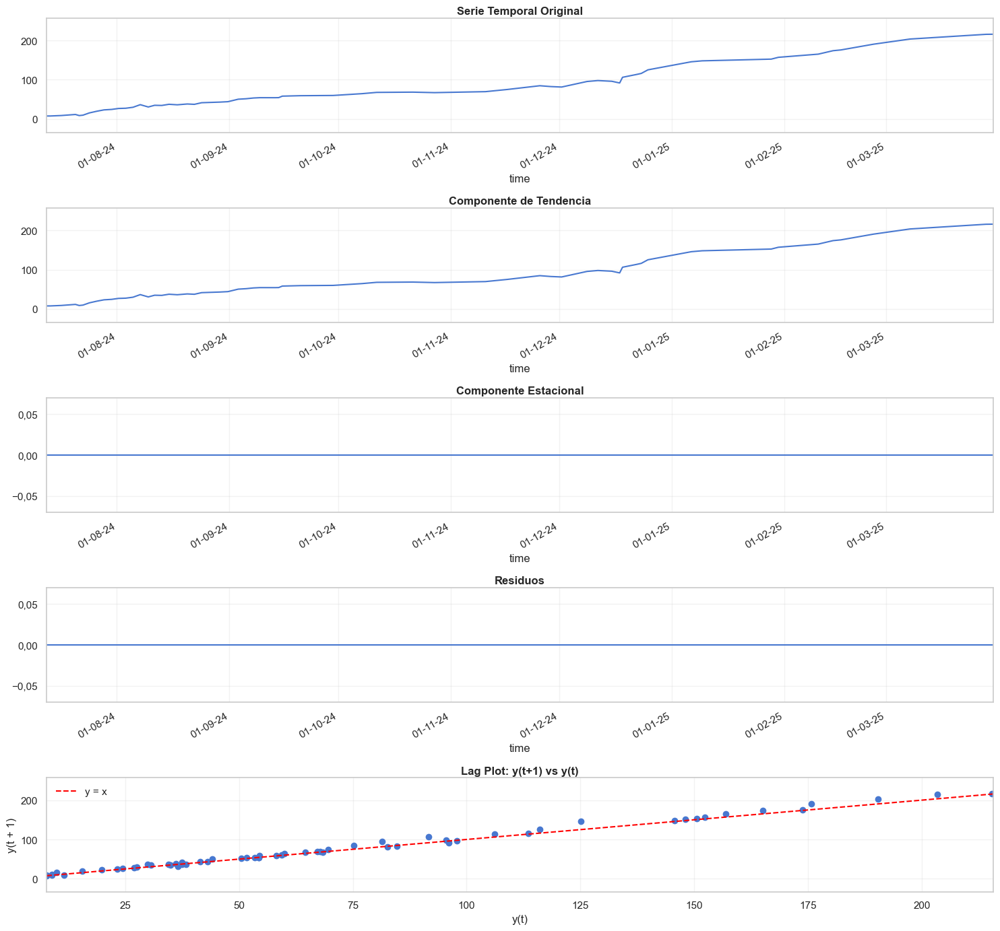

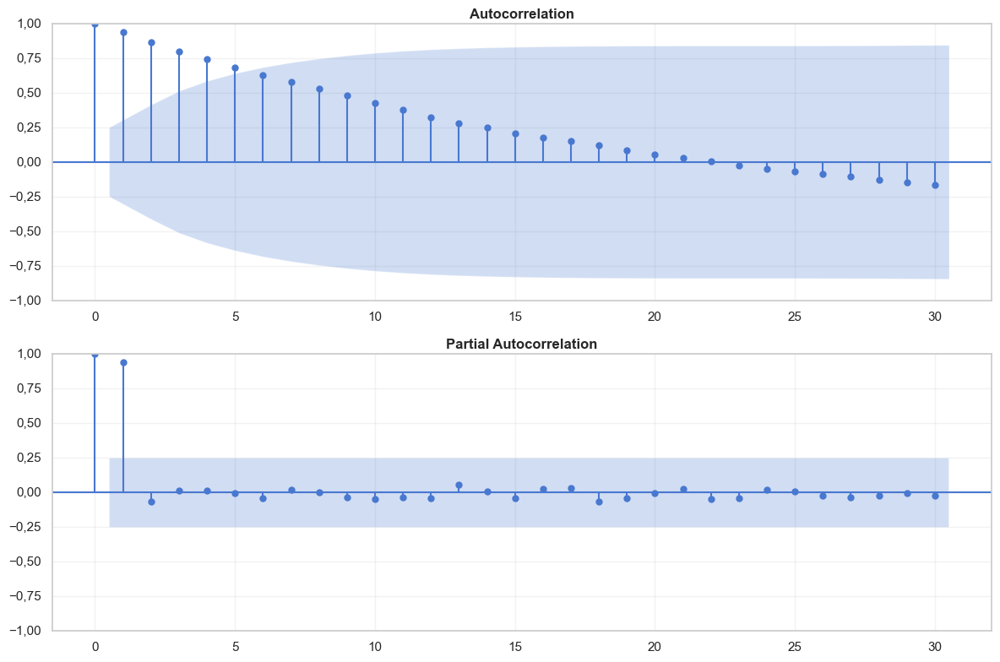

Analizando archivo: DME_CHO.CH-42.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


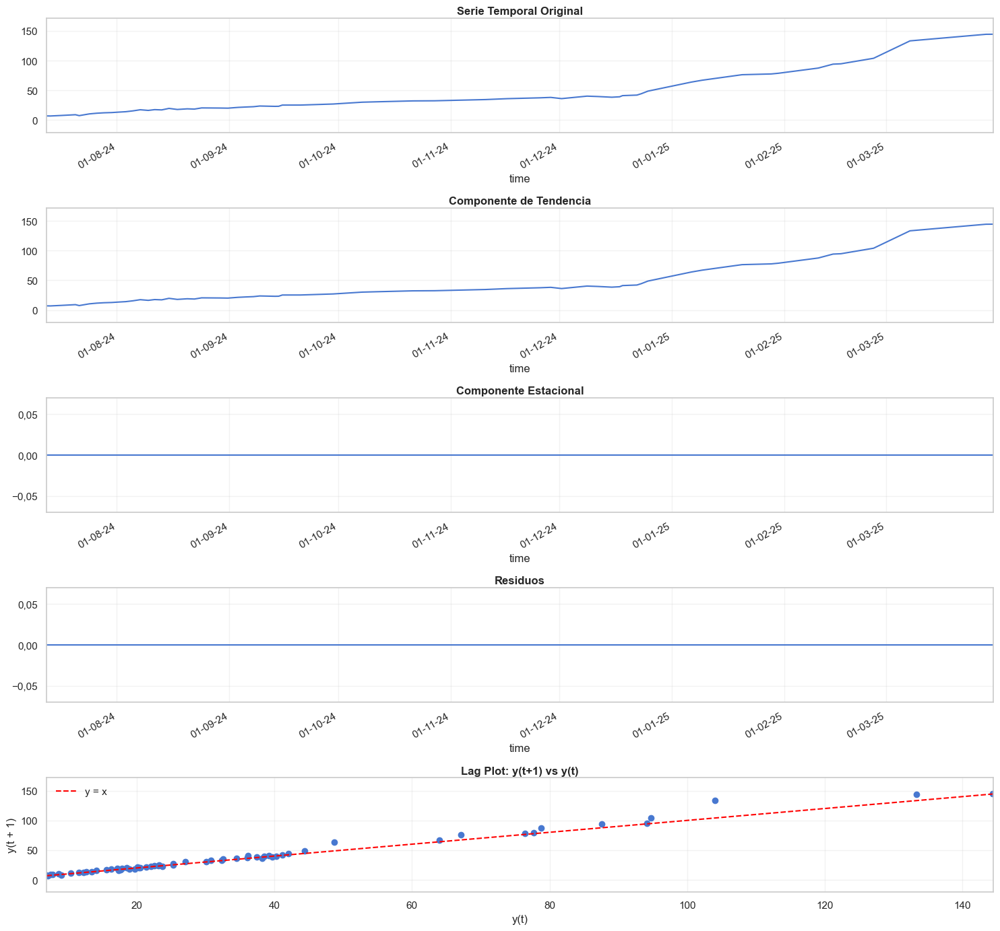

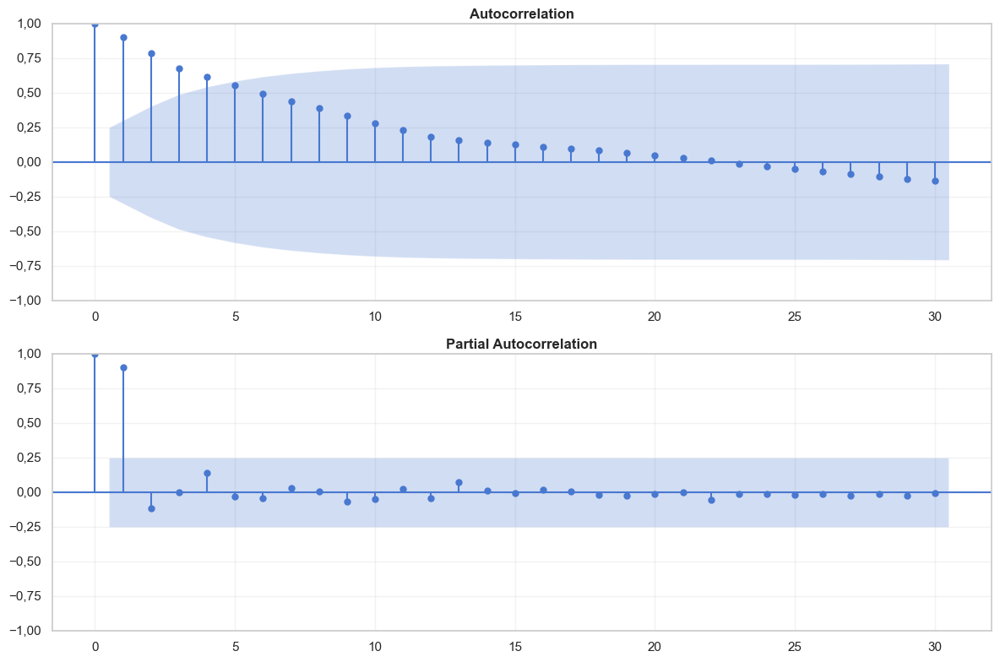

Analizando archivo: DME_CHO.CH-43.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


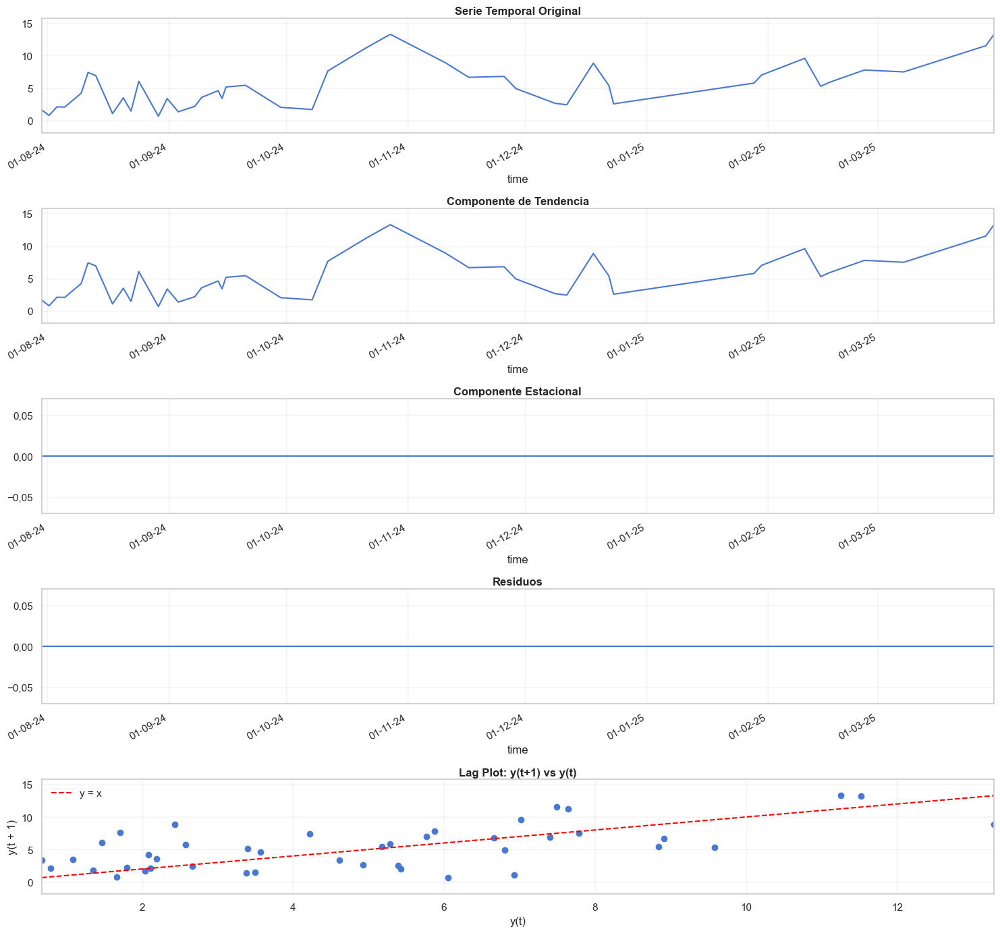

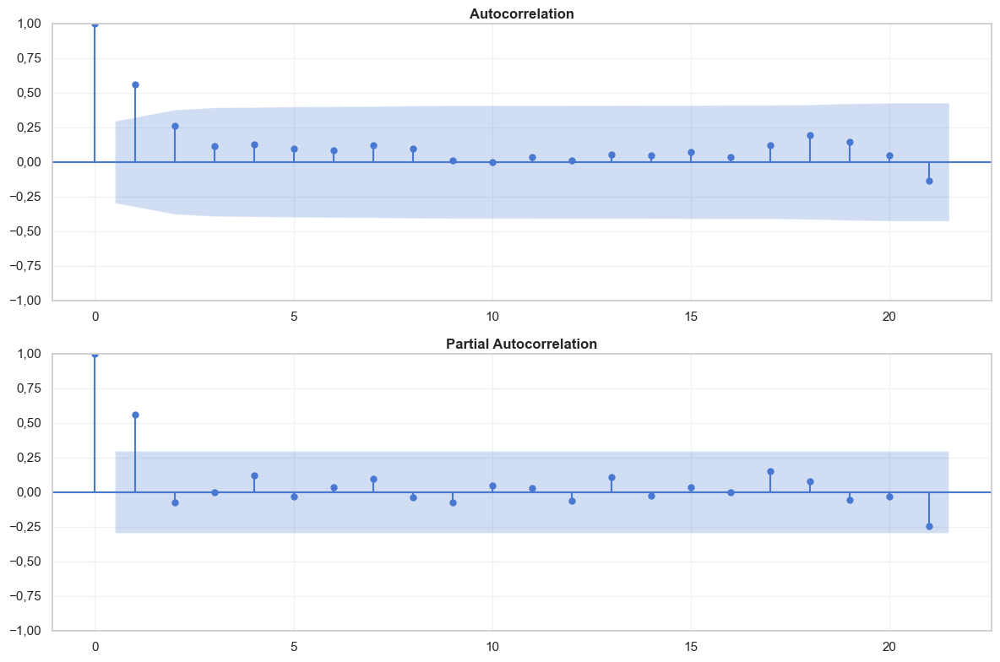

Analizando archivo: DME_CHO.CH-44.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


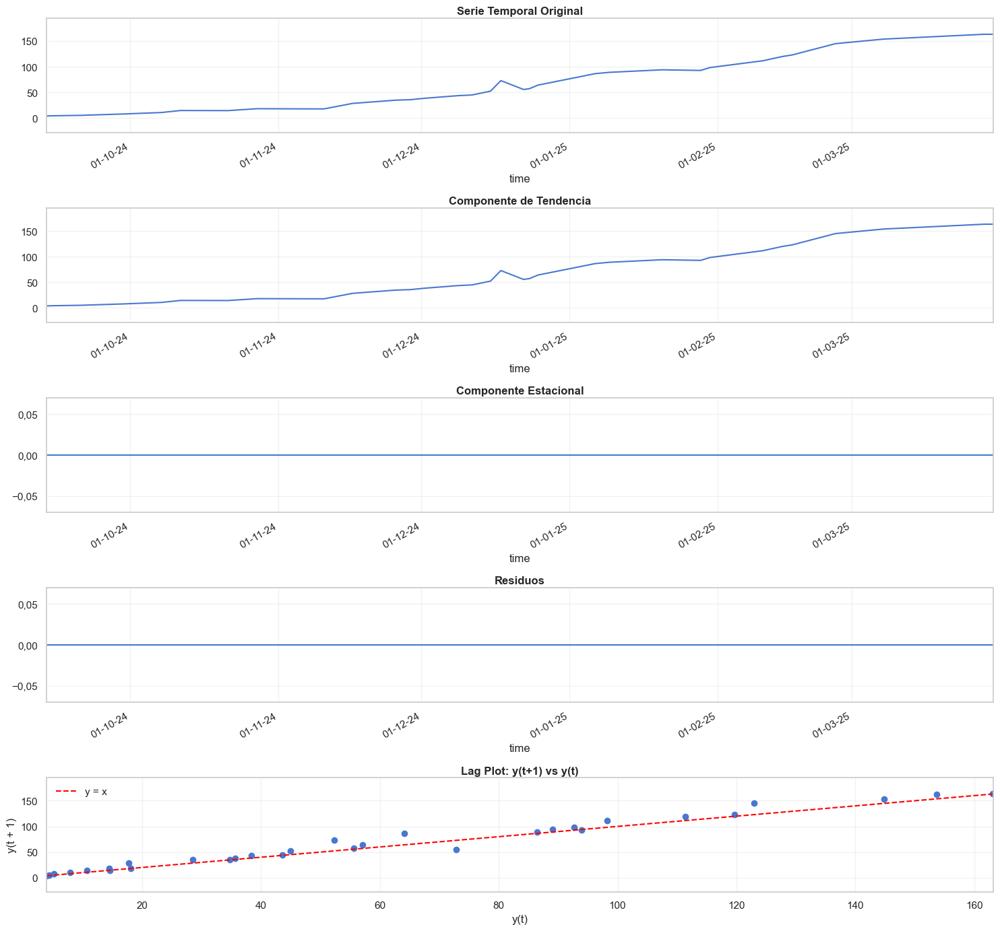

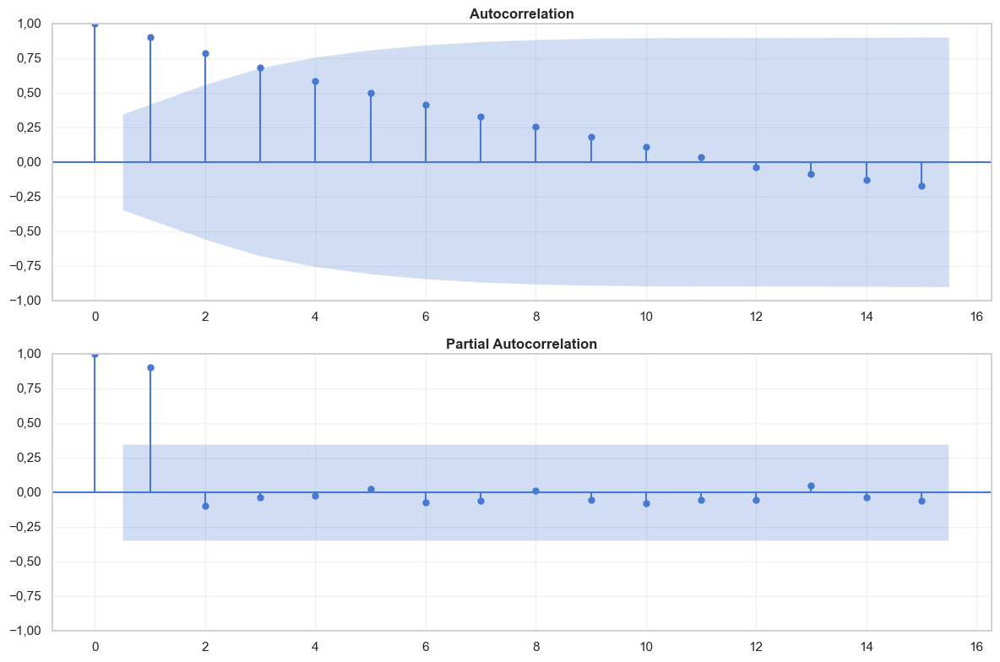

Analizando archivo: DME_CHO.CH-45.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-5.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-6.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.CH-7.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.D-CH-1.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


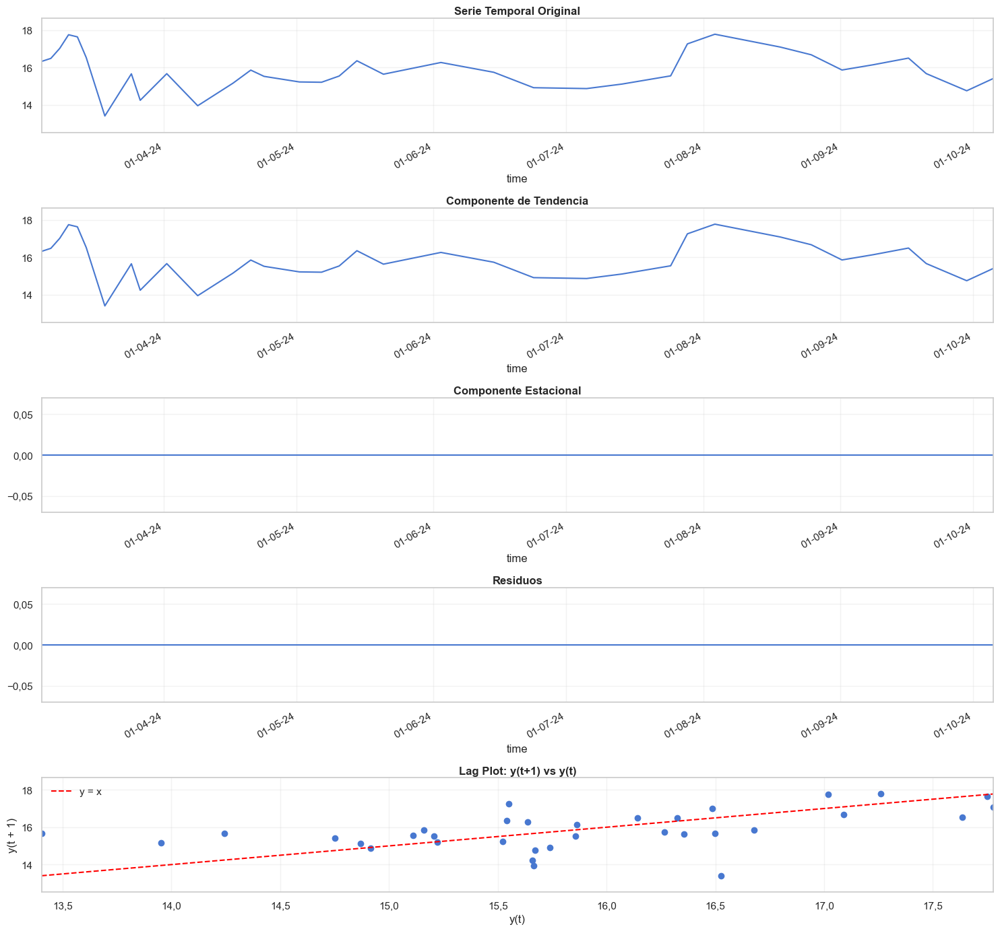

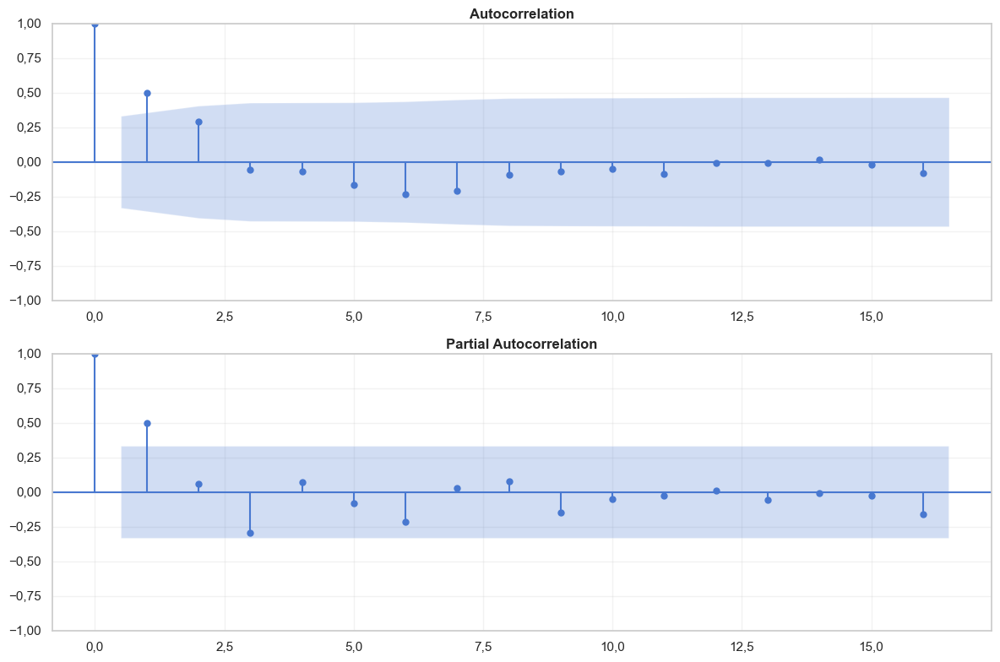

Analizando archivo: DME_CHO.D-CH-10.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


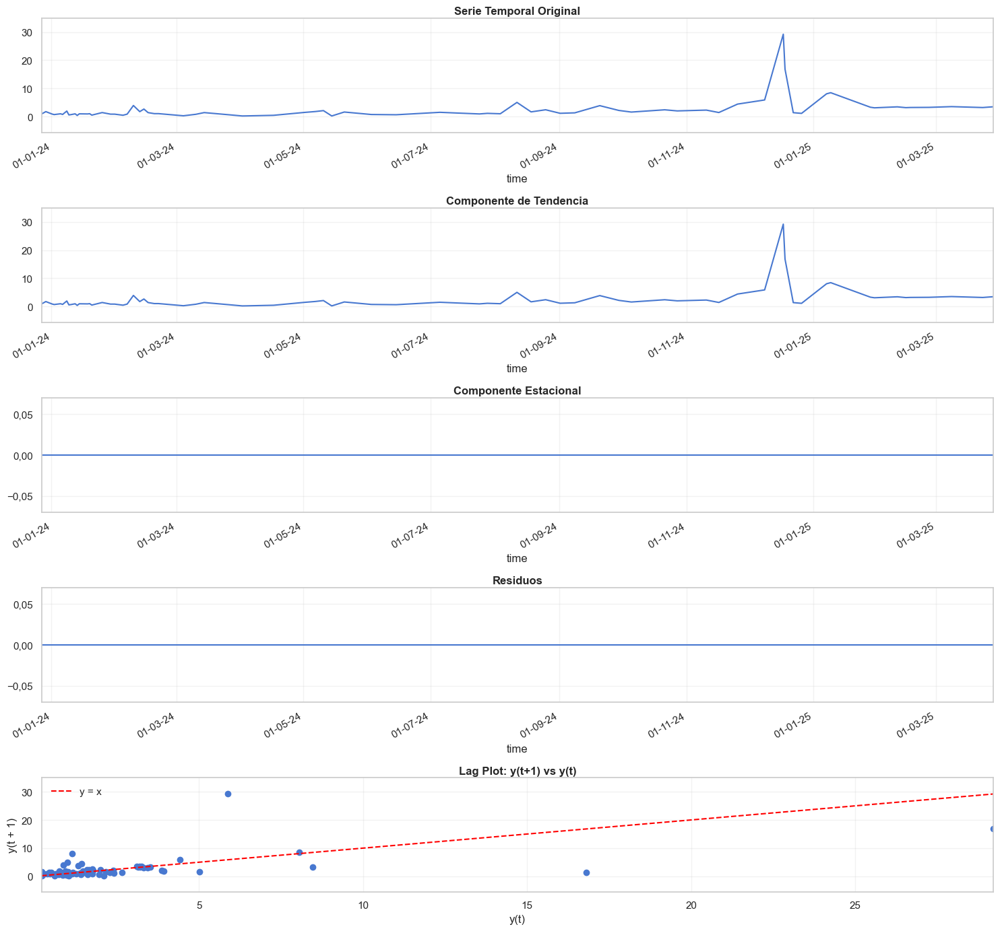

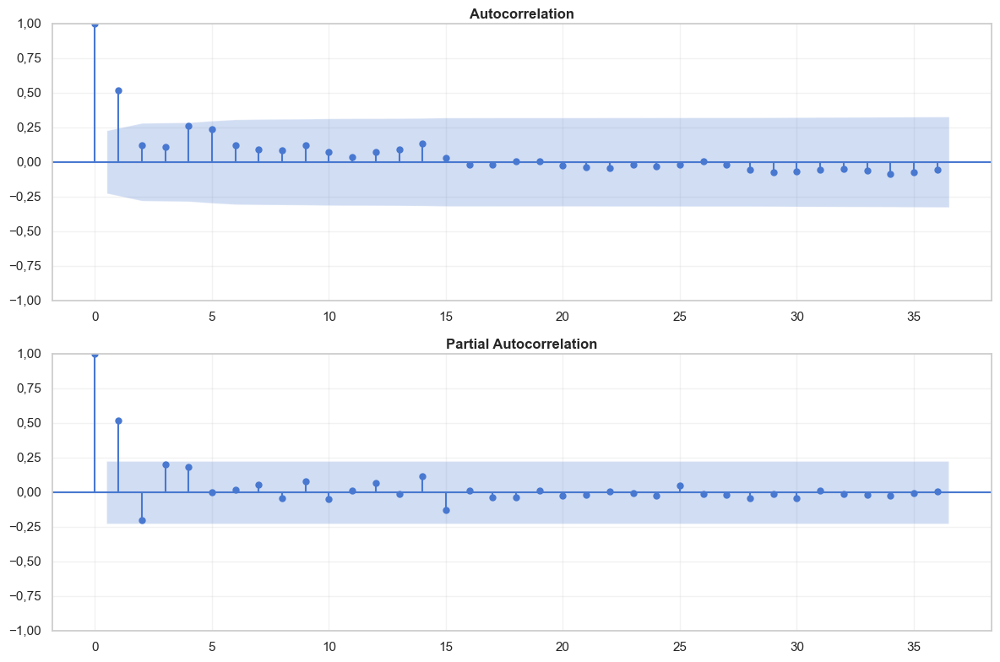

Analizando archivo: DME_CHO.D-CH-11.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


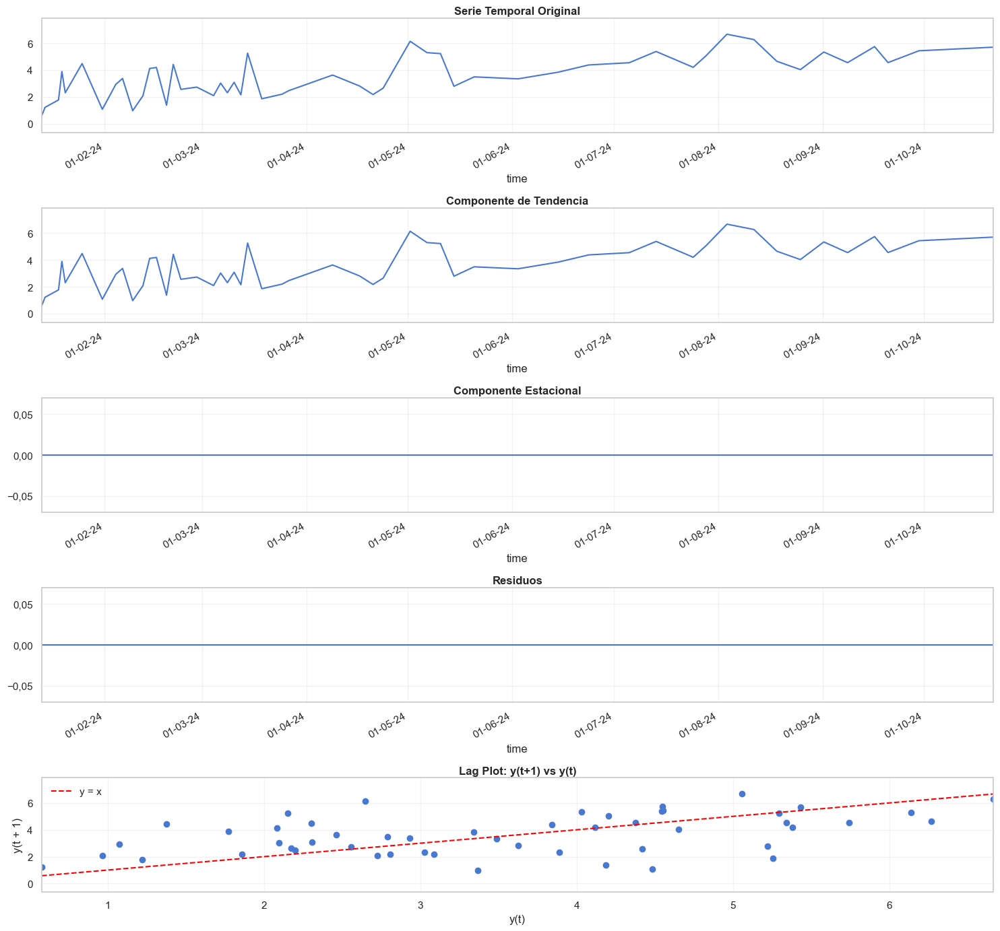

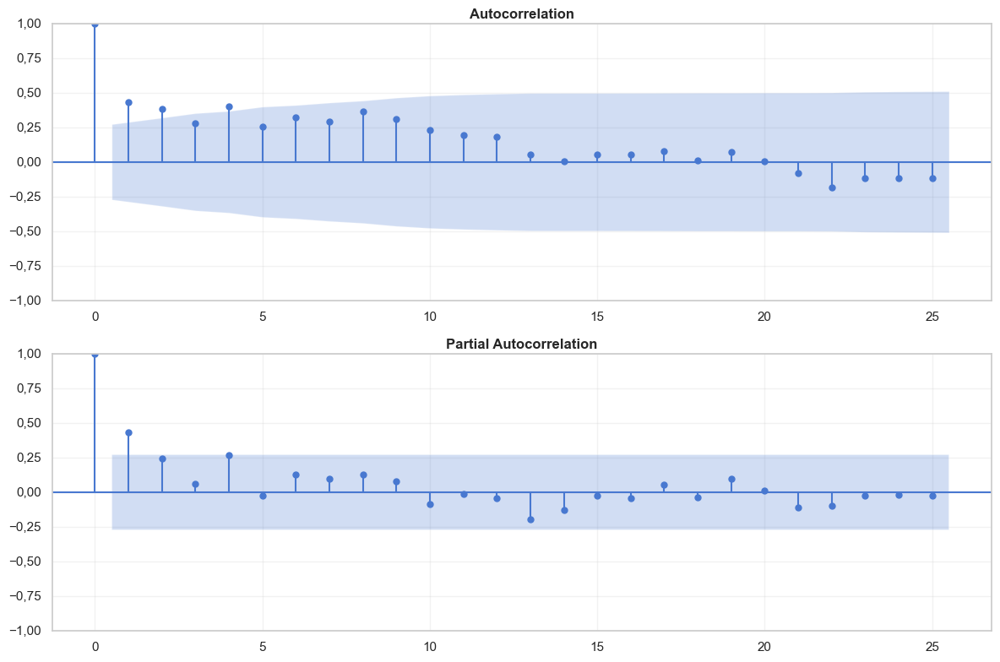

Analizando archivo: DME_CHO.D-CH-2.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


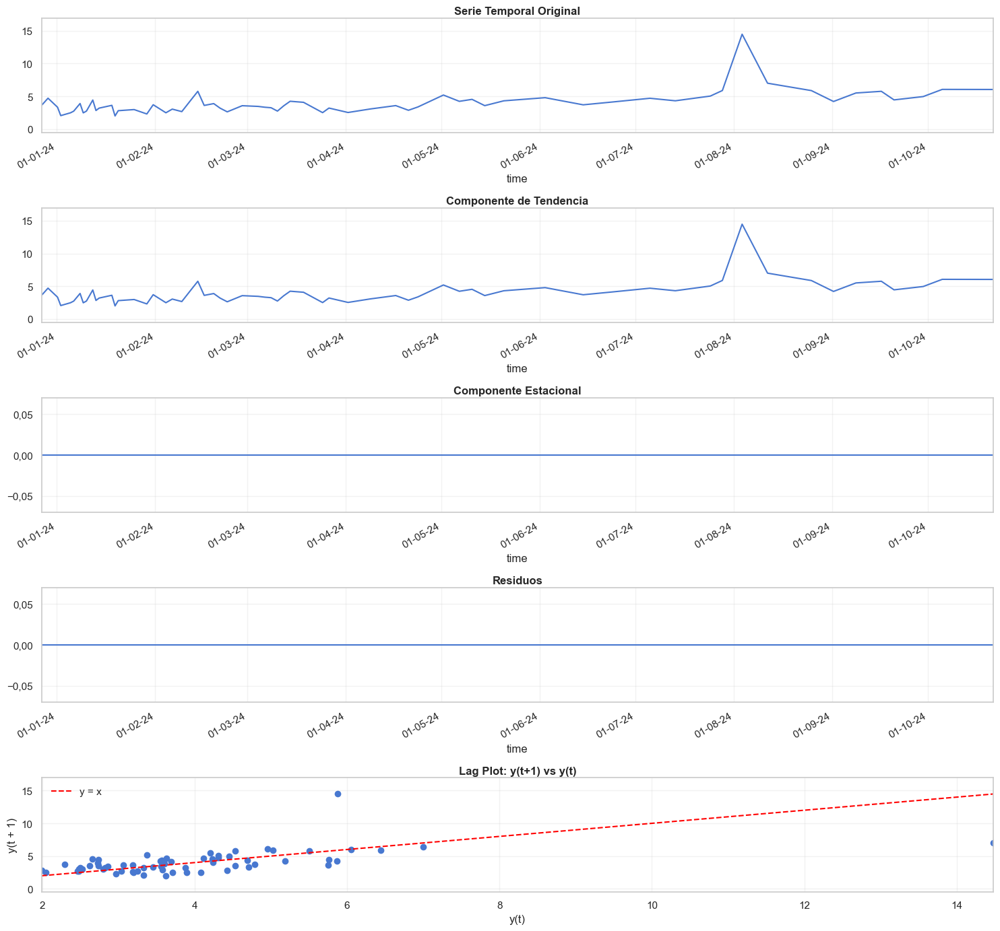

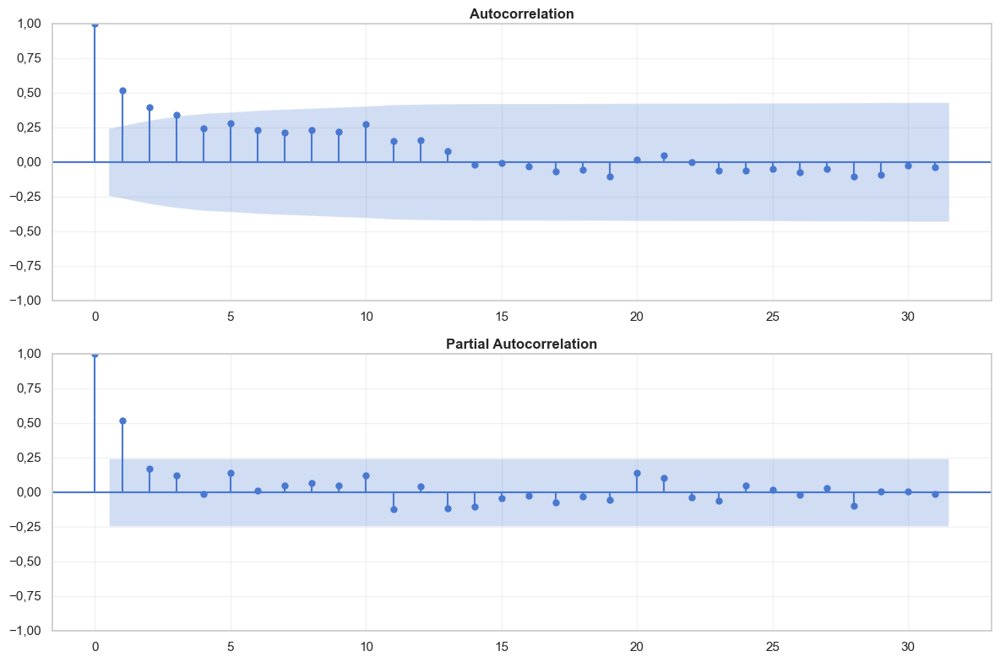

Analizando archivo: DME_CHO.D-CH-3.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


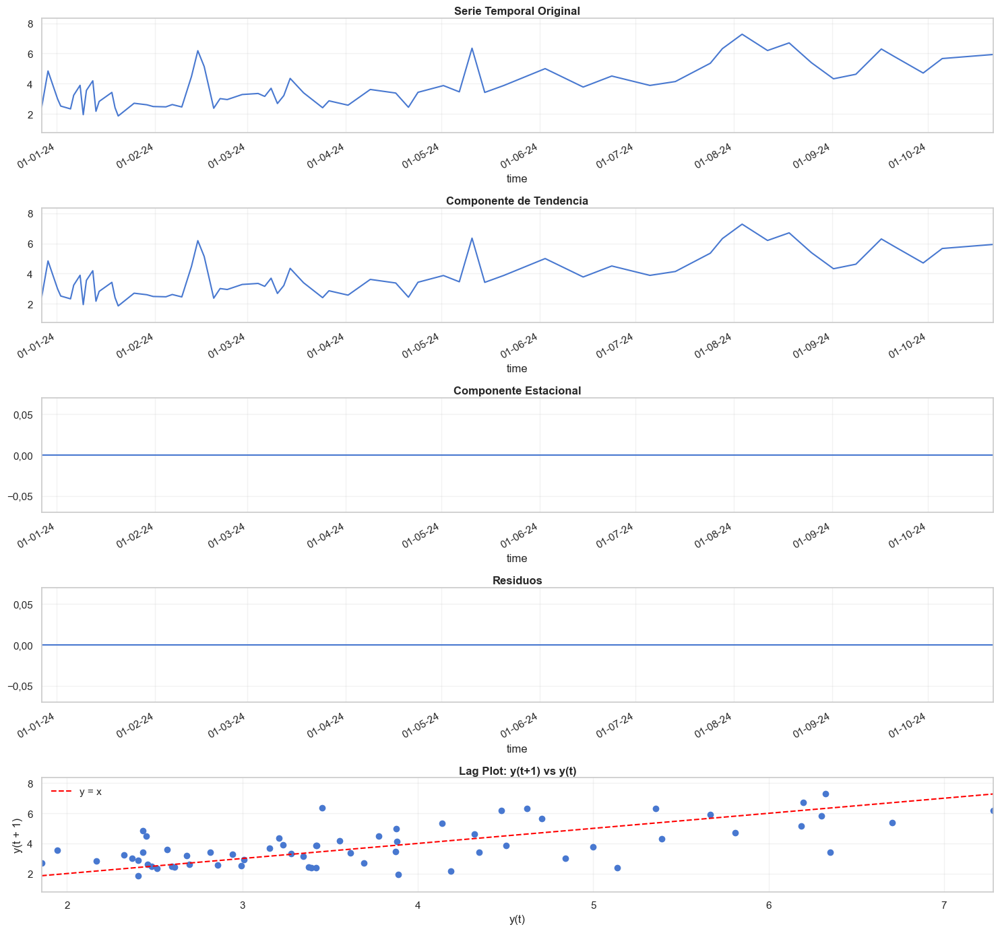

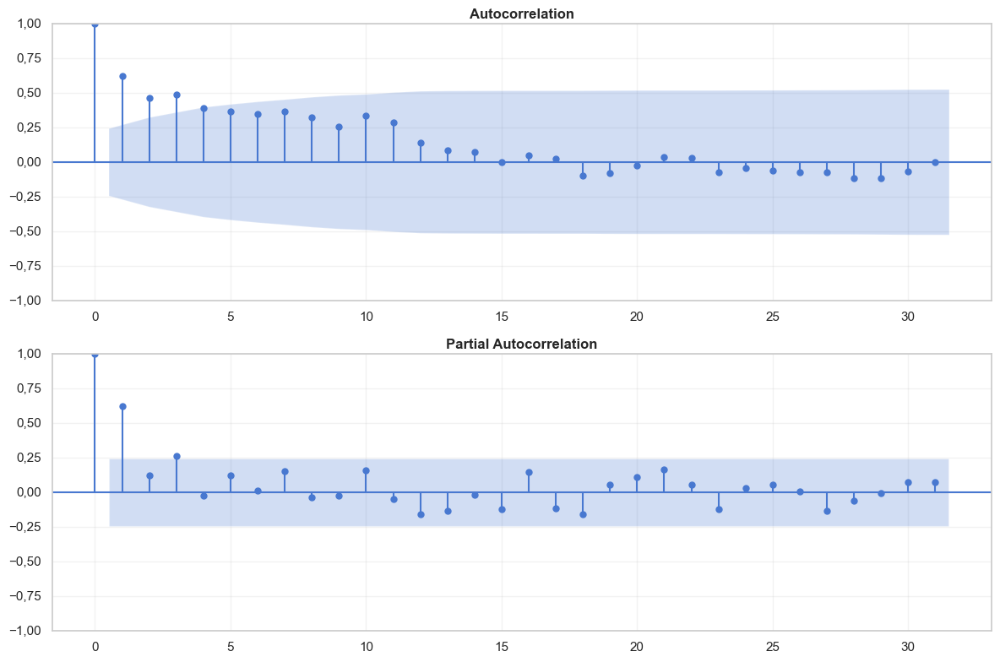

Analizando archivo: DME_CHO.D-CH-31.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.D-CH-32.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.D-CH-33.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.D-CH-34.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.D-CH-35.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_CHO.D-CH-4.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


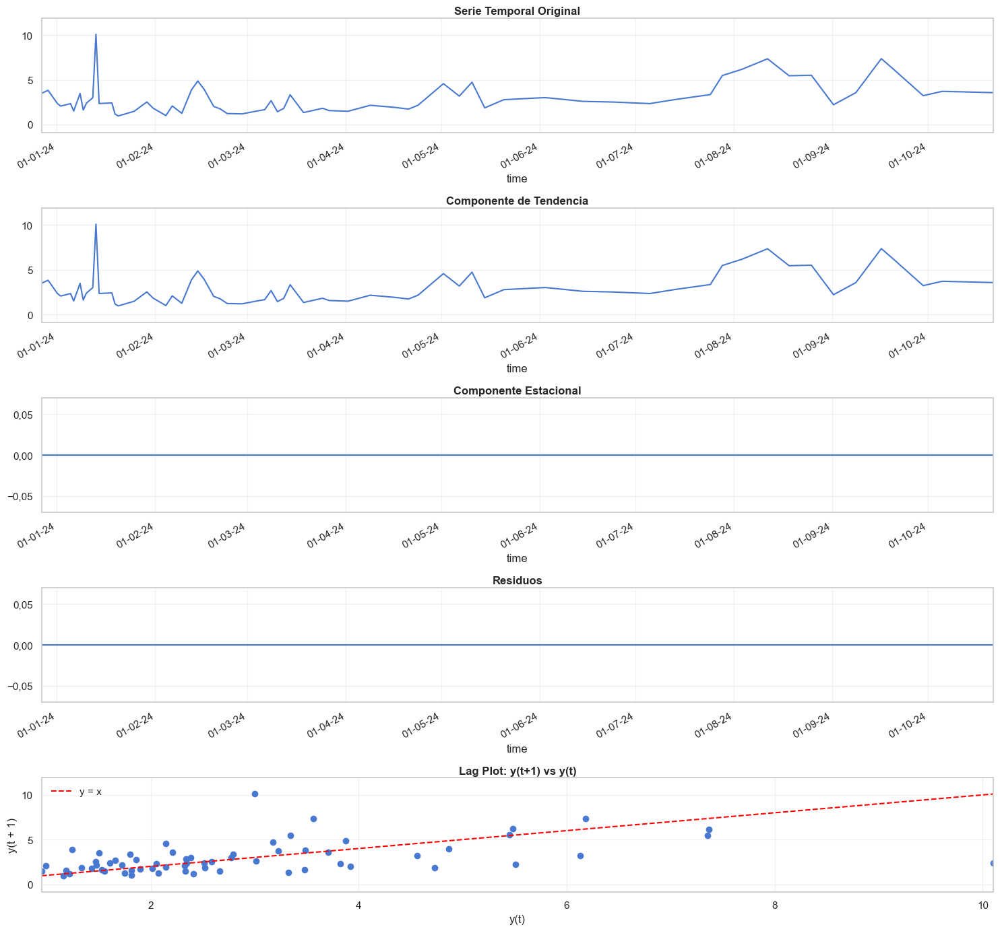

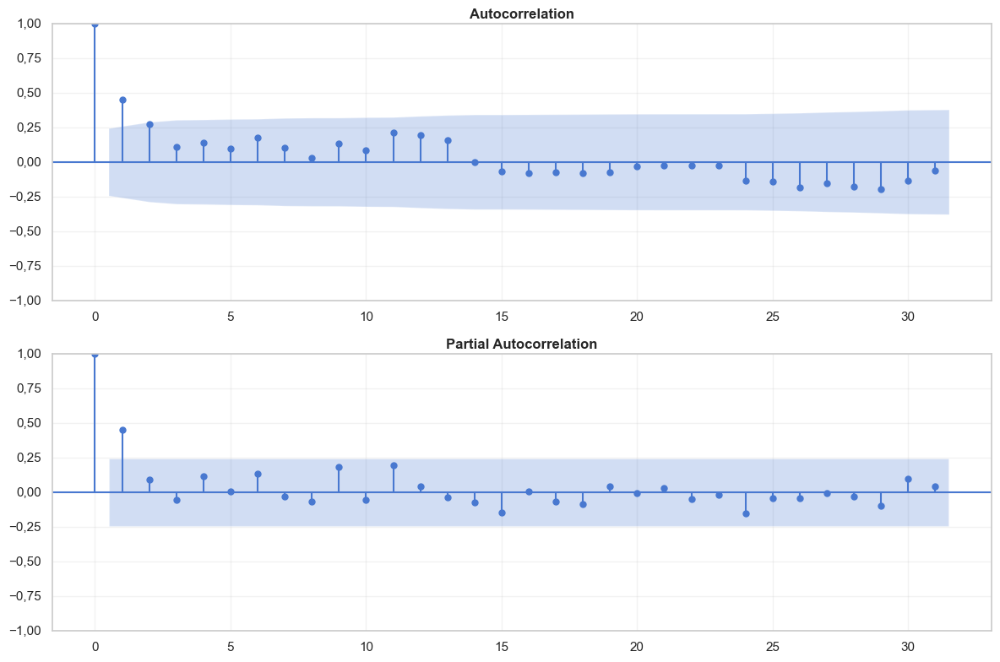

Analizando archivo: DME_CHO.D-CH-5.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


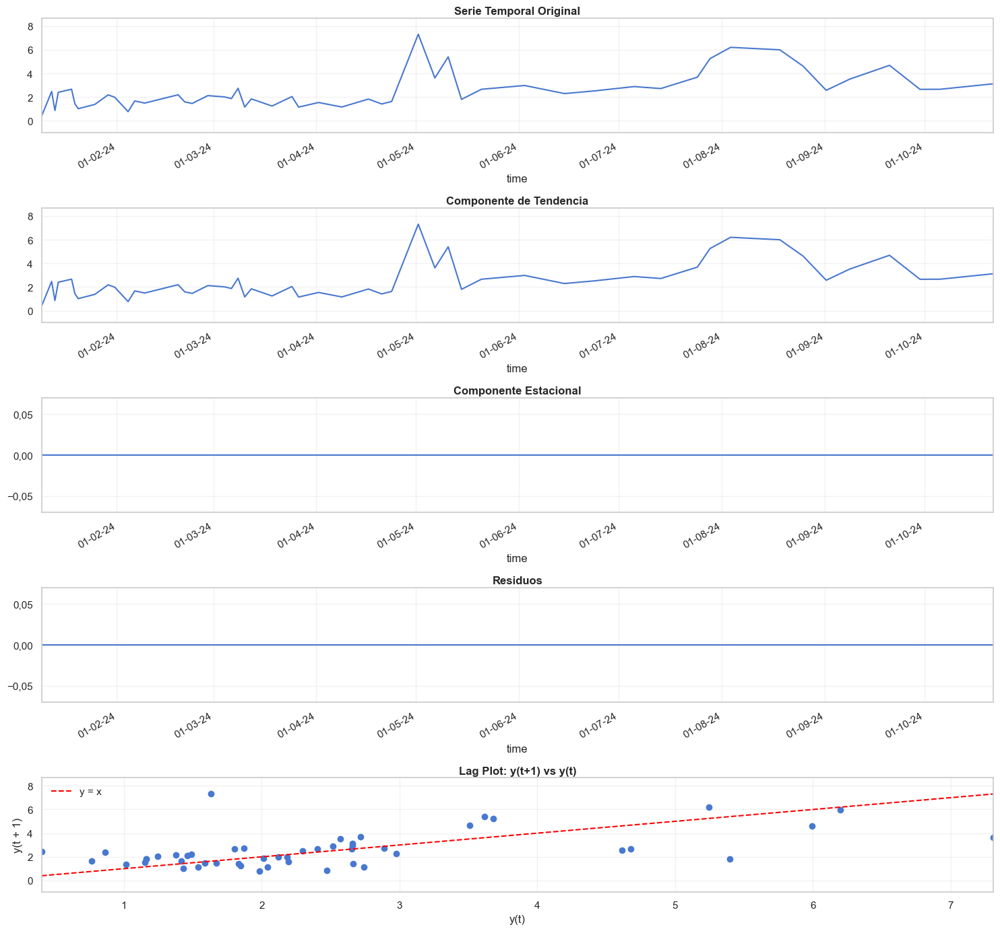

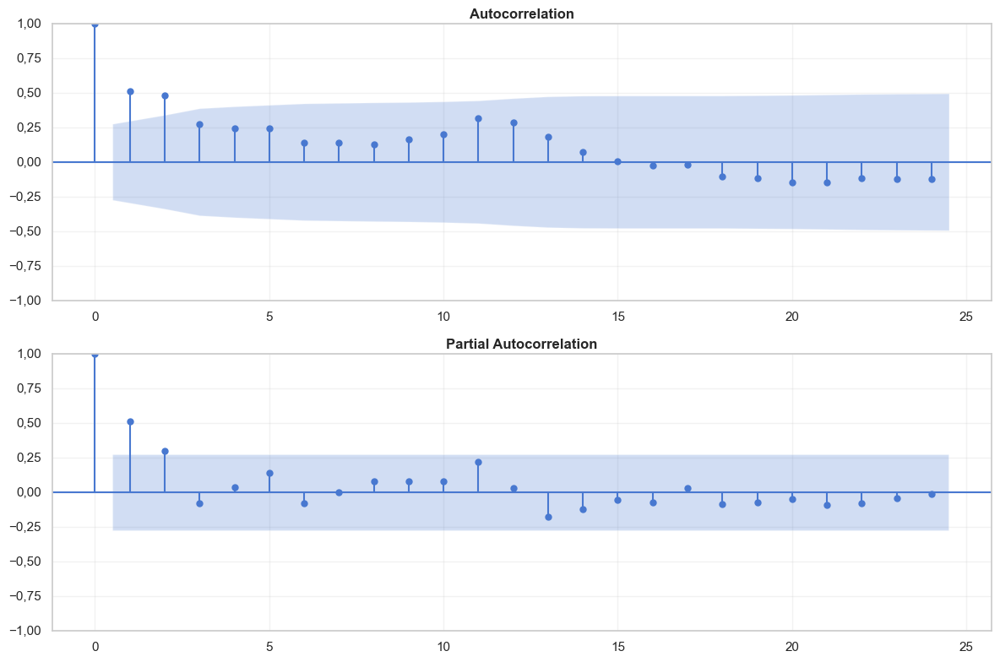

Analizando archivo: DME_CHO.D-CH-6.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


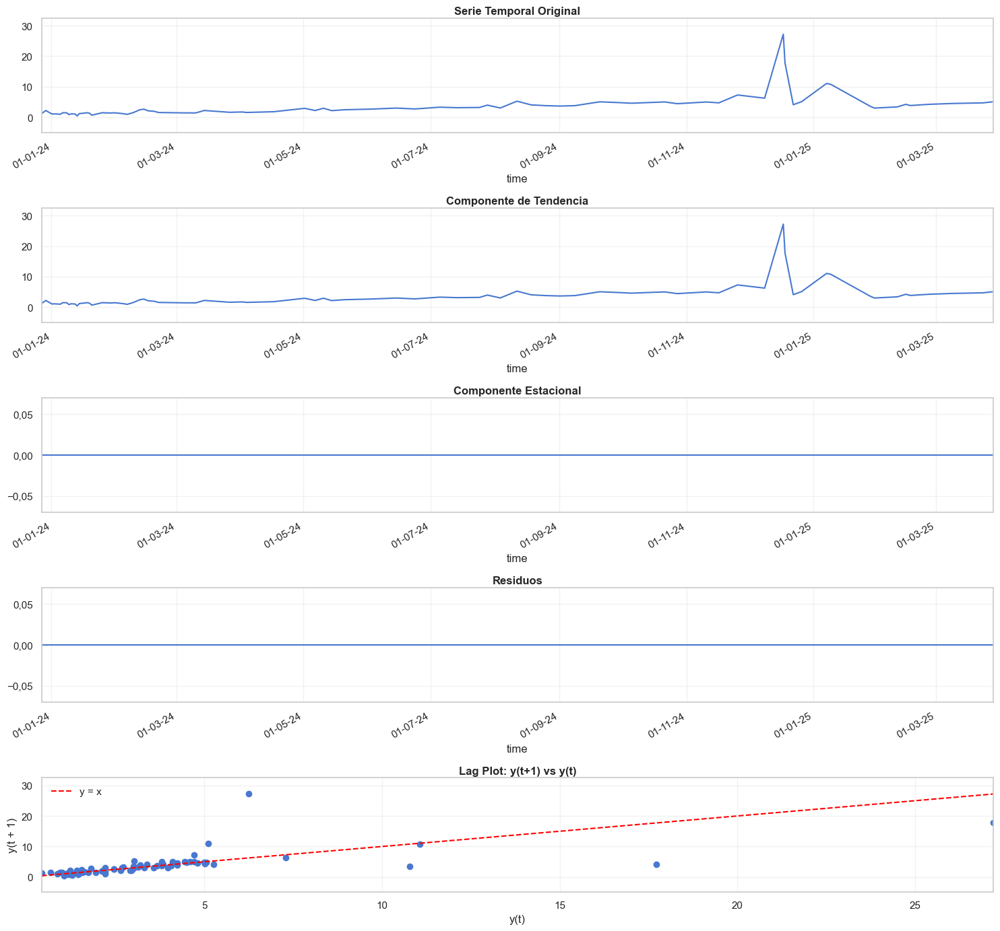

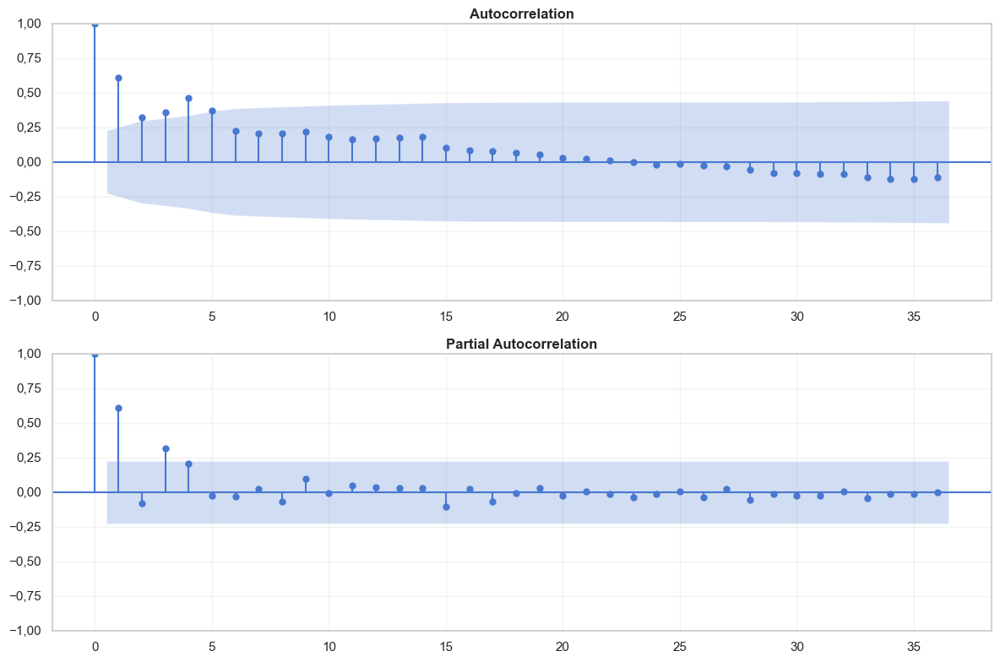

Analizando archivo: DME_CHO.D-CH-7.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


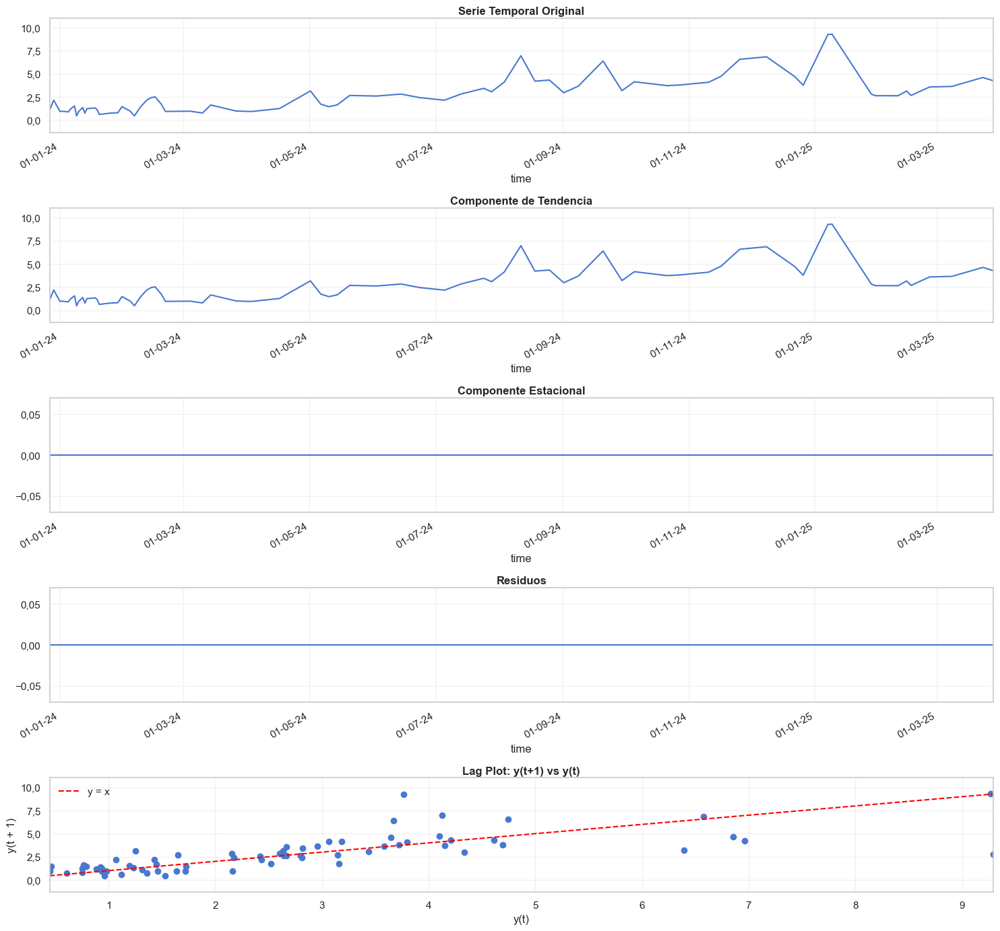

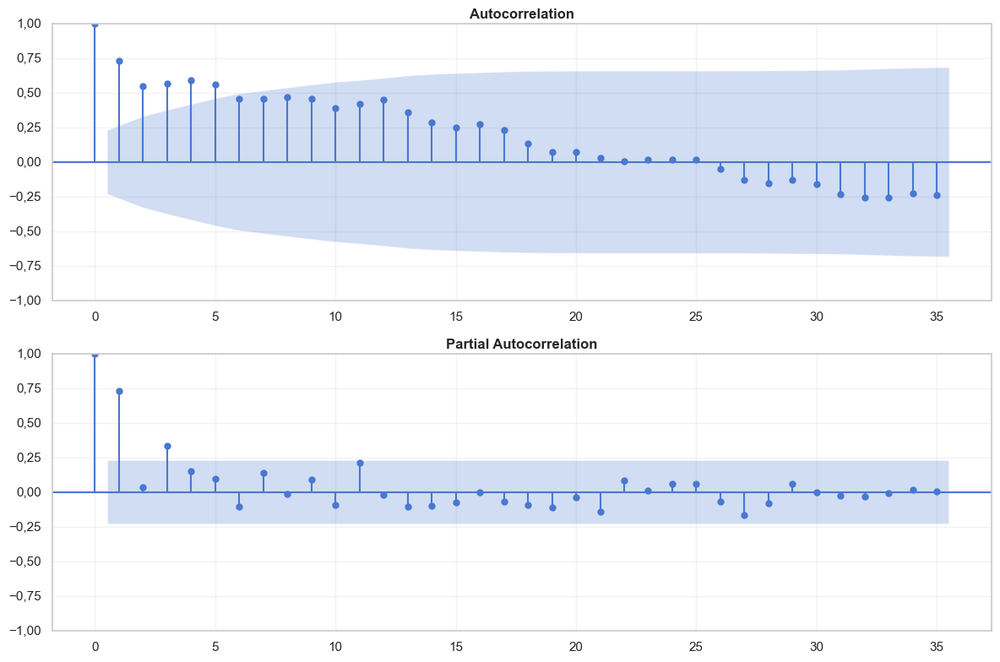

Analizando archivo: DME_CHO.D-CH-8.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


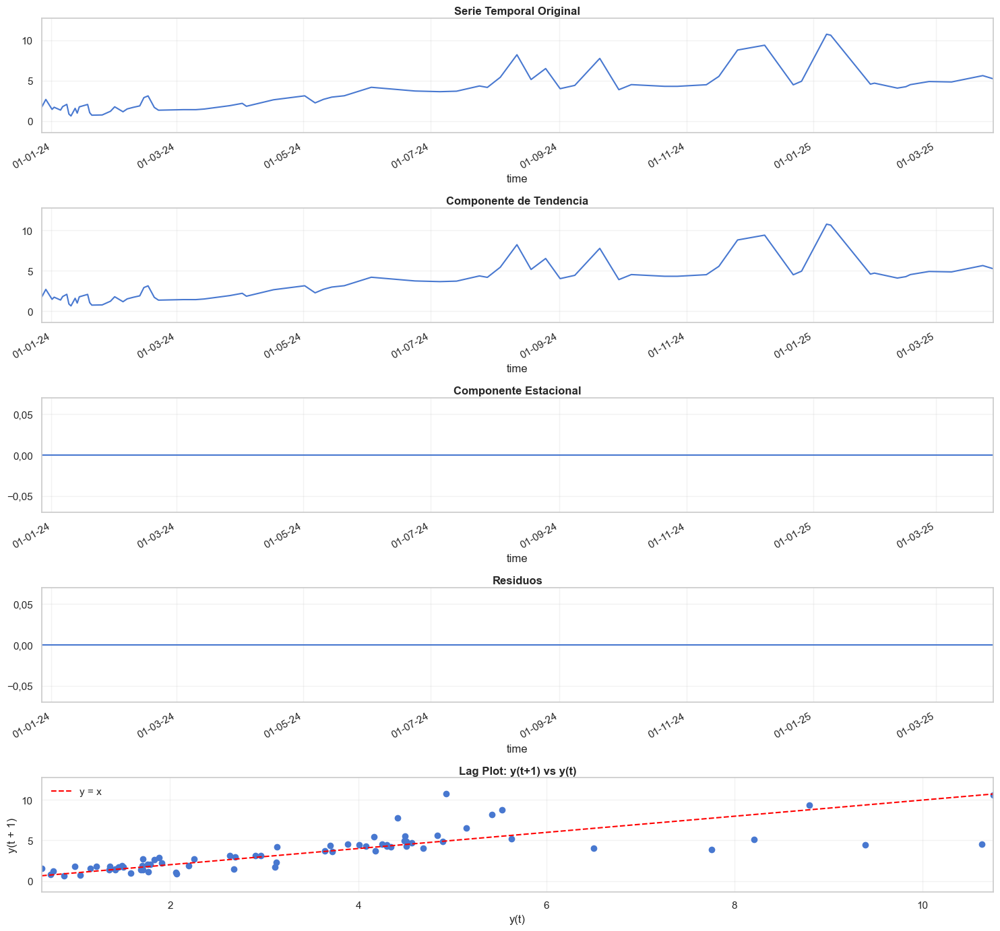

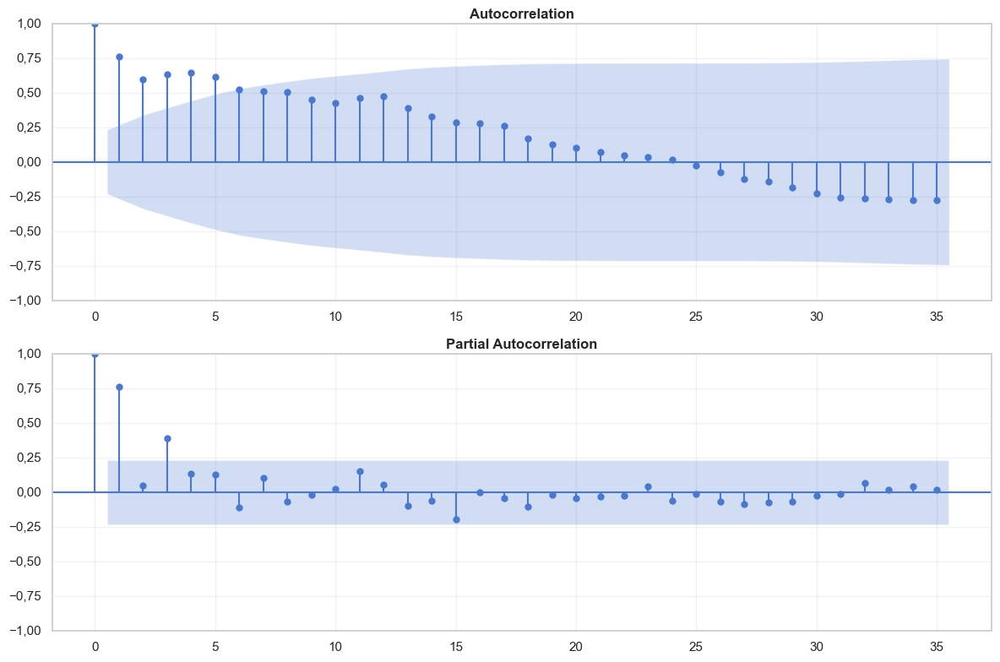

Analizando archivo: DME_CHO.D-CH-9.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


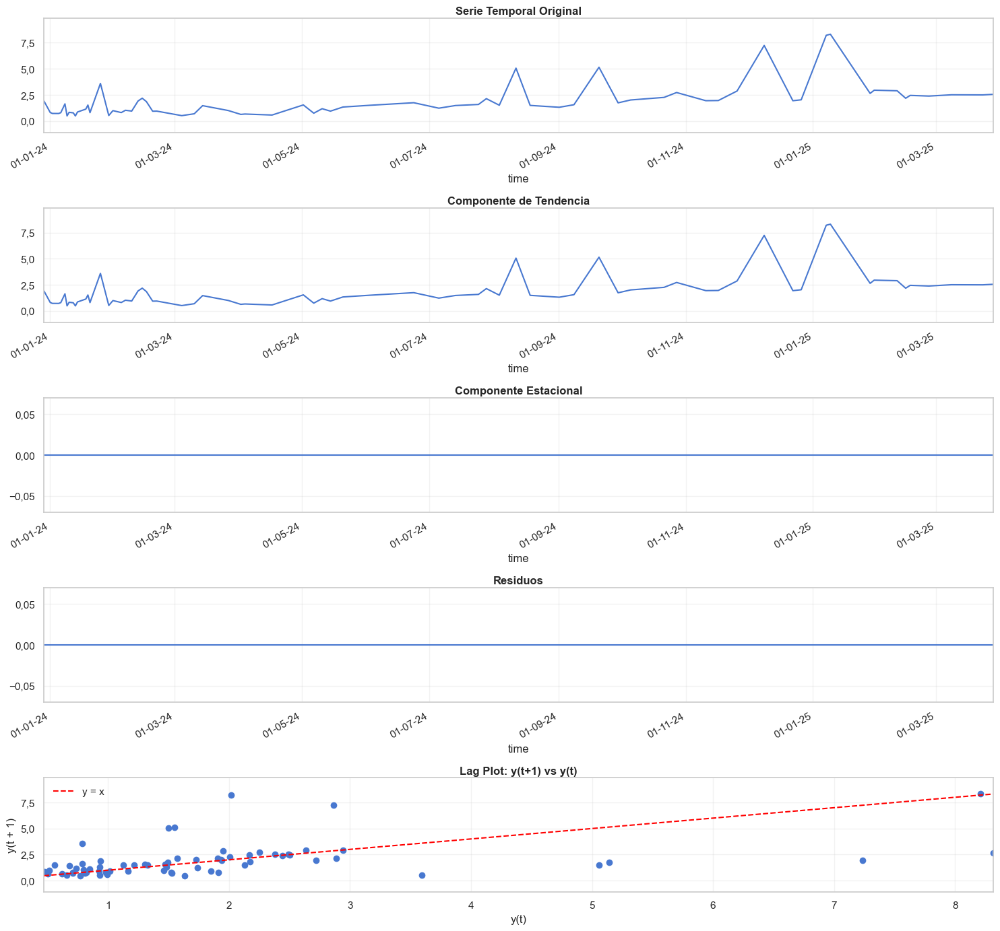

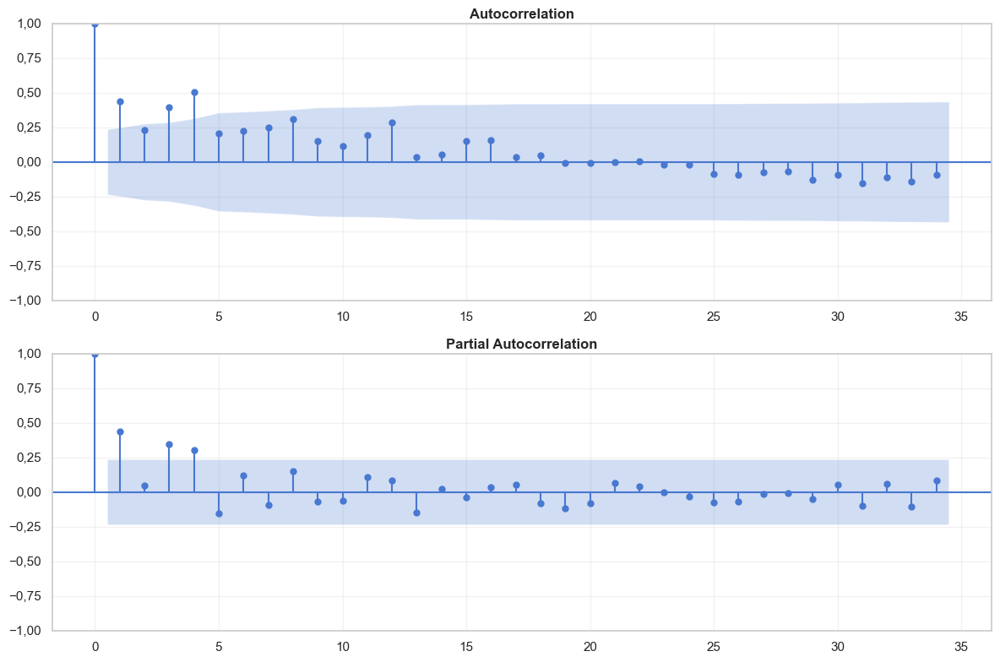

Analizando archivo: DME_SUR.P-01.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


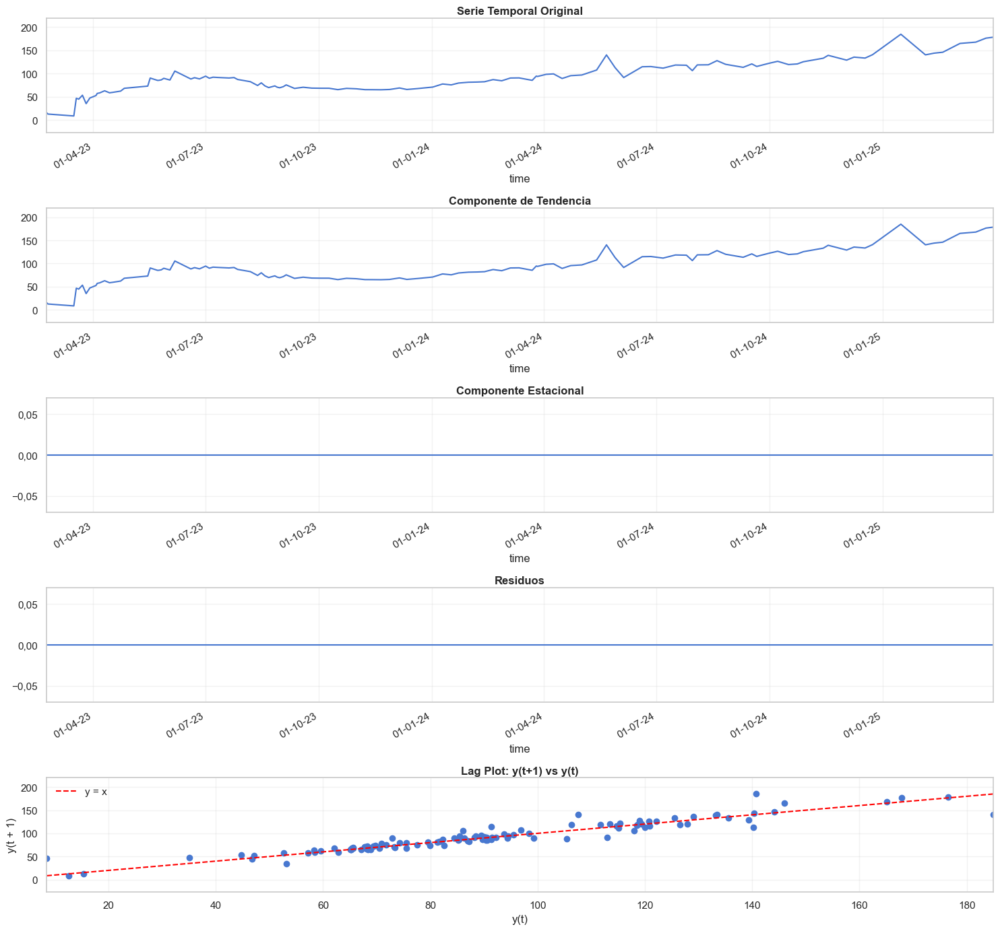

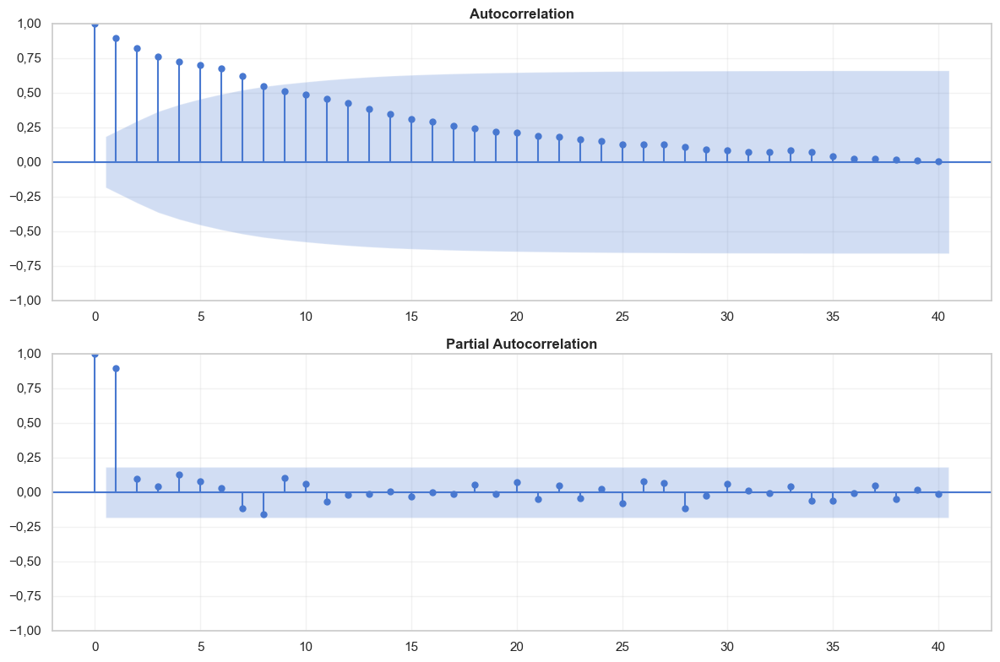

Analizando archivo: DME_SUR.P-02.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


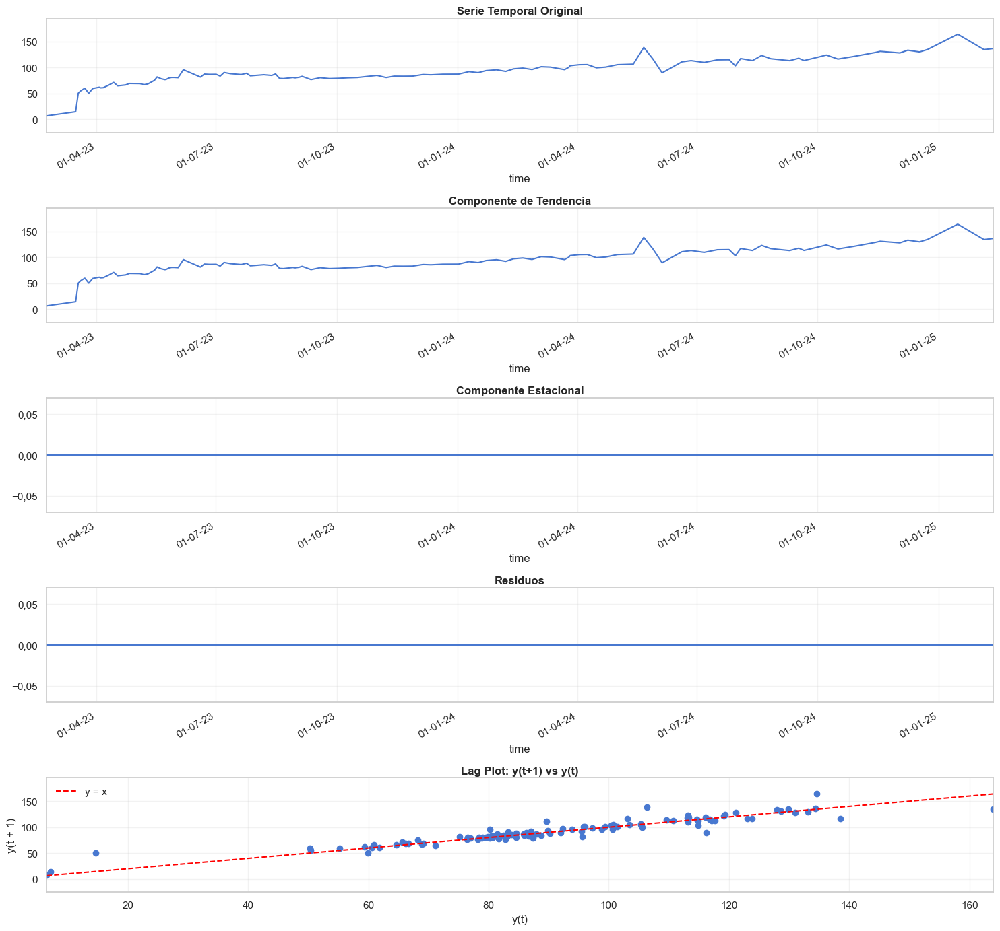

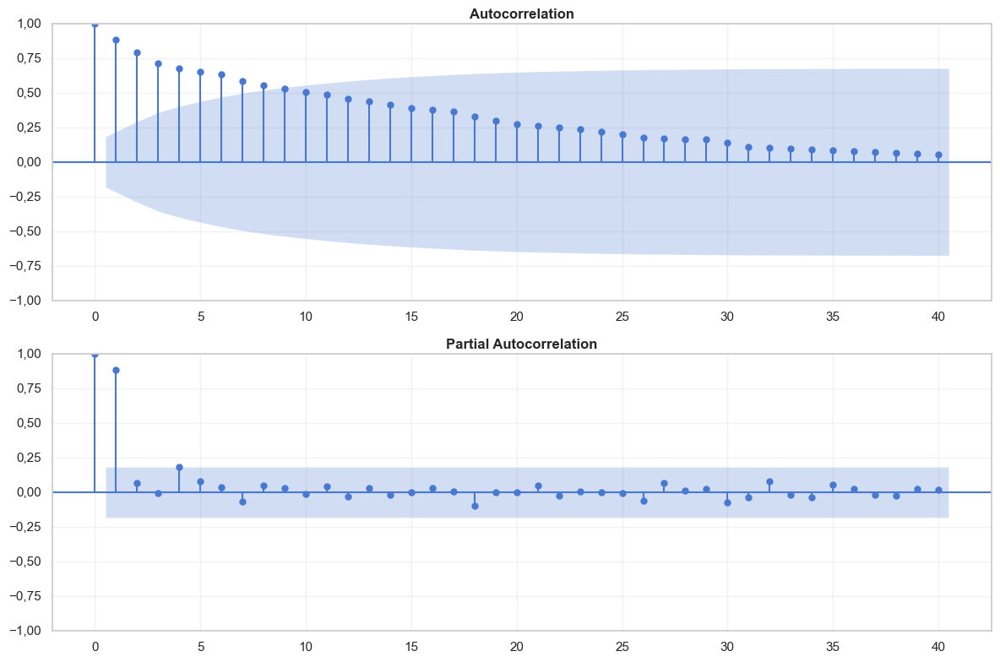

Analizando archivo: DME_SUR.P-03.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


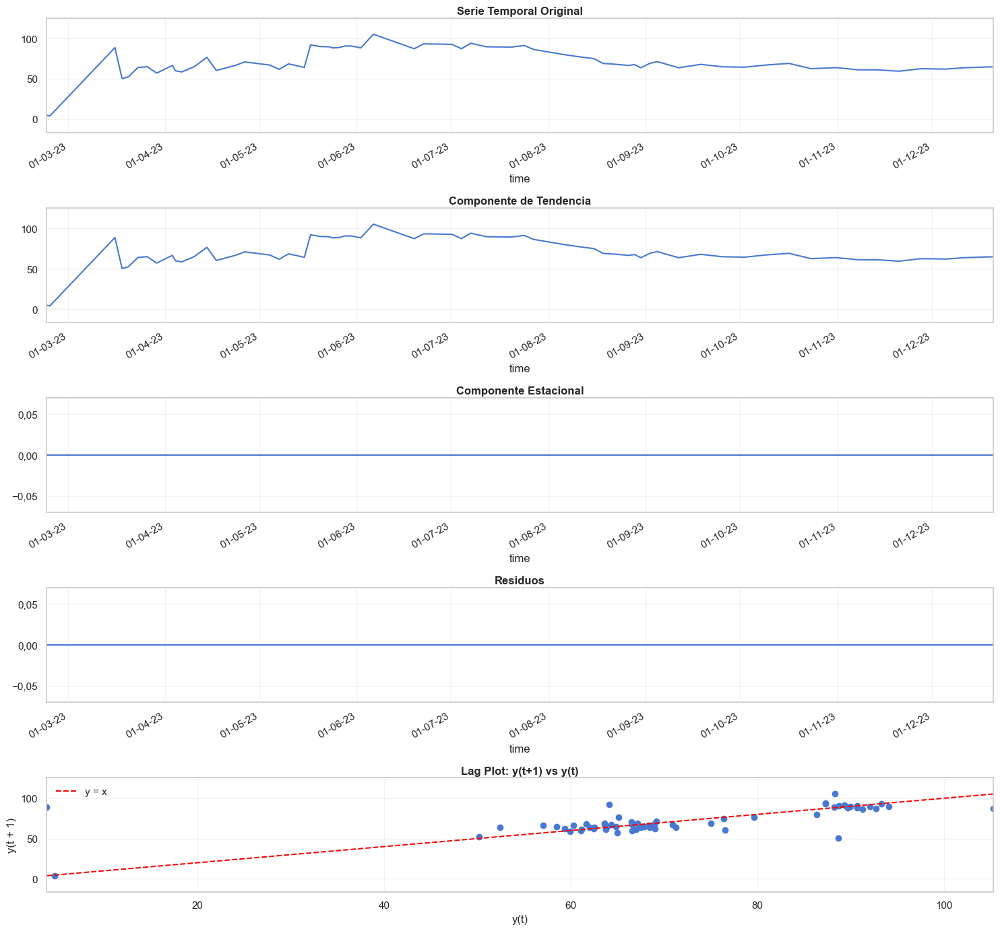

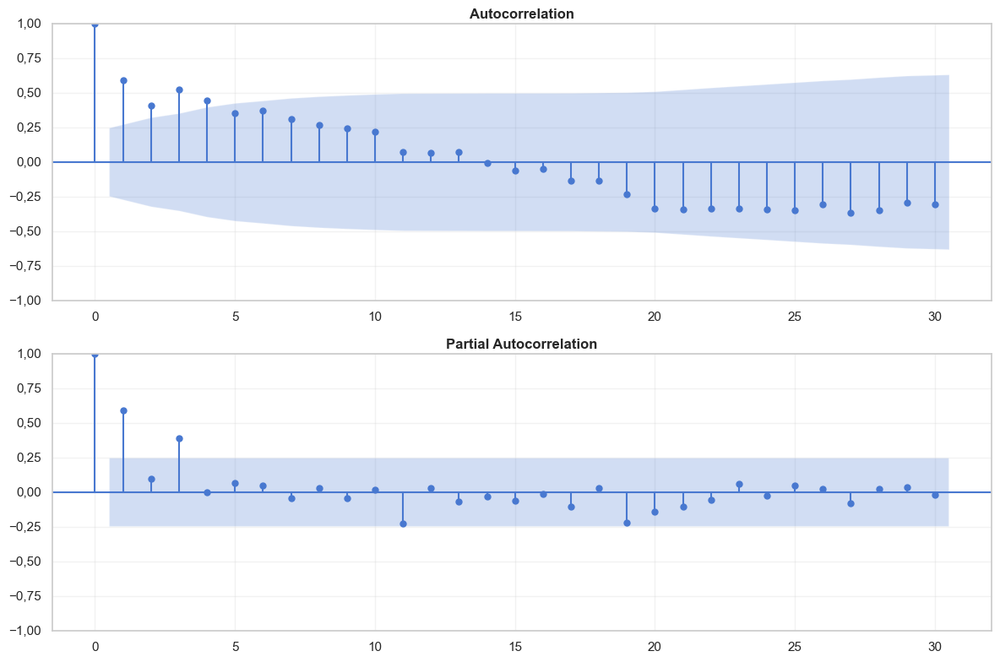

Analizando archivo: DME_SUR.P-04.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-05.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


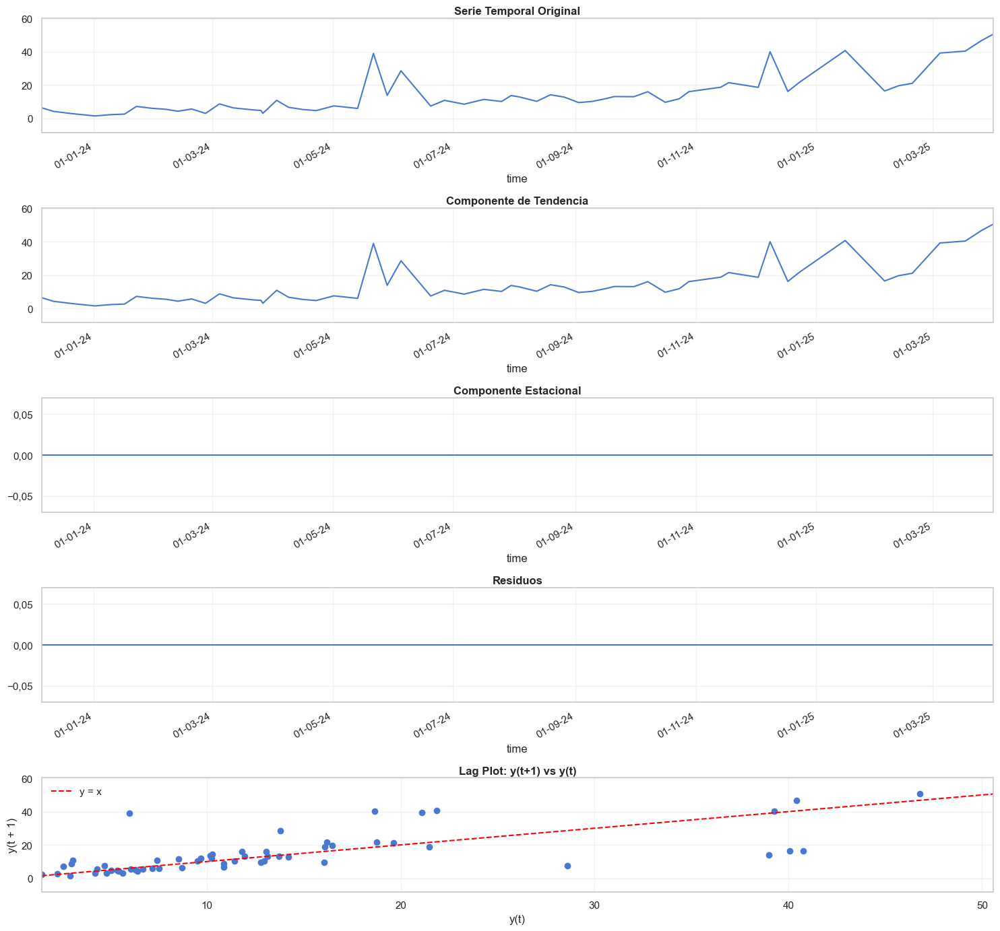

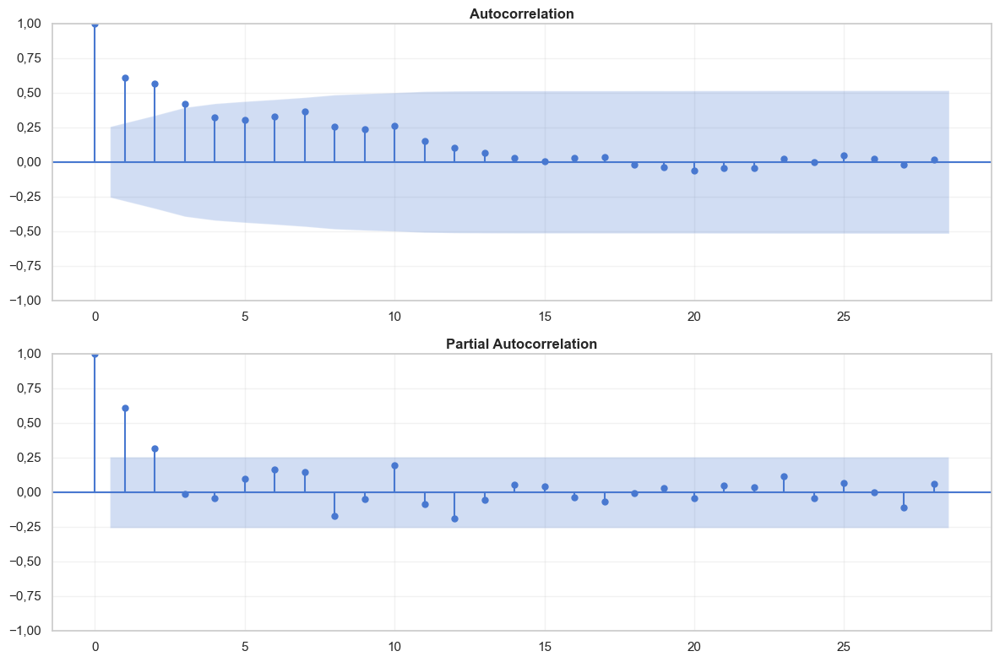

Analizando archivo: DME_SUR.P-06.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


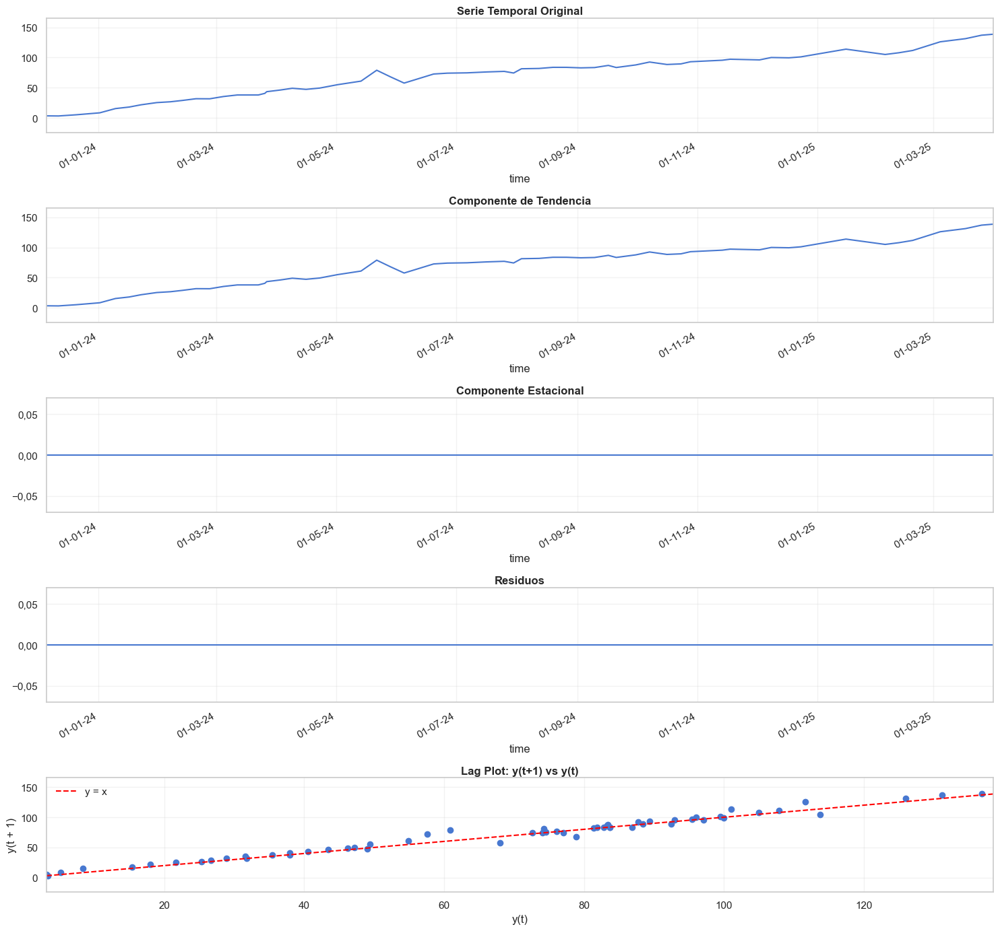

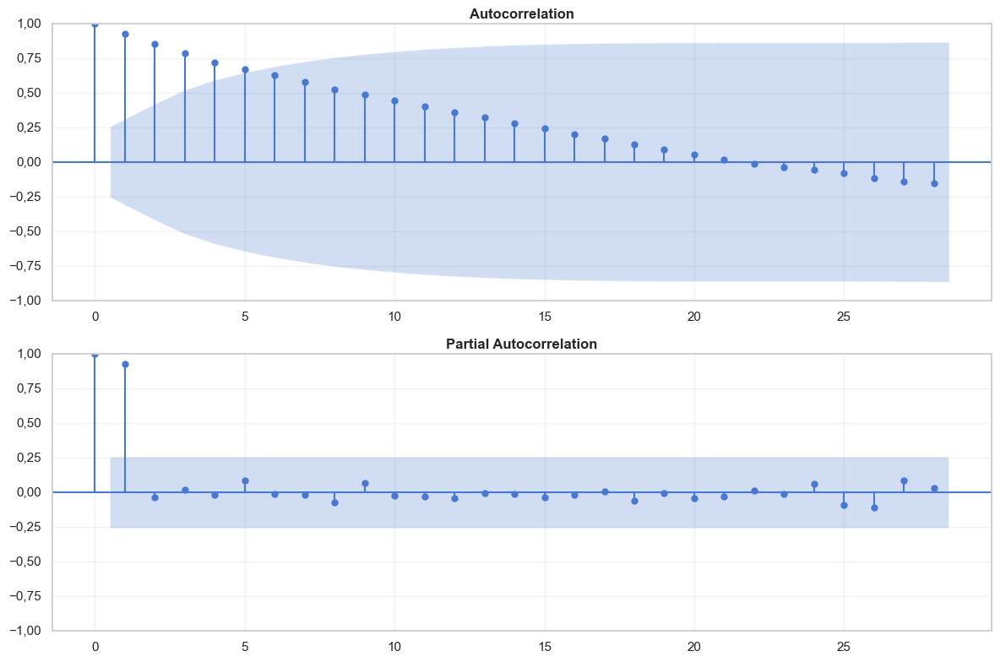

Analizando archivo: DME_SUR.P-07.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


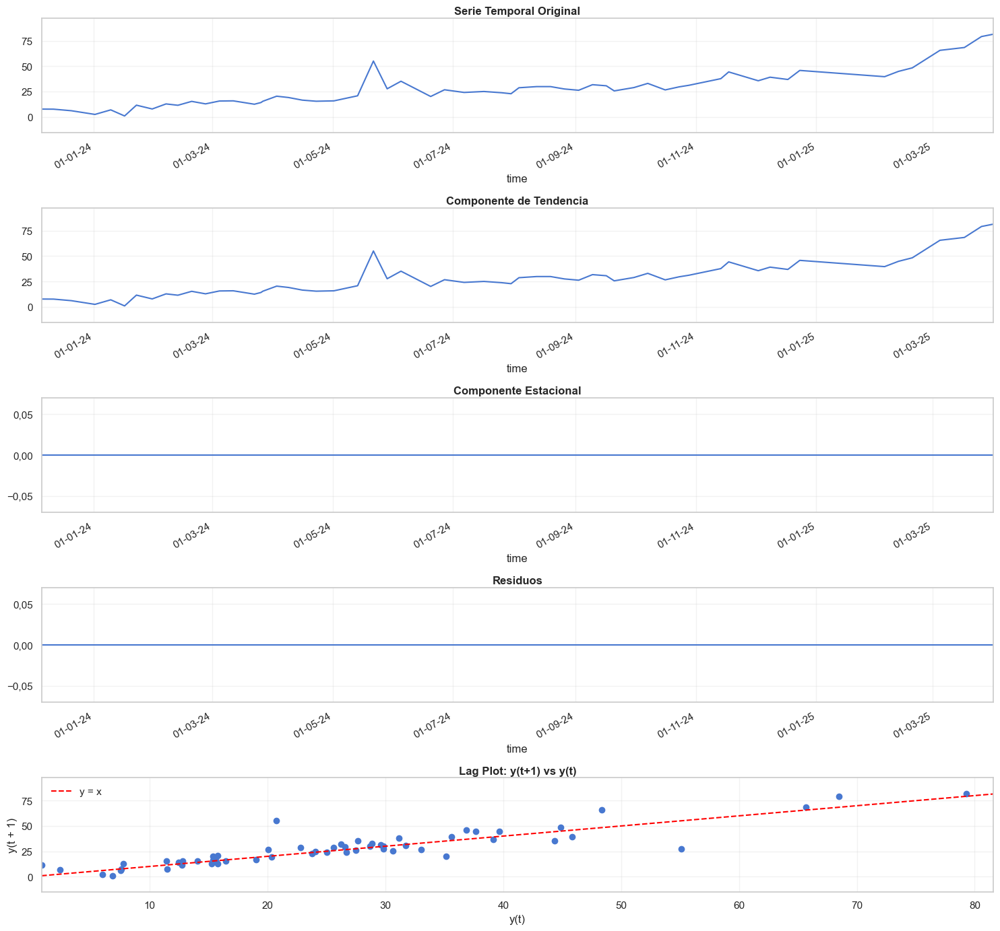

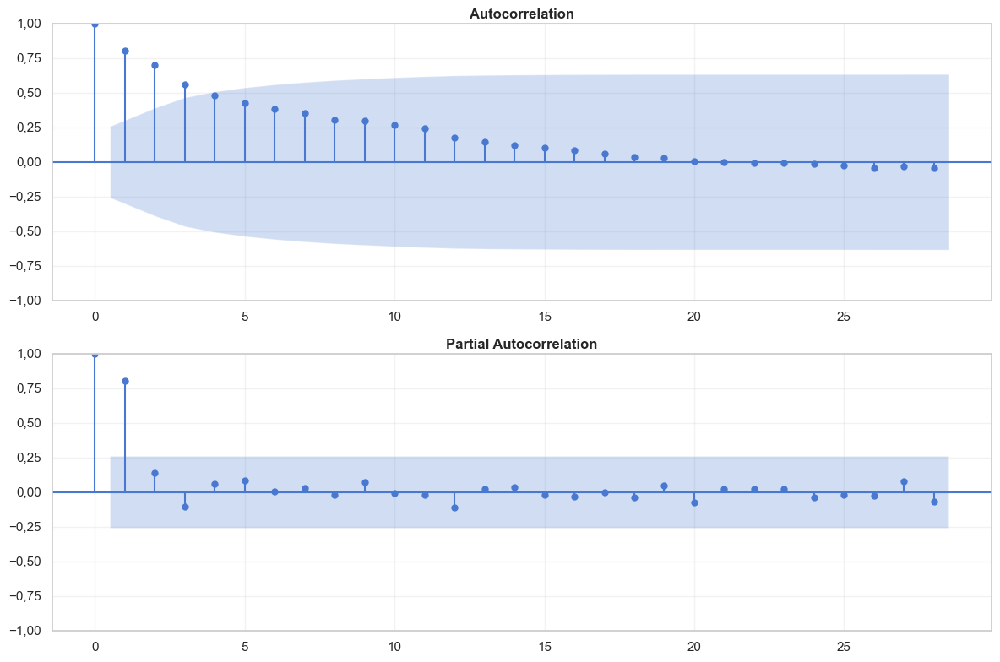

Analizando archivo: DME_SUR.P-08.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


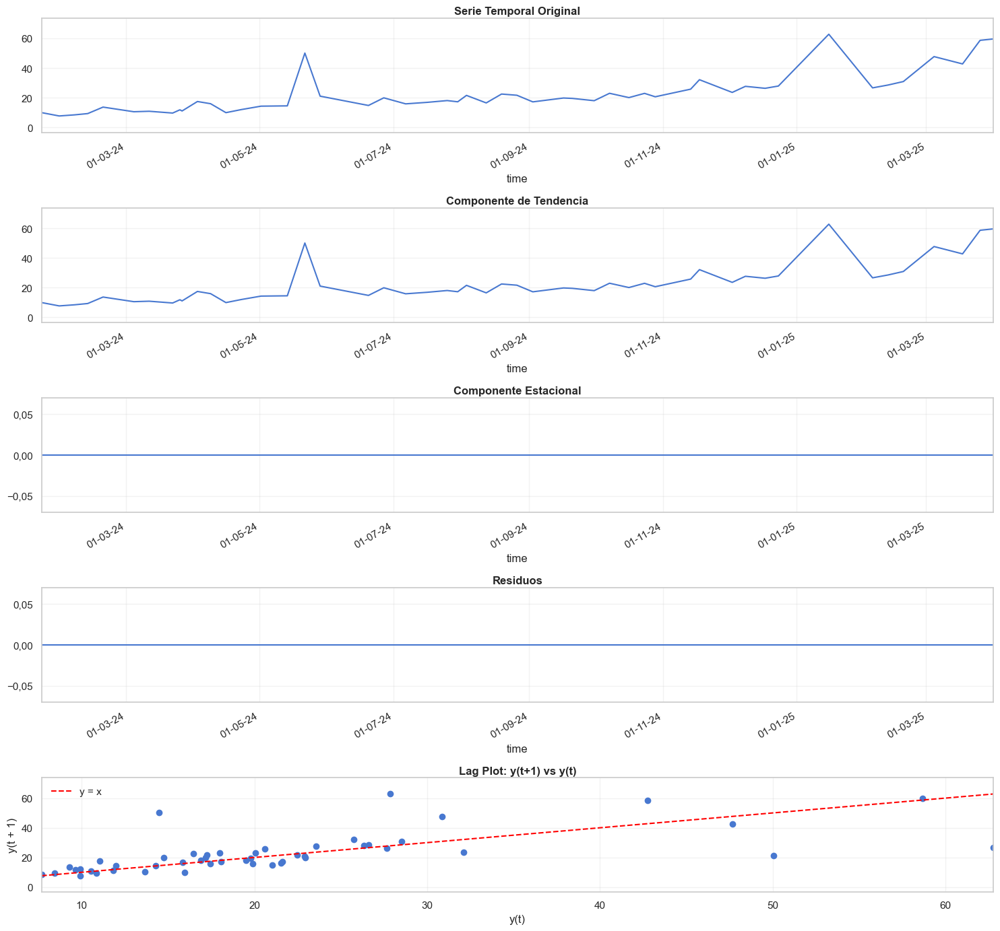

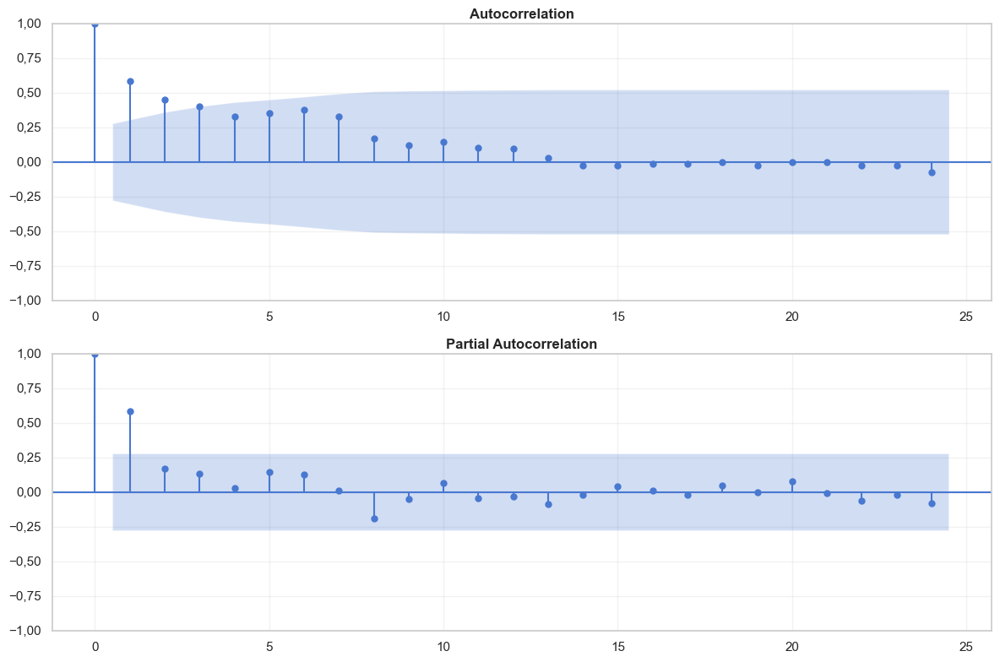

Analizando archivo: DME_SUR.P-09.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-10.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-11.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


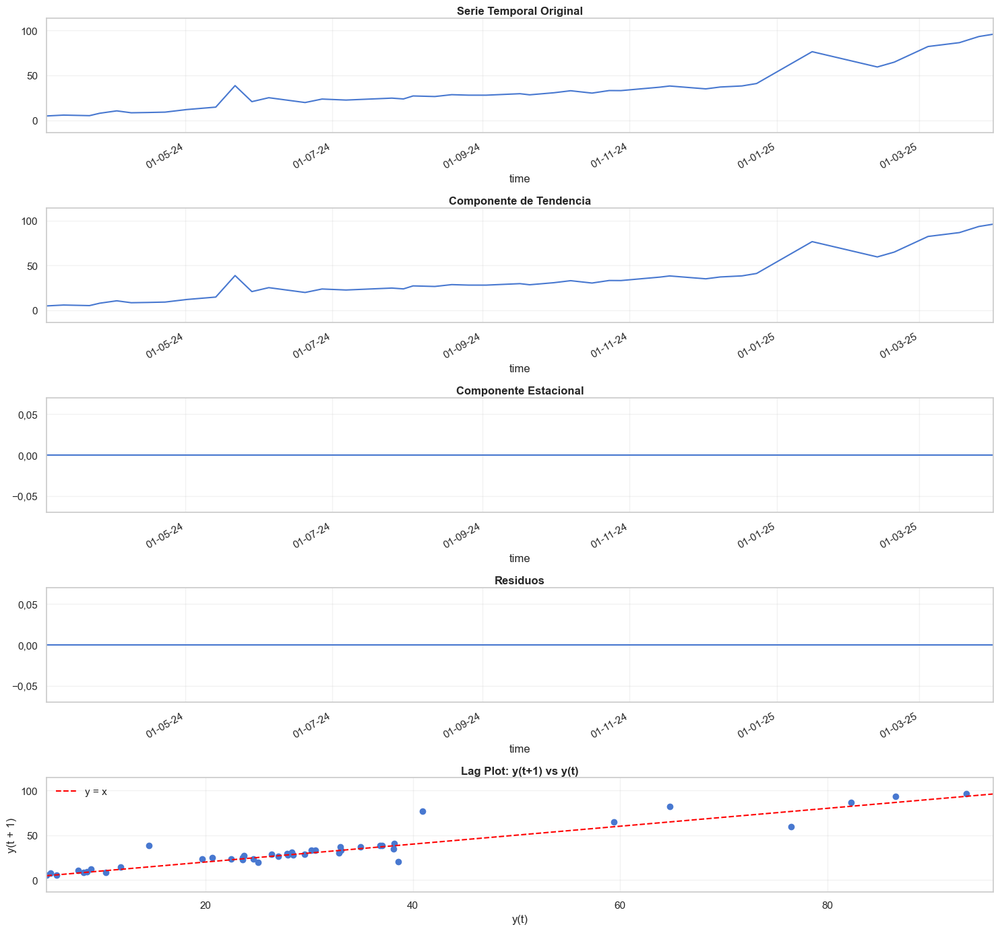

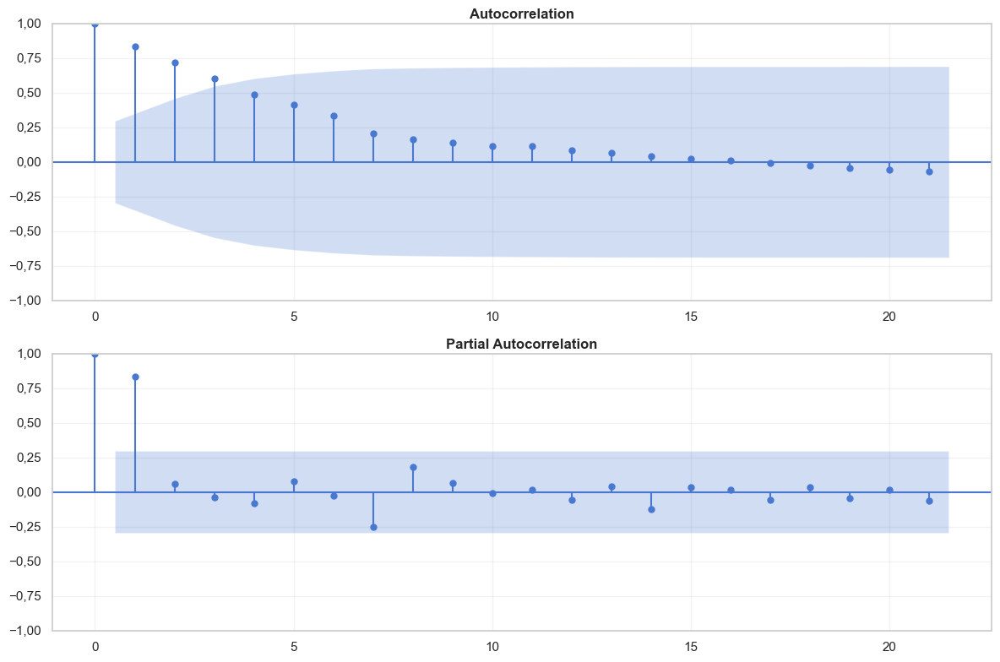

Analizando archivo: DME_SUR.P-12.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


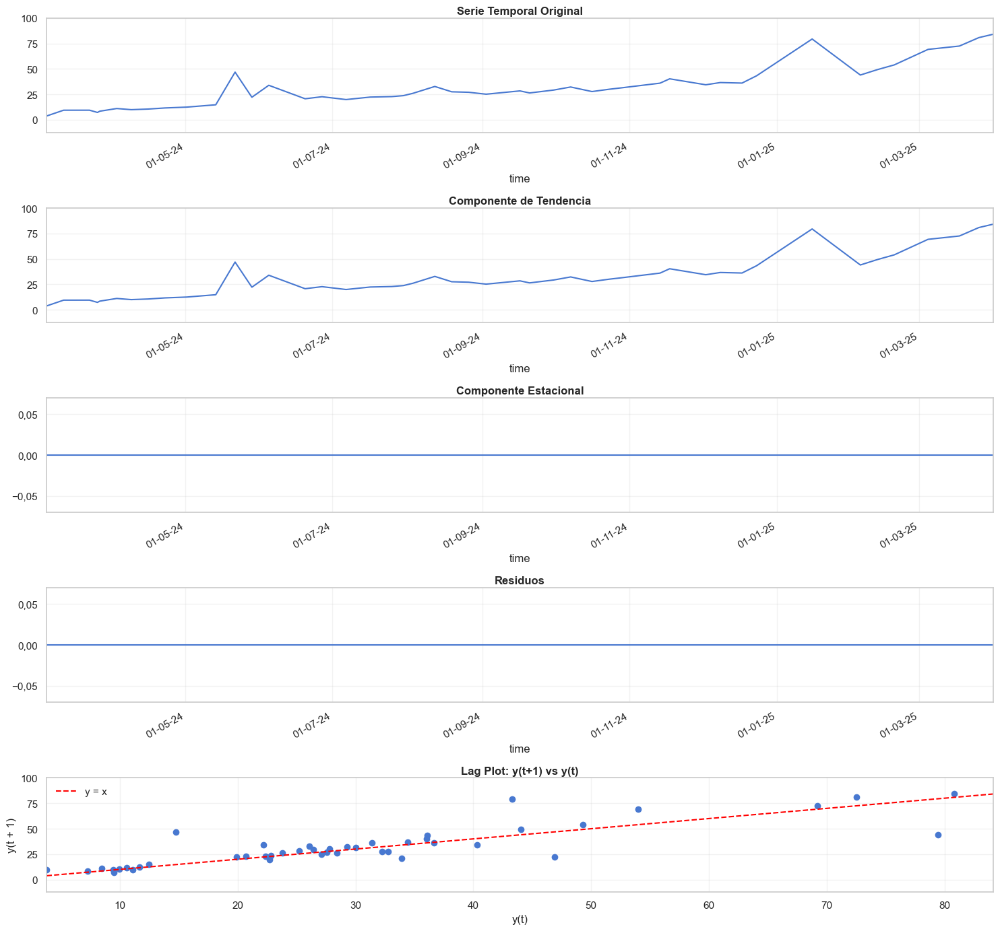

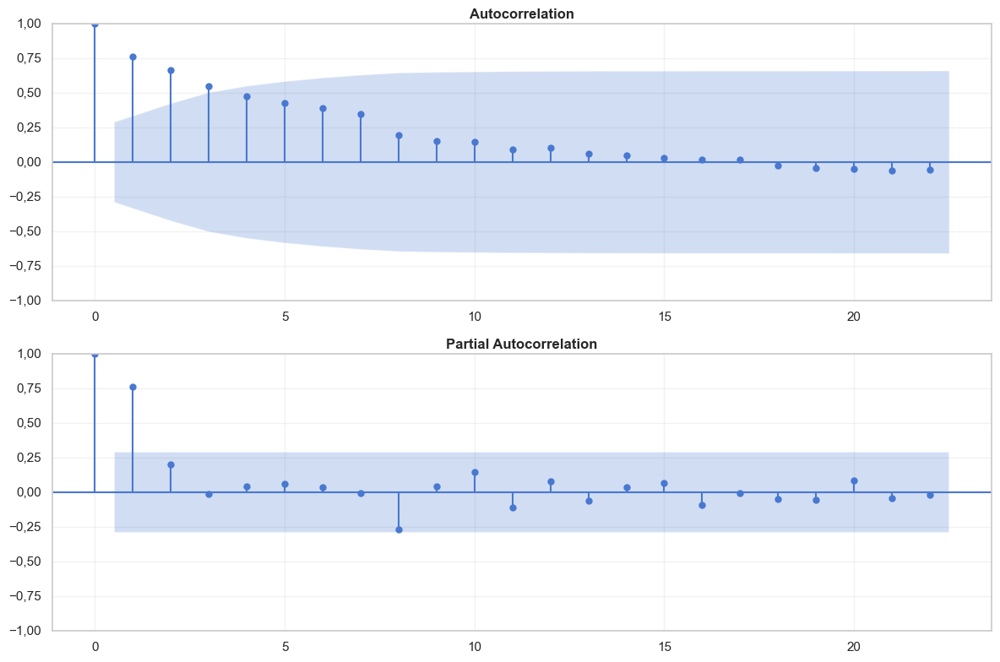

Analizando archivo: DME_SUR.P-13.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-14.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-15.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-16.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-17.csv
No hay suficientes datos para analizar.
Analizando archivo: DME_SUR.P-18.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2A.CA1.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2A.CA10.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


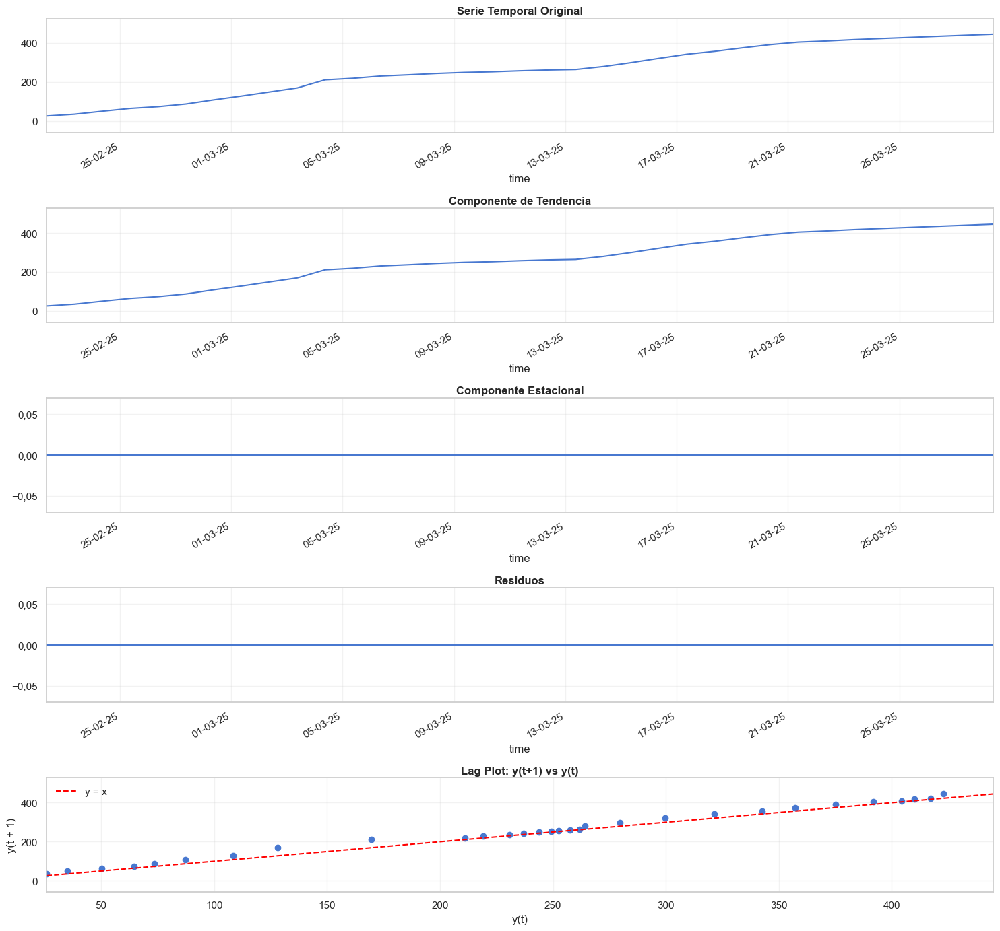

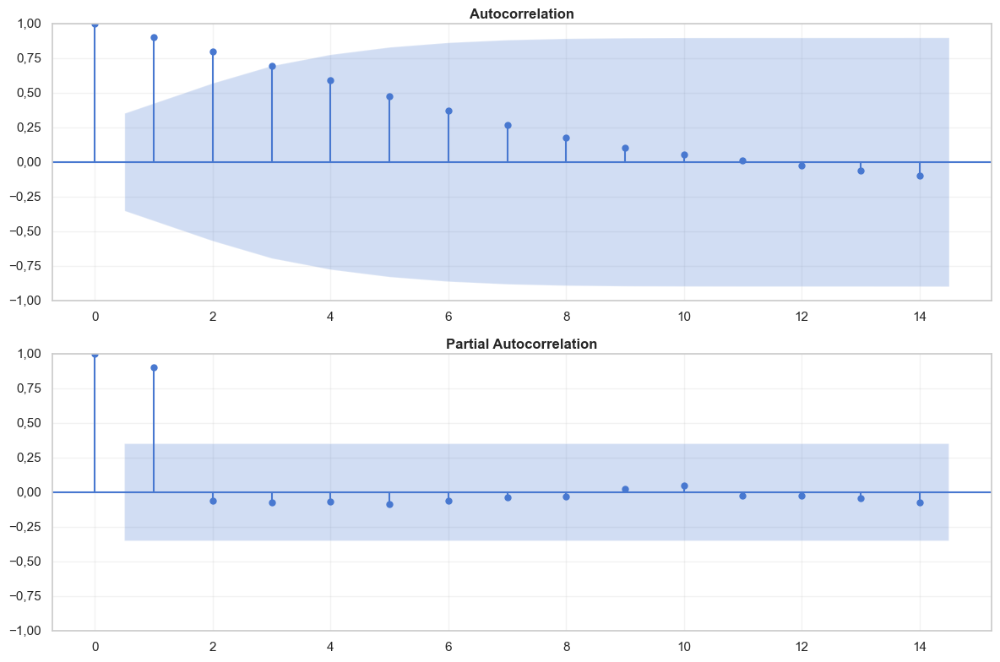

Analizando archivo: PAD_2A.CA11.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


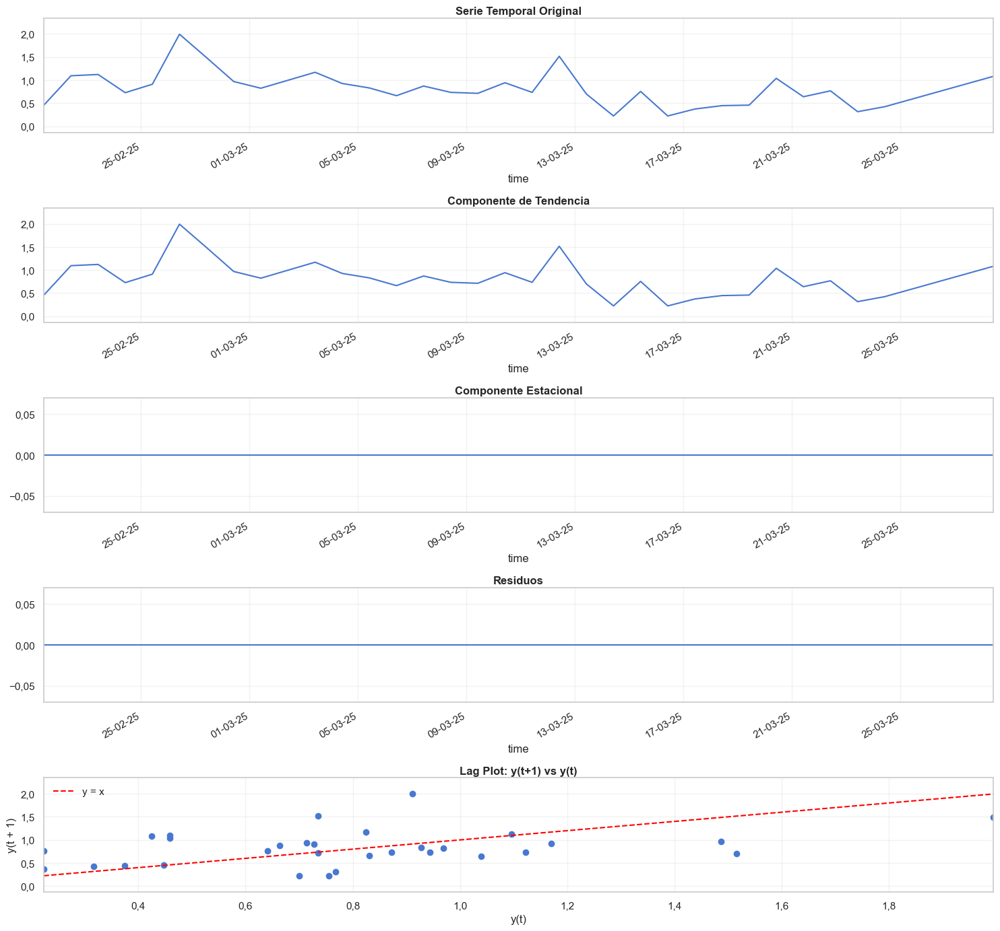

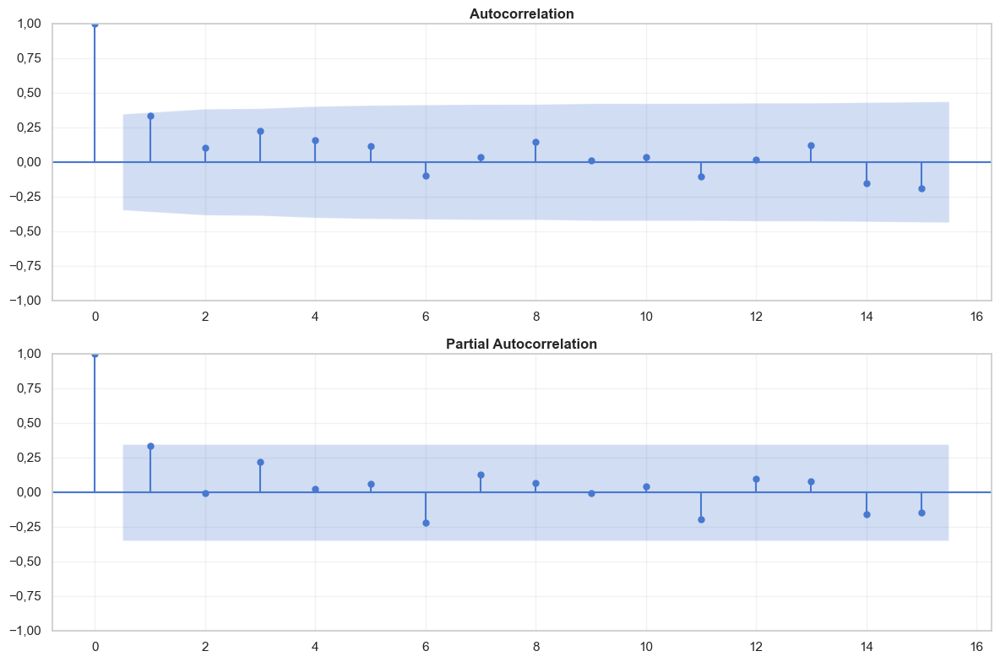

Analizando archivo: PAD_2A.CA2.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2A.CA3.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


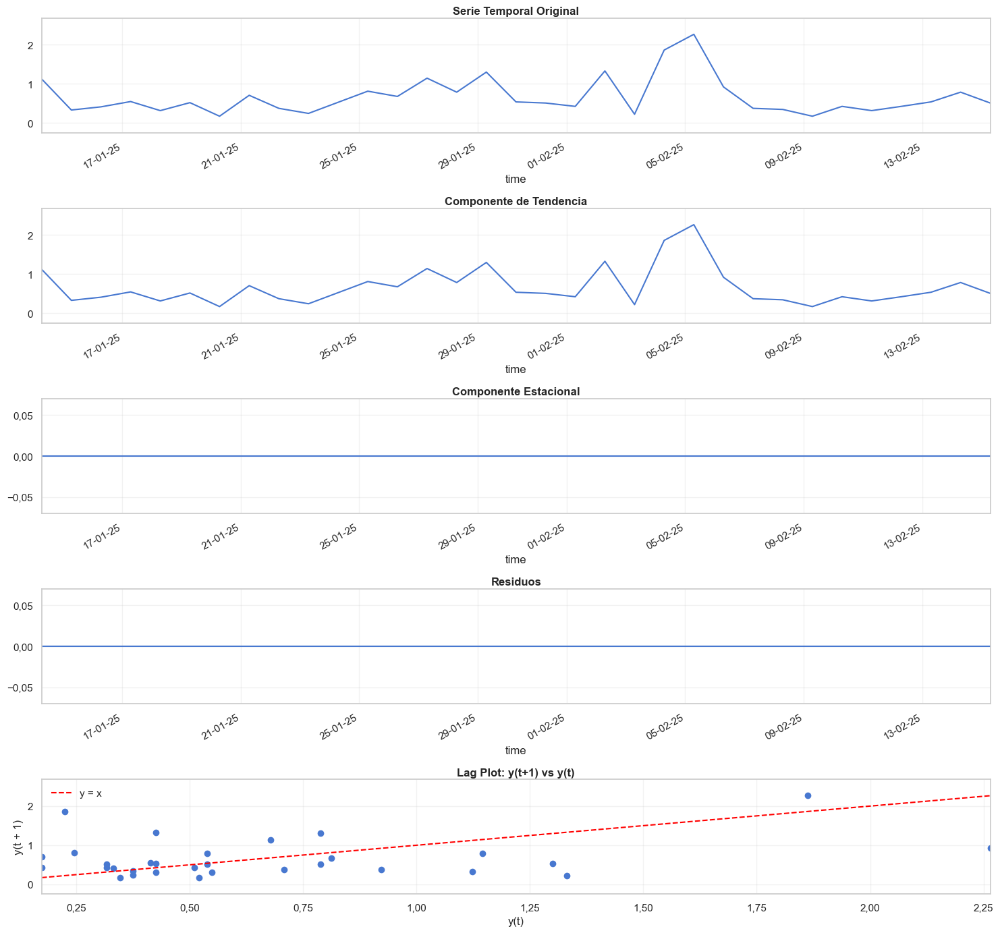

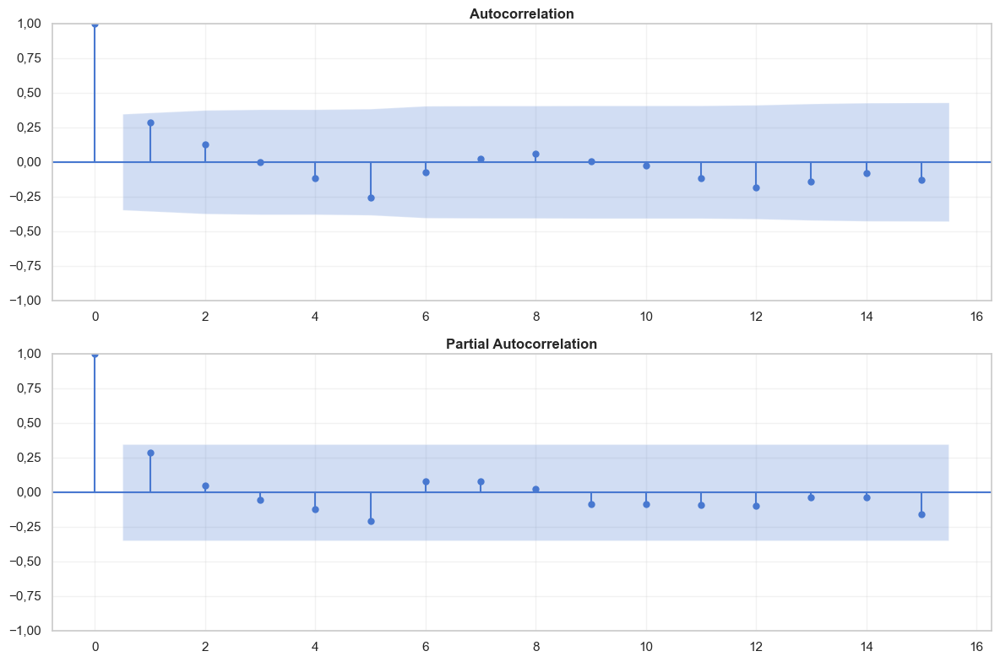

Analizando archivo: PAD_2A.CA4.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


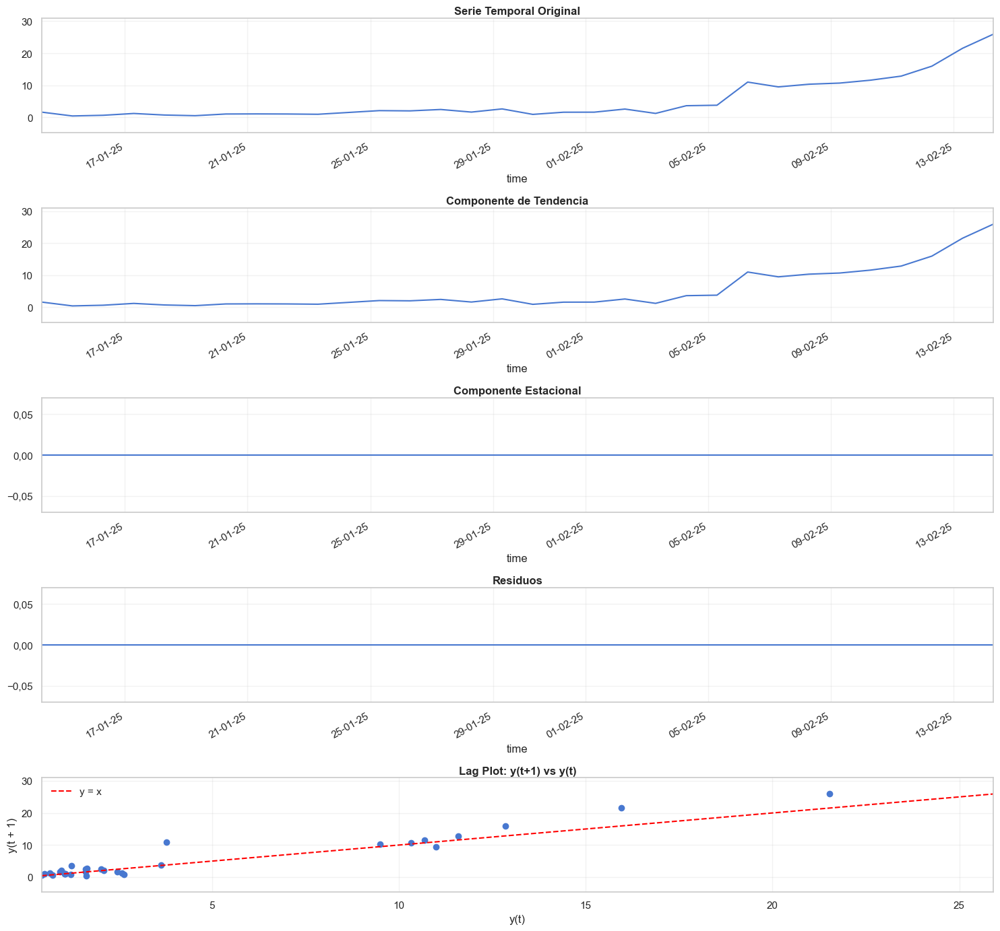

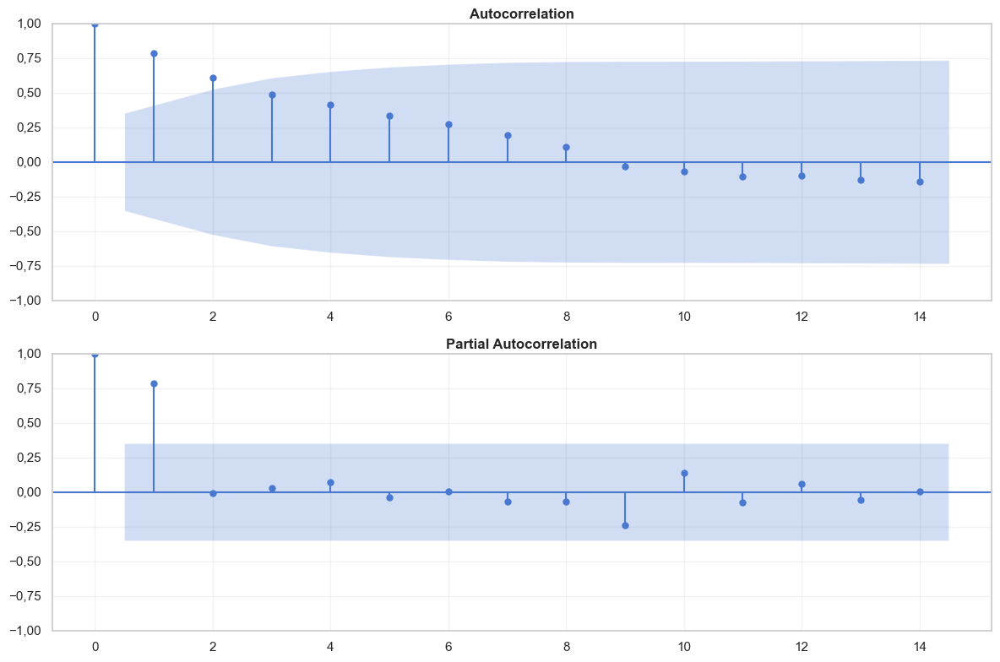

Analizando archivo: PAD_2A.CA5.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2A.CA6.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2A.CA7.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


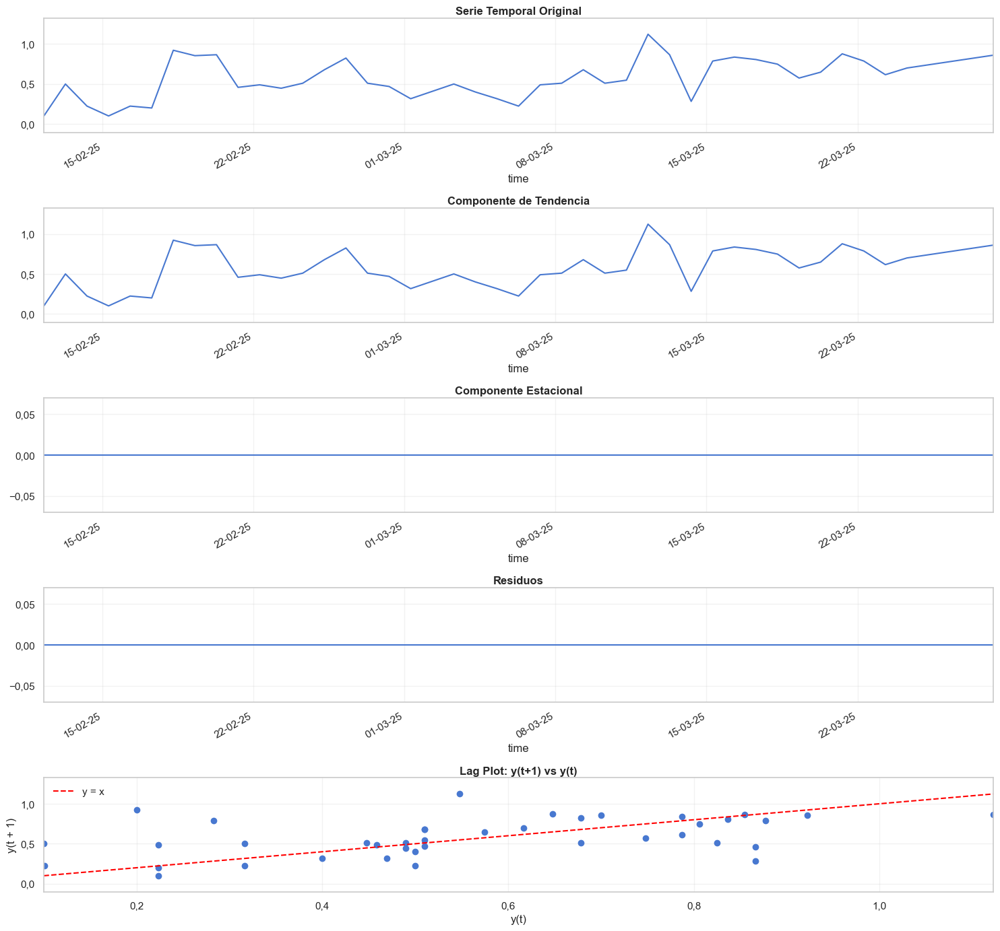

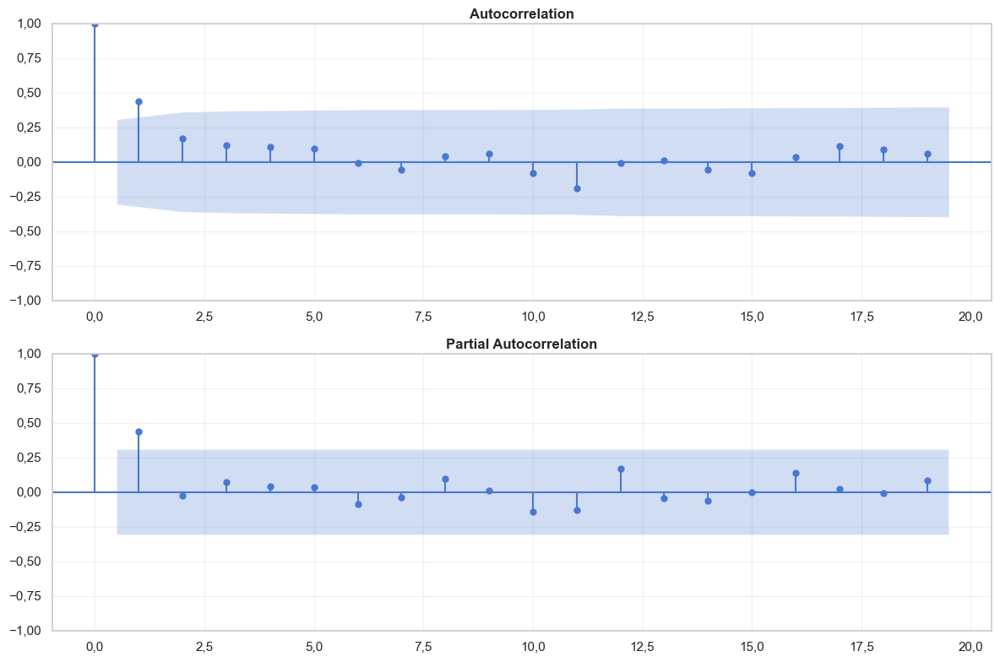

Analizando archivo: PAD_2A.CA8.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2A.CA9.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


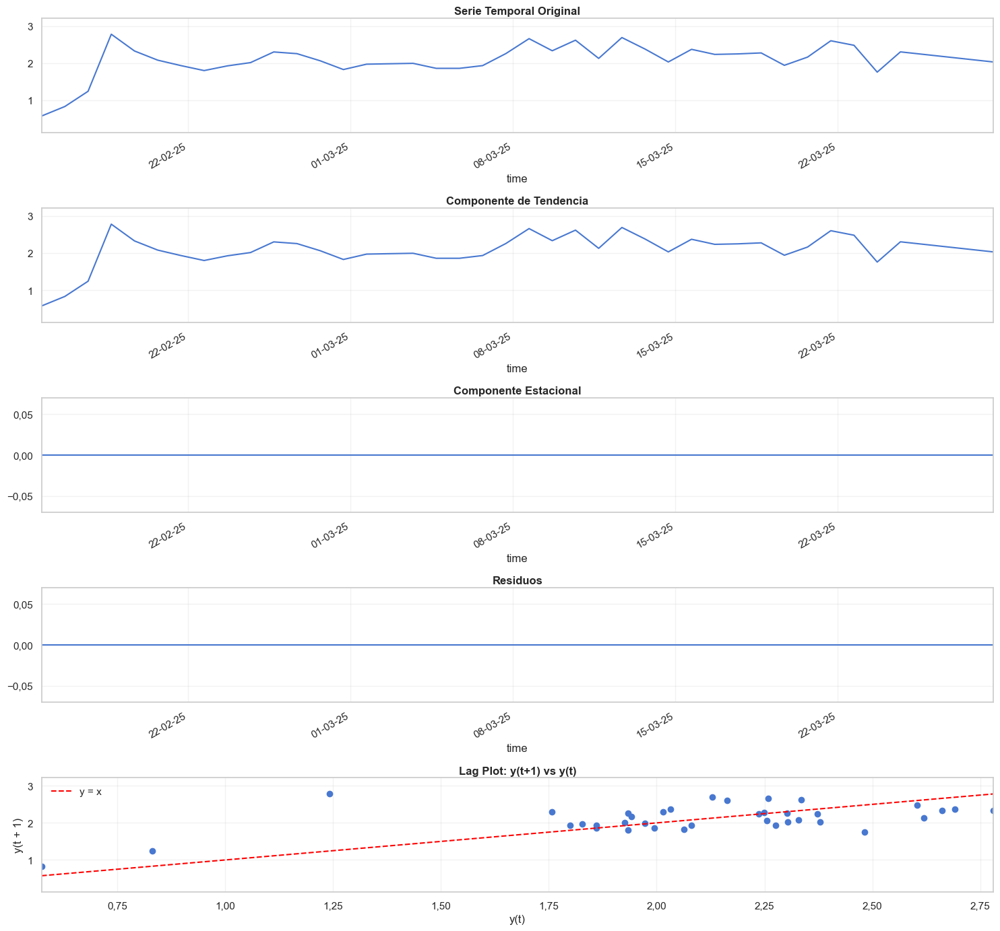

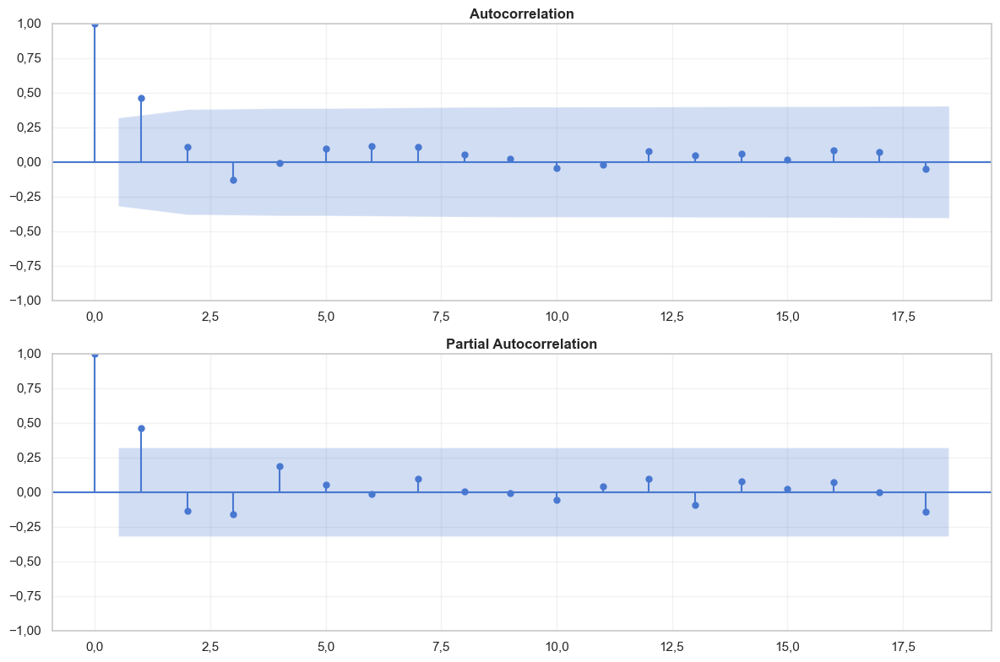

Analizando archivo: PAD_2B_2C.F2.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2B_2C.F3.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2B_2C.F4.csv
No hay suficientes datos para analizar.
Analizando archivo: PAD_2B_2C.PAD 2B-1.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


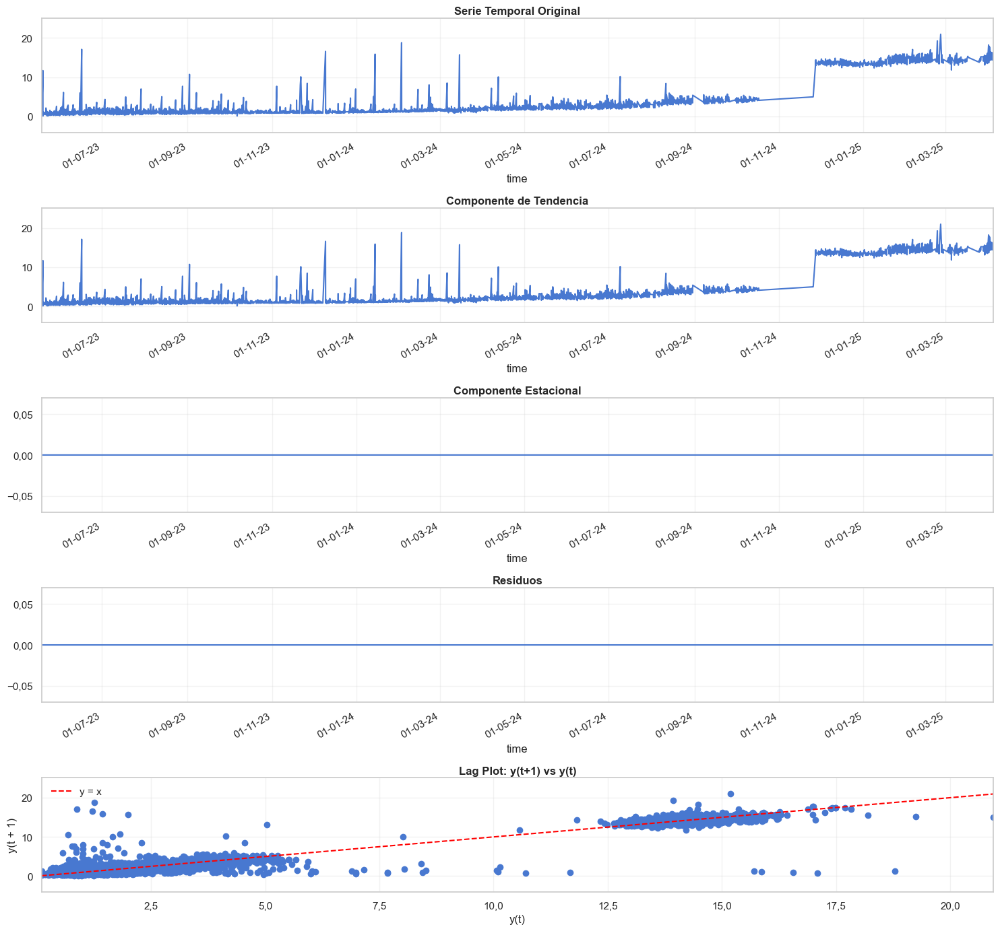

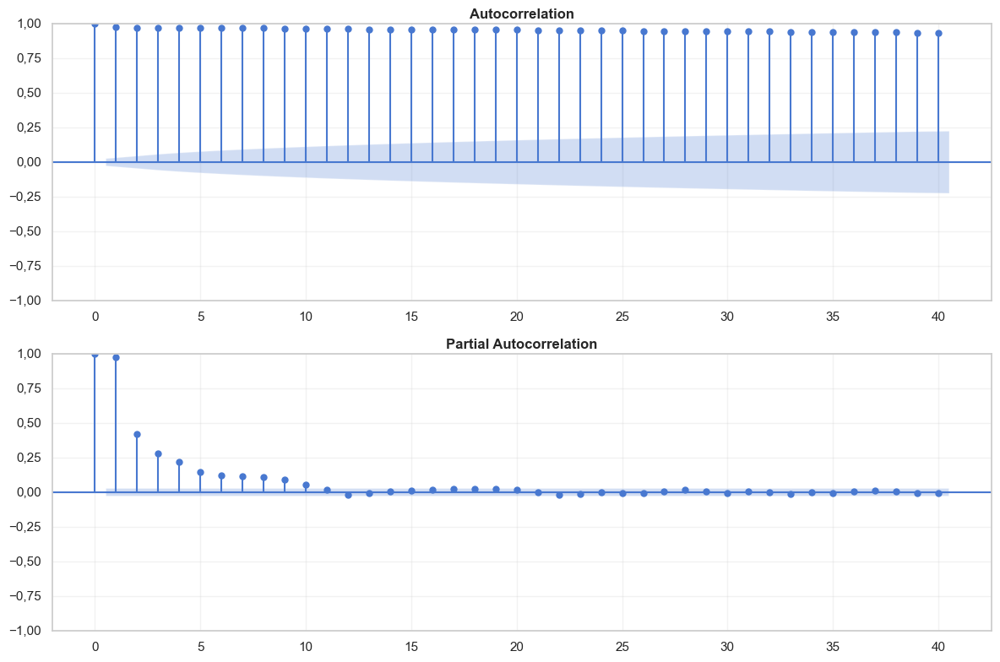

Analizando archivo: PAD_2B_2C.PAD 2B-10.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


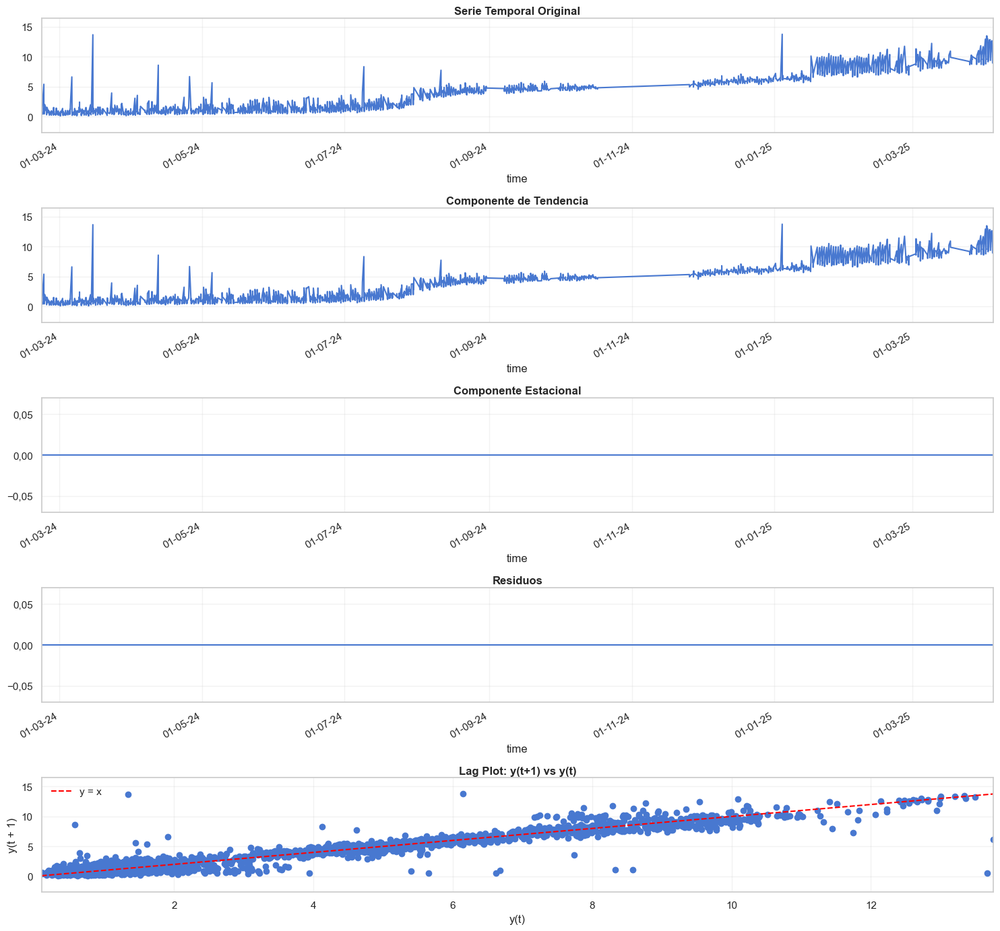

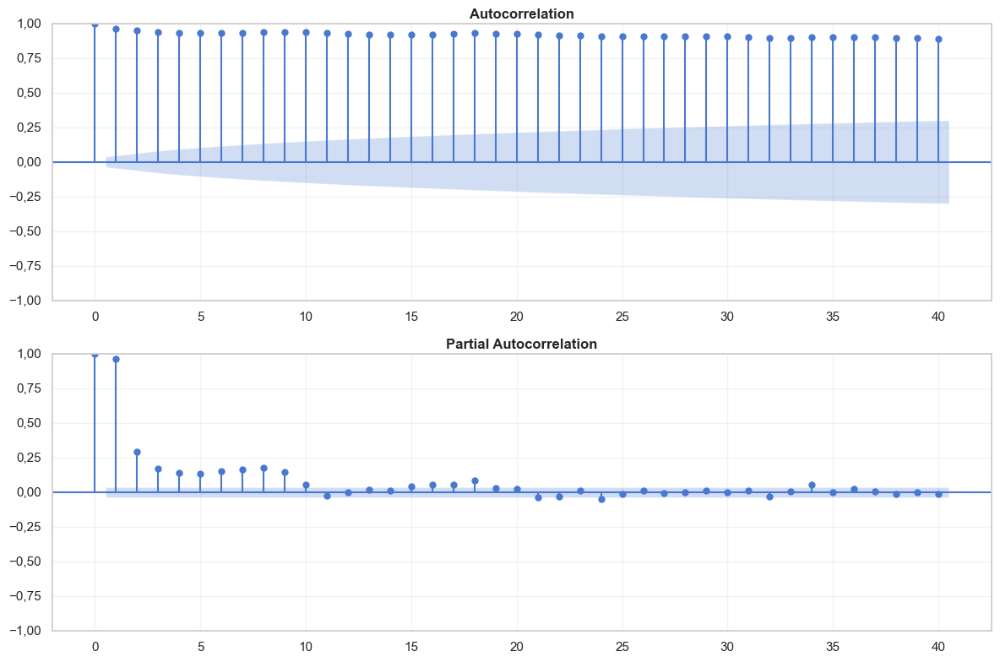

Analizando archivo: PAD_2B_2C.PAD 2B-11.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


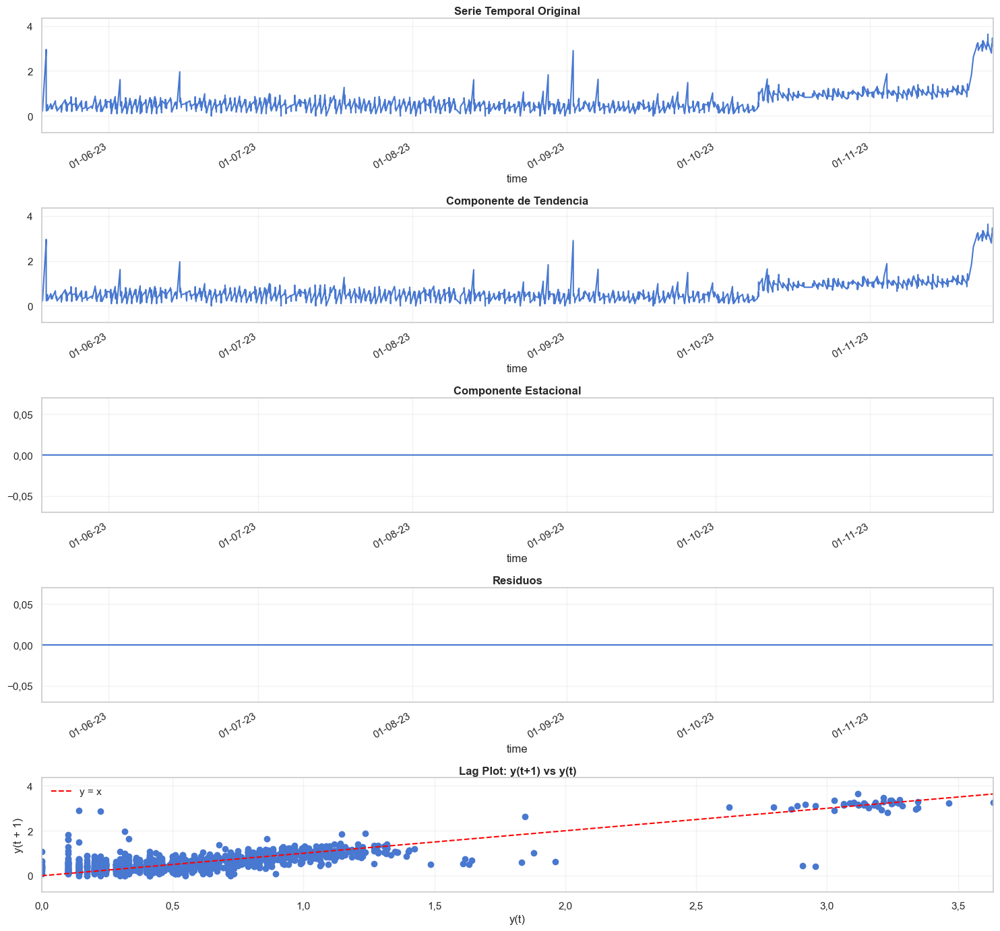

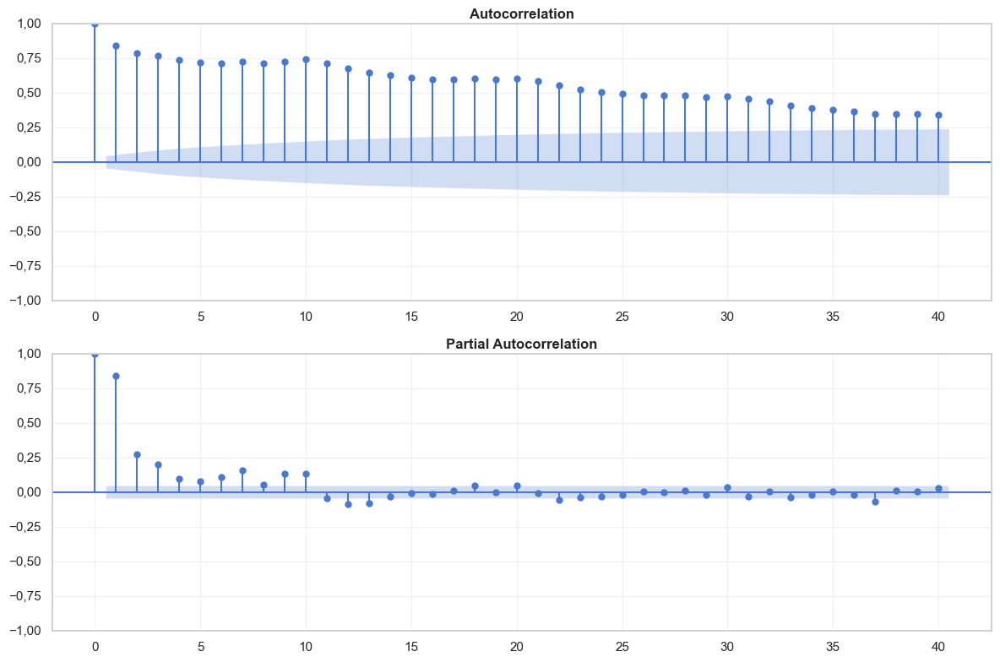

Analizando archivo: PAD_2B_2C.PAD 2B-13.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


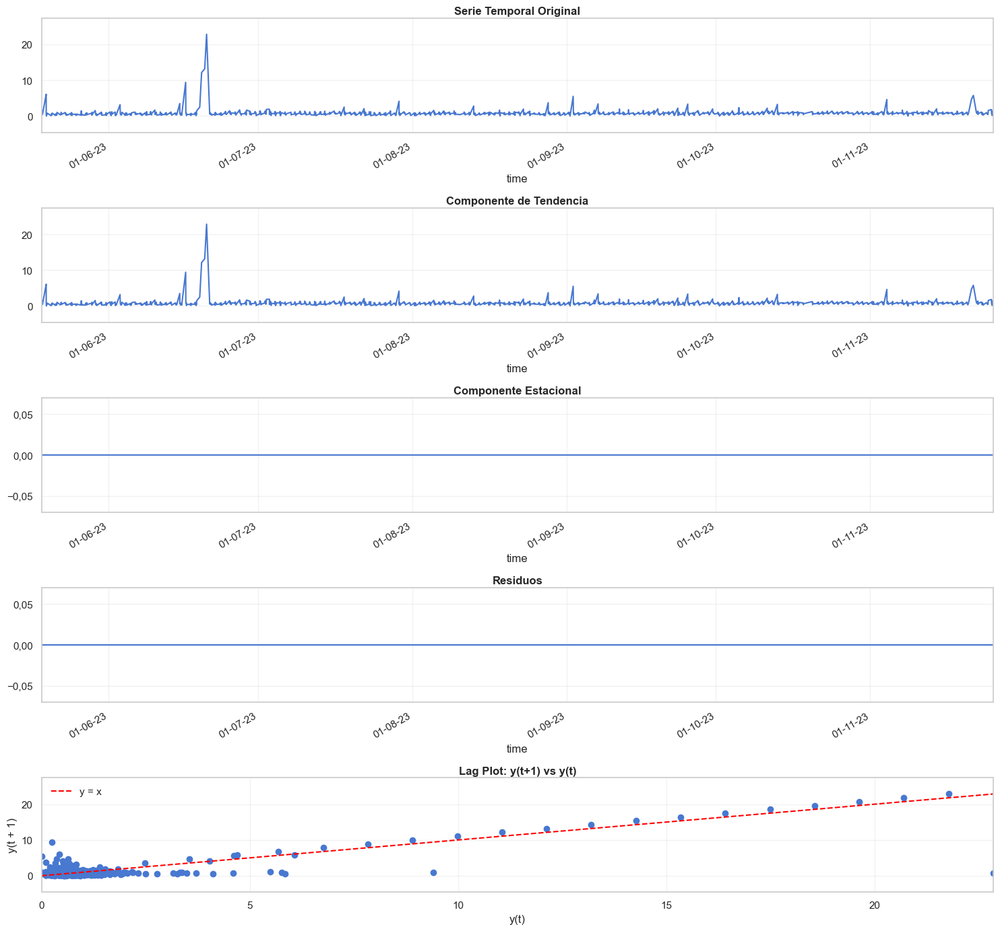

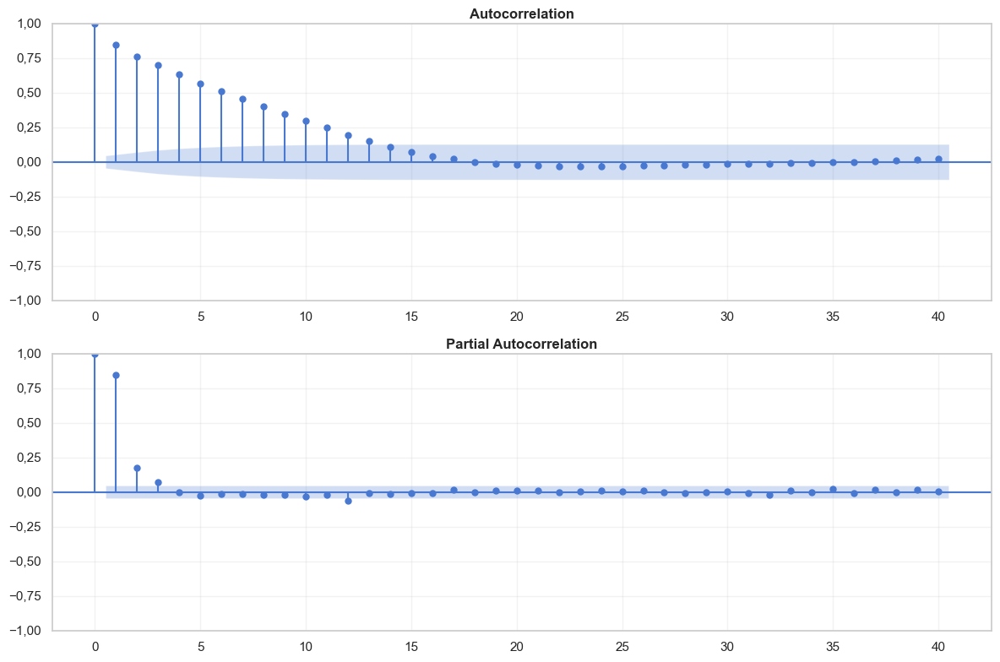

Analizando archivo: PAD_2B_2C.PAD 2B-14.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


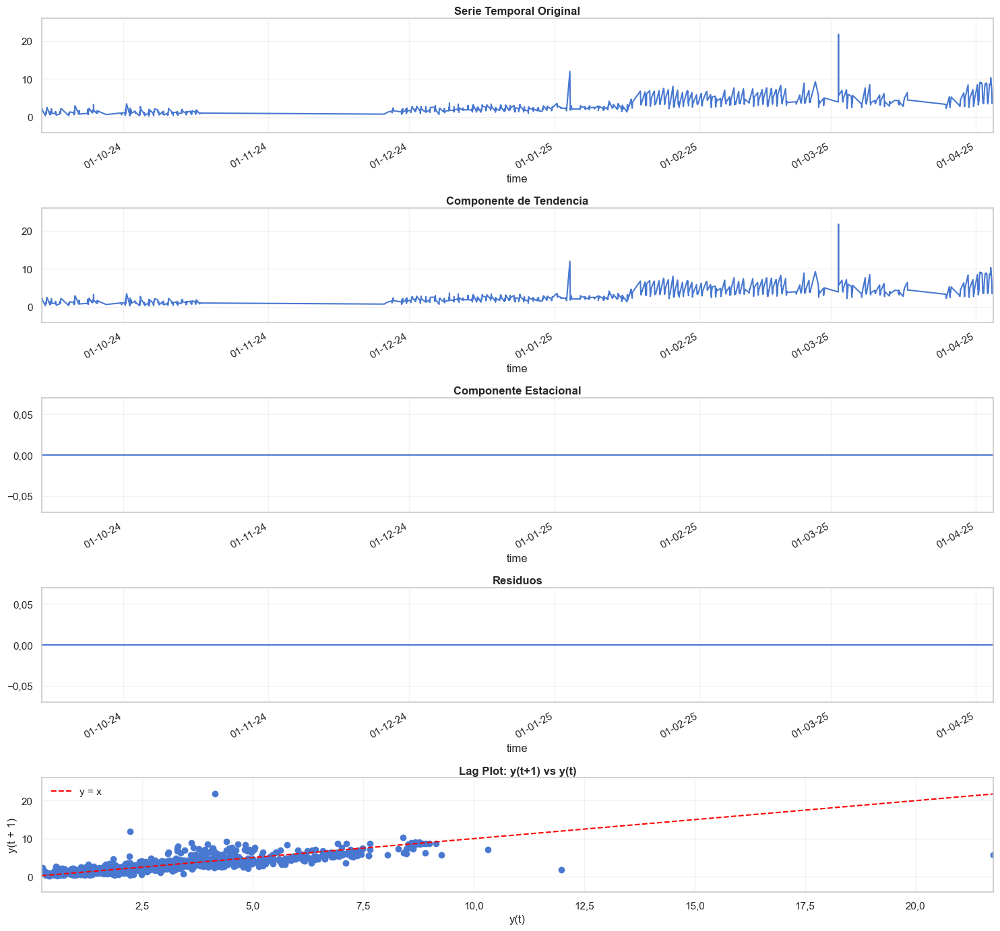

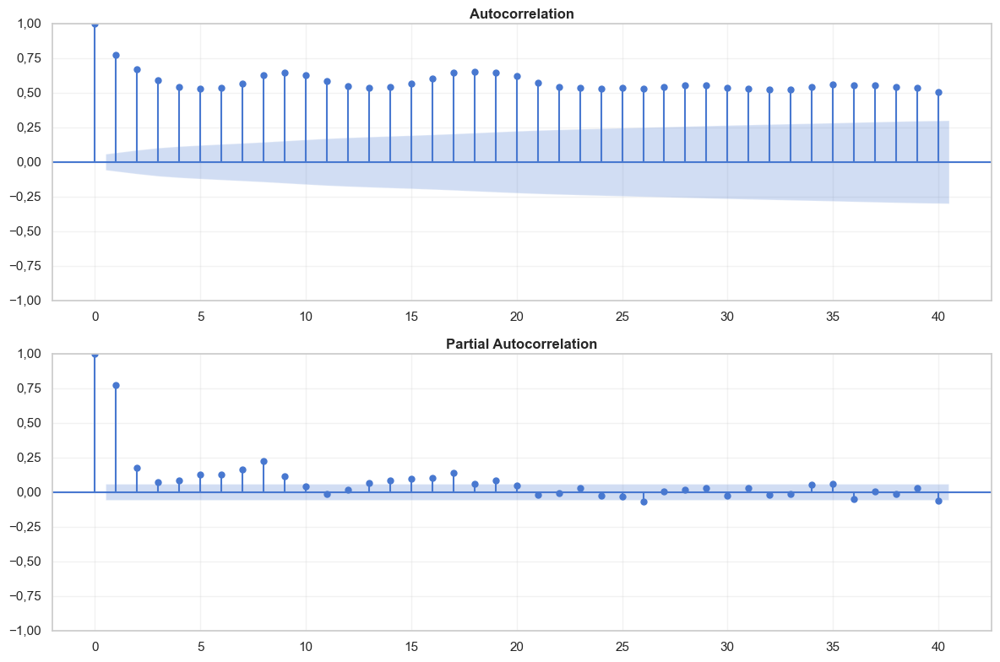

Analizando archivo: PAD_2B_2C.PAD 2B-15.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


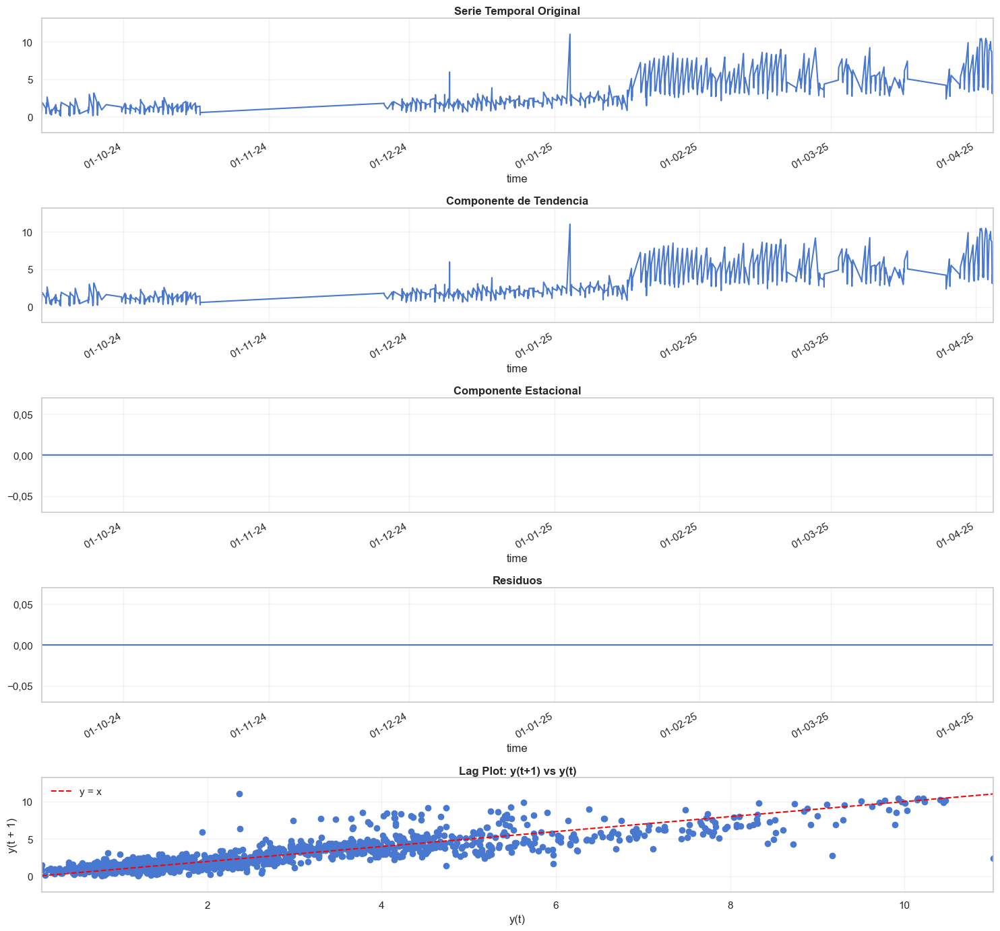

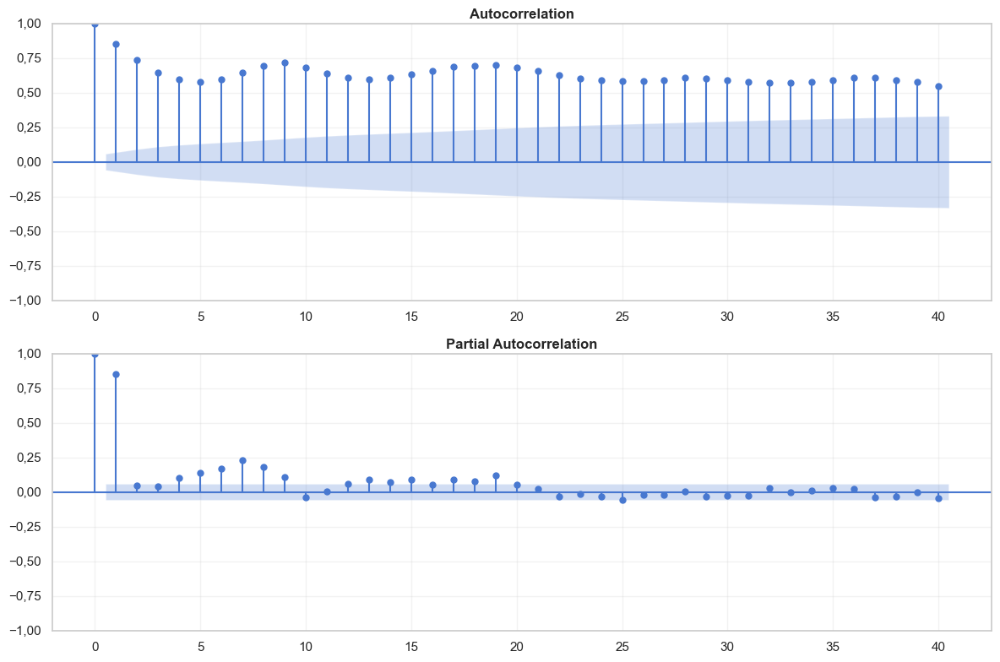

Analizando archivo: PAD_2B_2C.PAD 2B-16.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


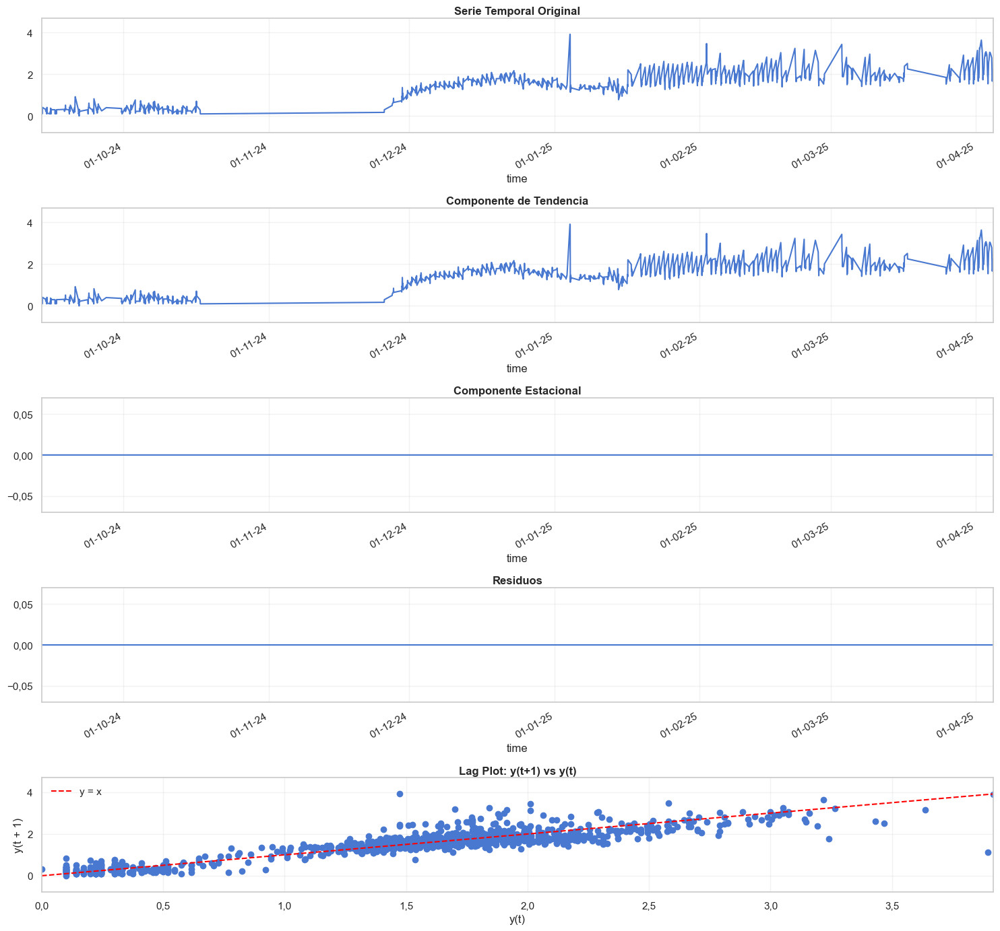

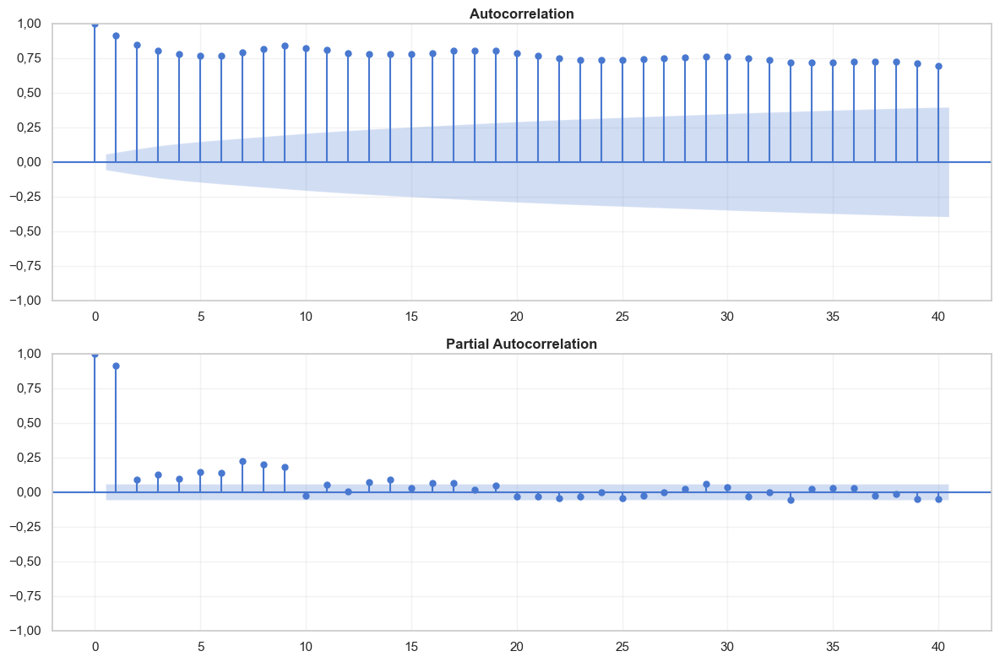

Analizando archivo: PAD_2B_2C.PAD 2B-2.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


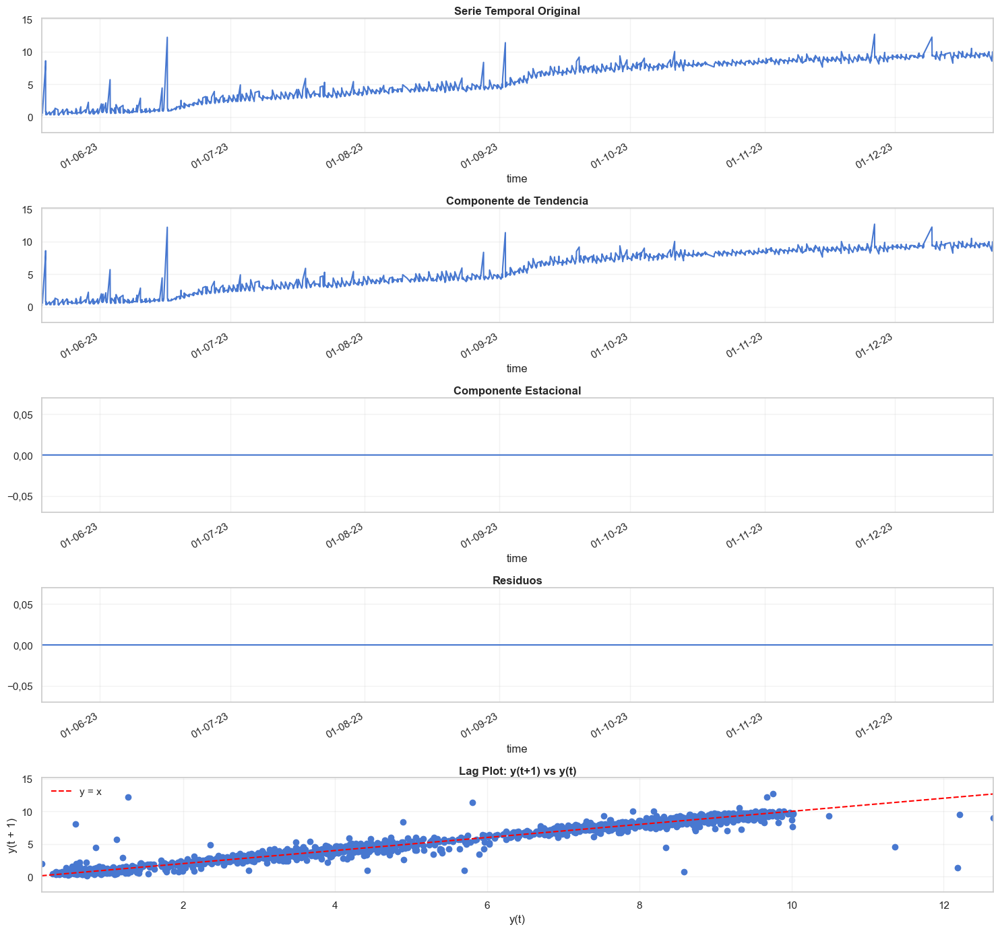

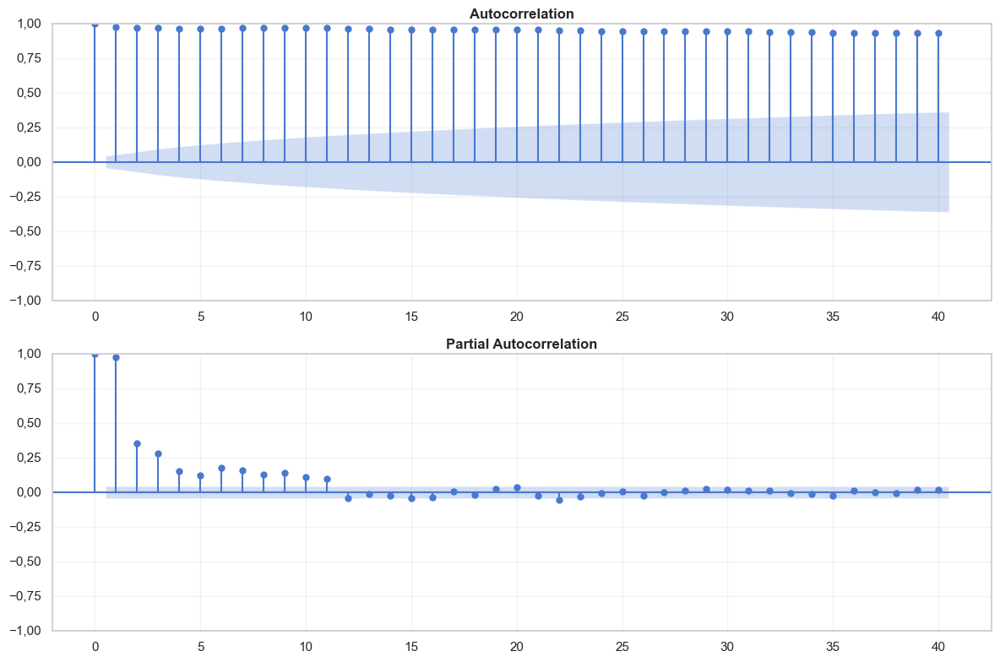

Analizando archivo: PAD_2B_2C.PAD 2B-3.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


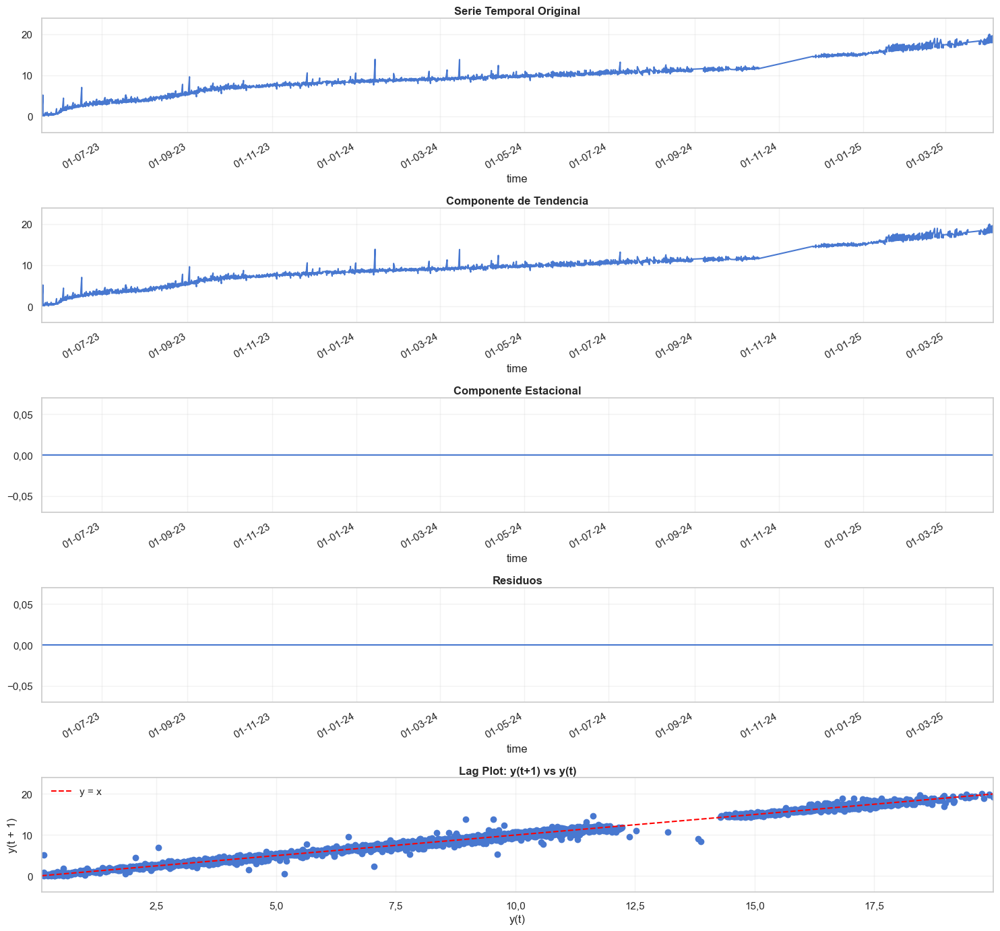

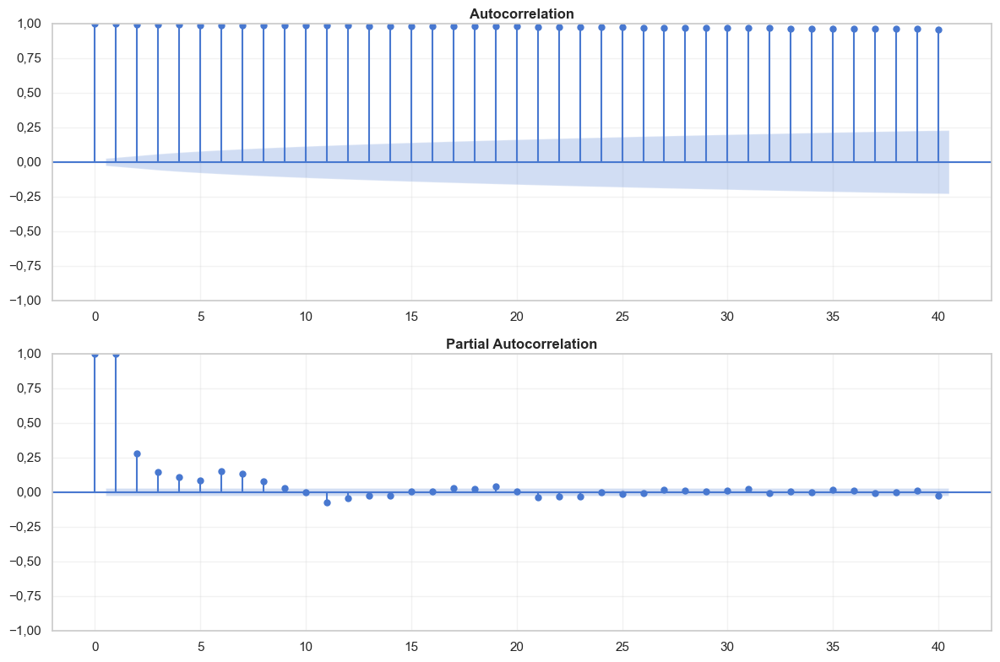

Analizando archivo: PAD_2B_2C.PAD 2B-5.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


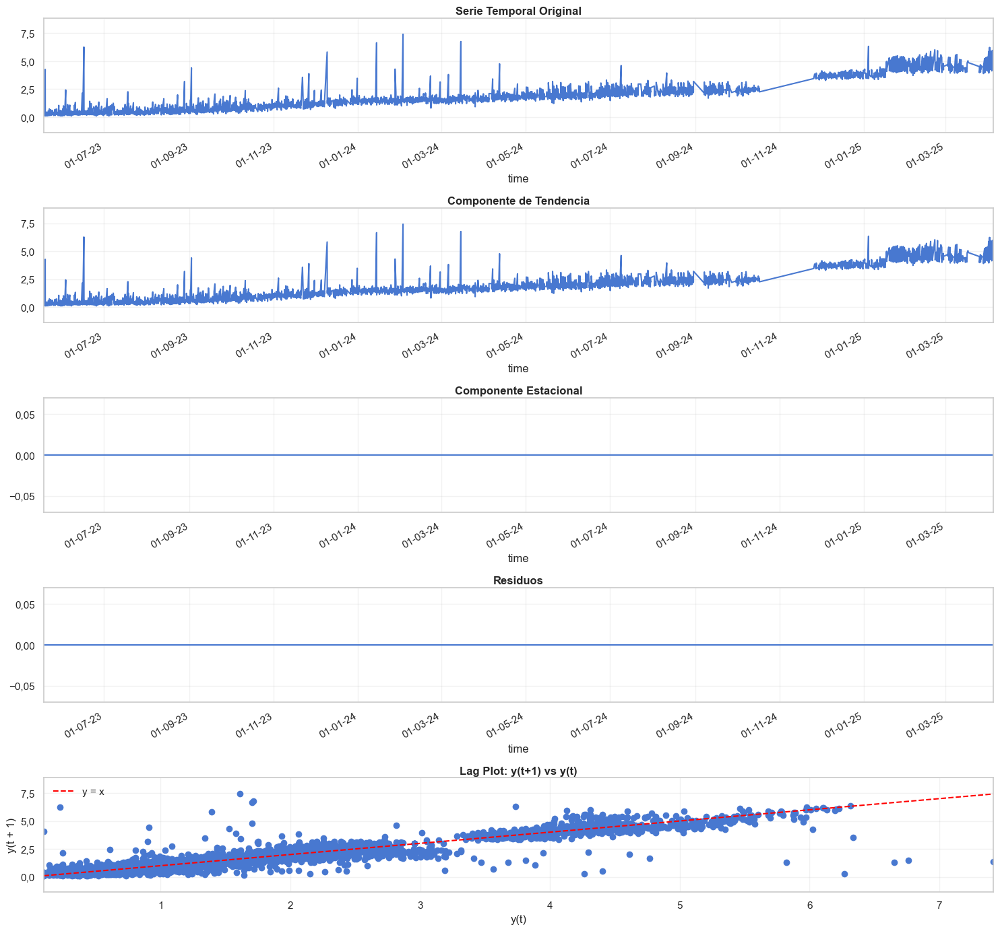

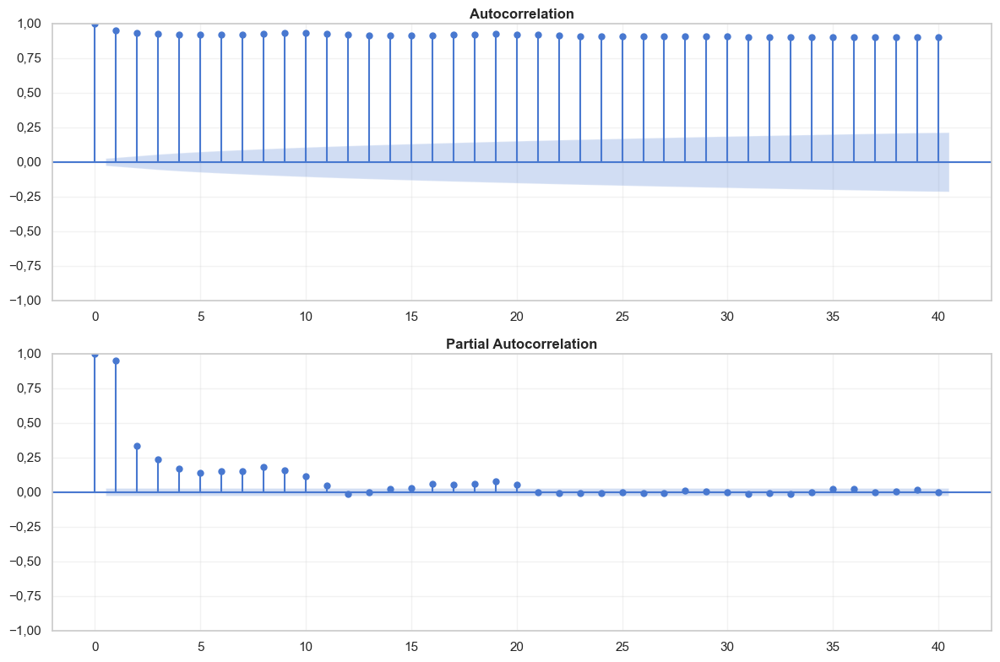

Analizando archivo: PAD_2B_2C.PAD 2B-6.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


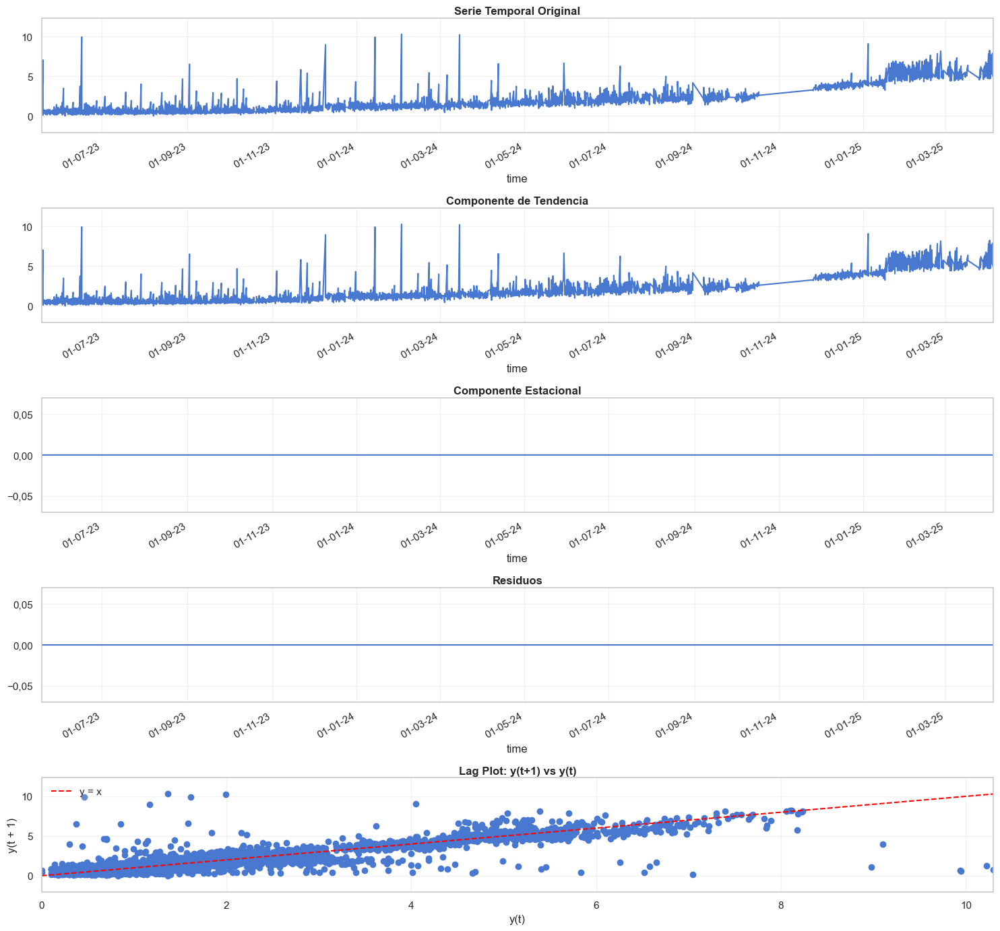

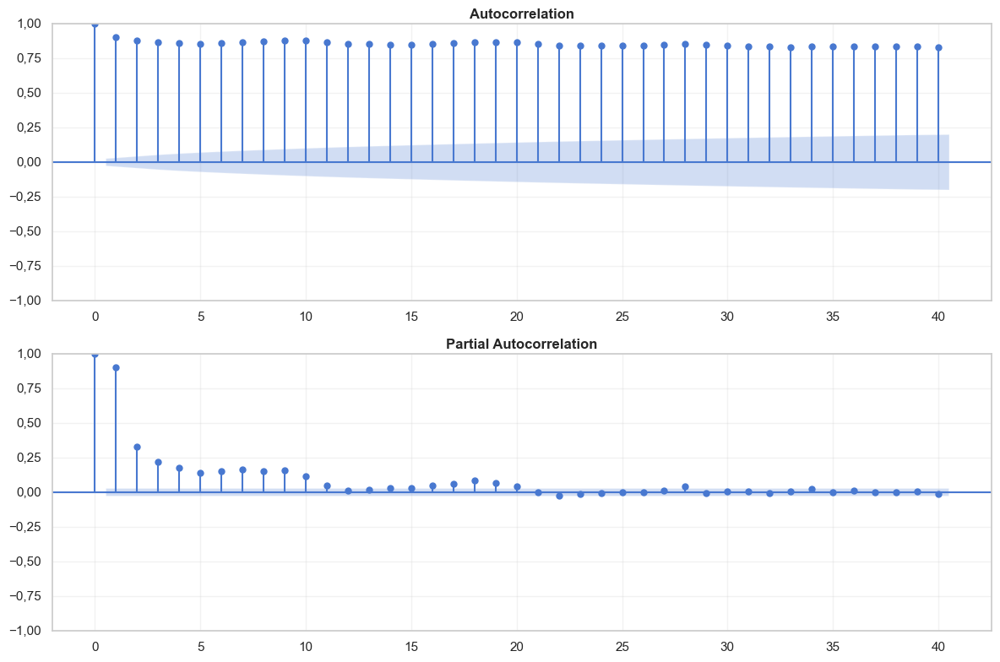

Analizando archivo: PAD_2B_2C.PAD 2B-7.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


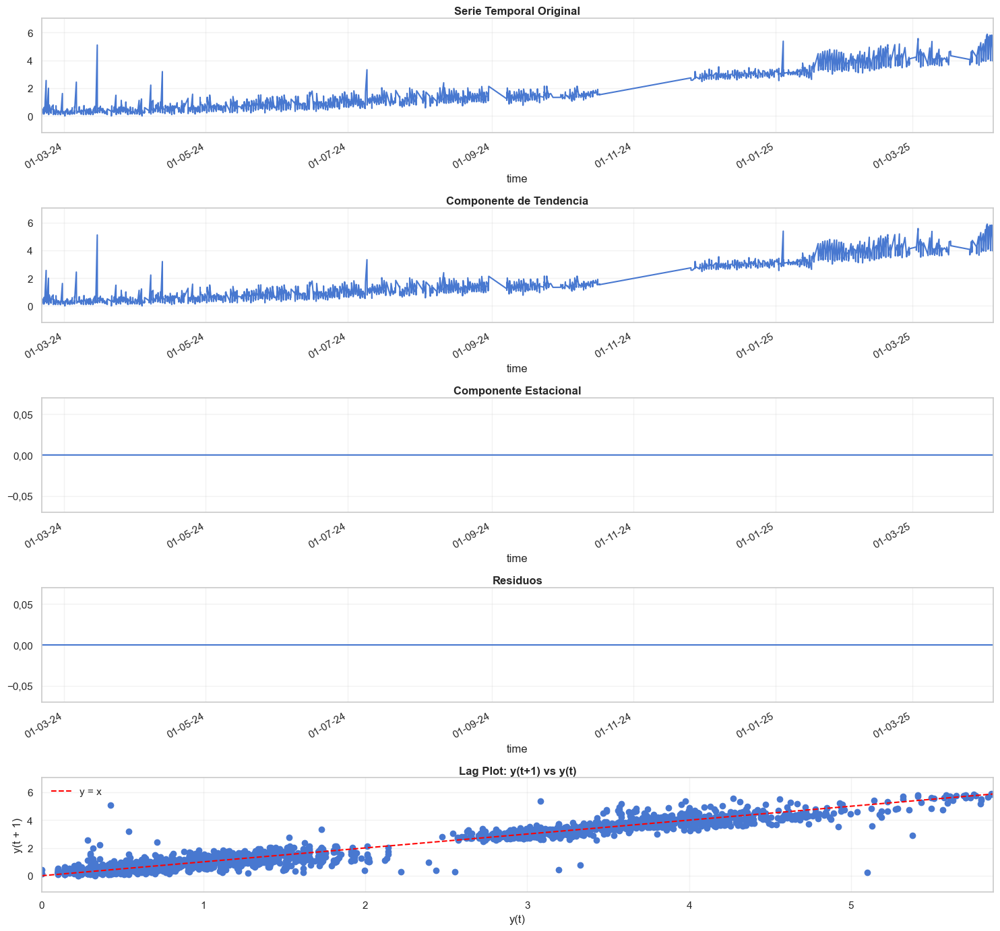

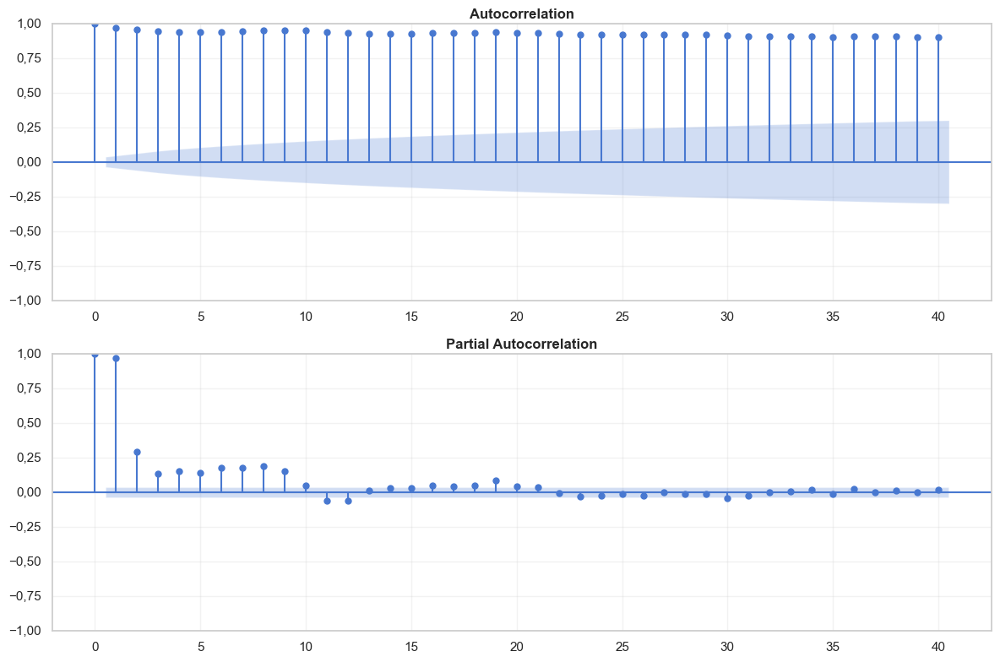

Analizando archivo: PAD_2B_2C.PAD 2B-8.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


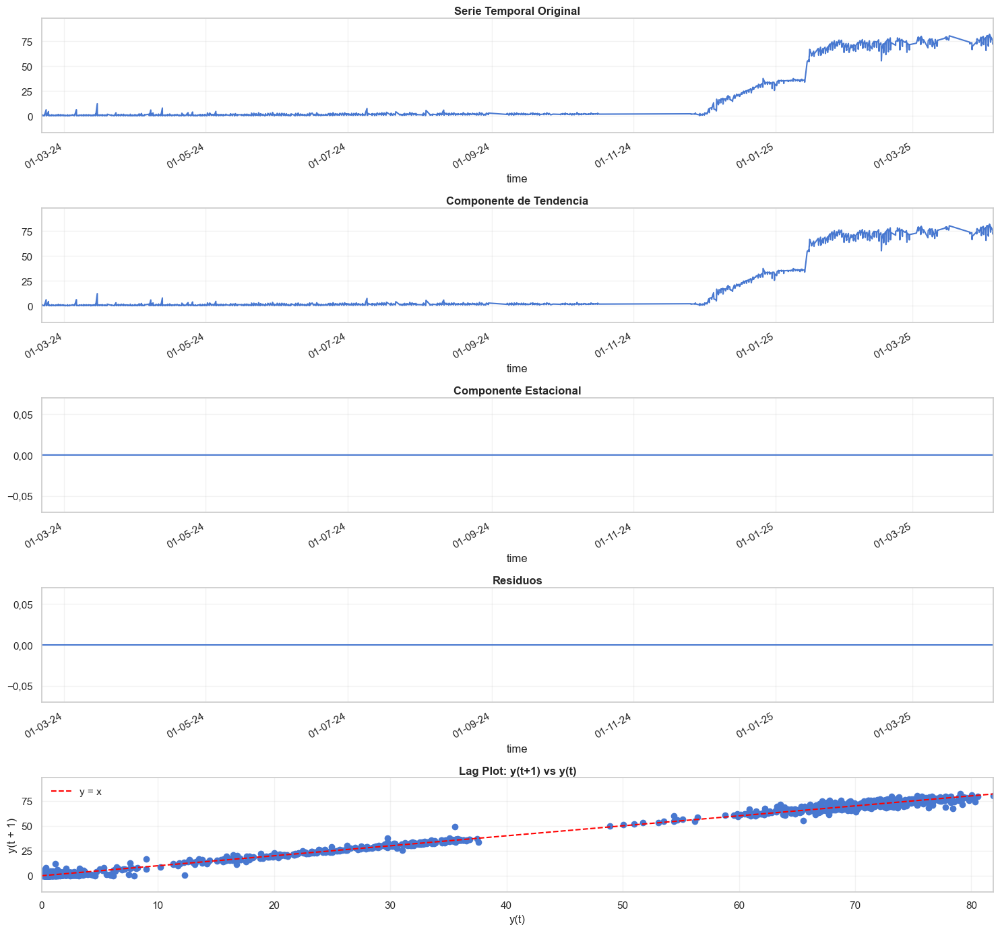

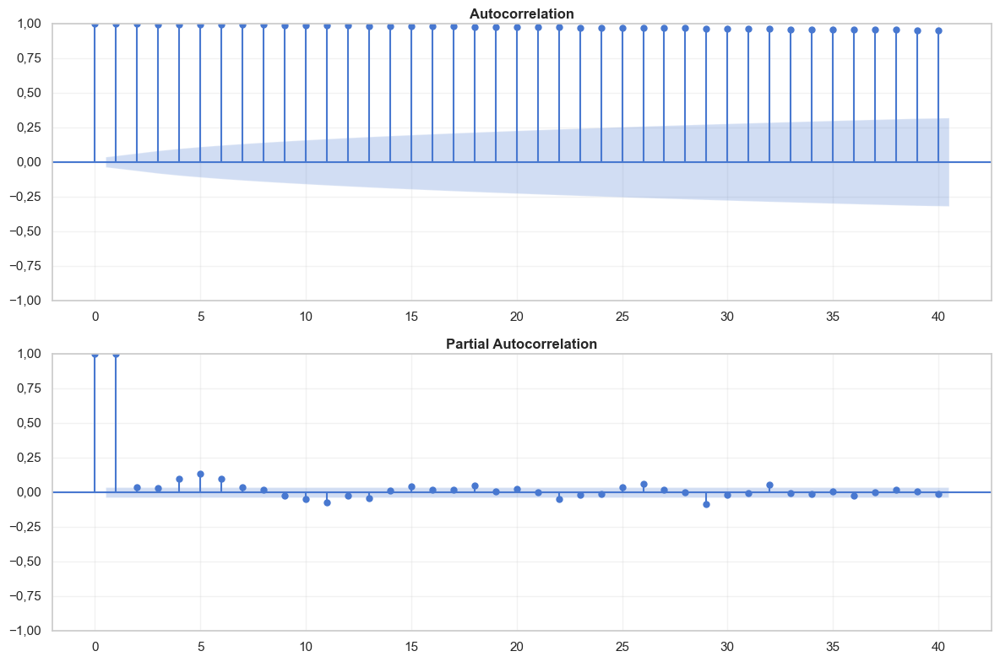

Analizando archivo: PAD_2B_2C.PAD 2B-9.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


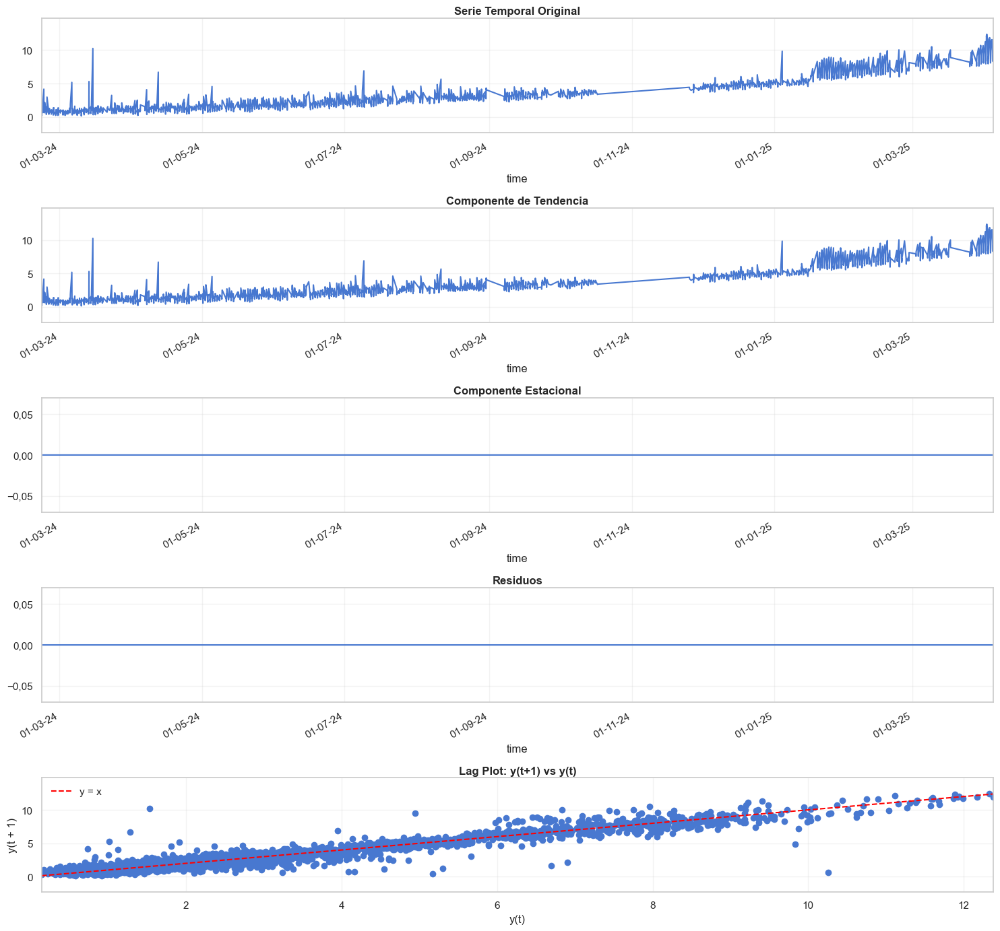

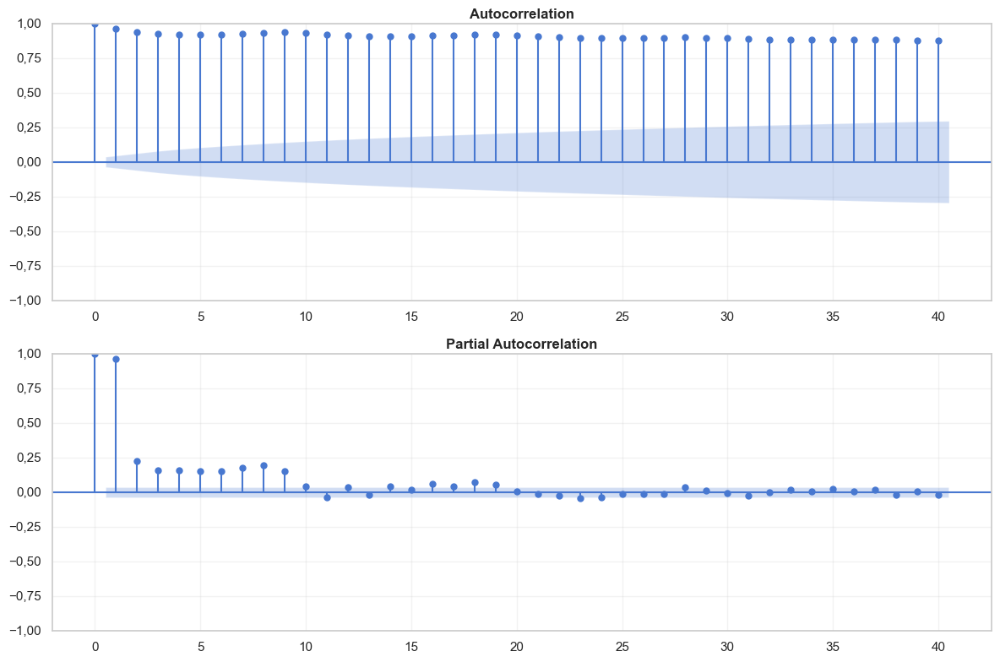

Analizando archivo: PAD_2B_2C.PAD 2B-FS-4.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


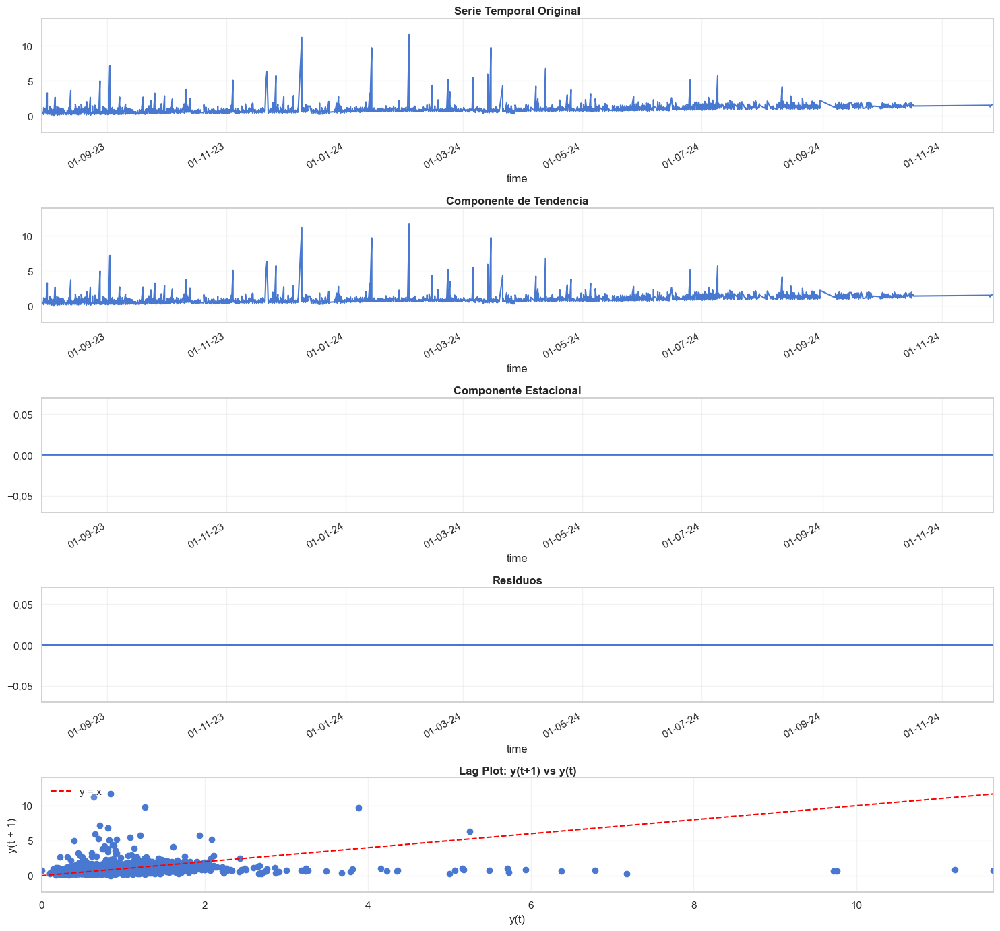

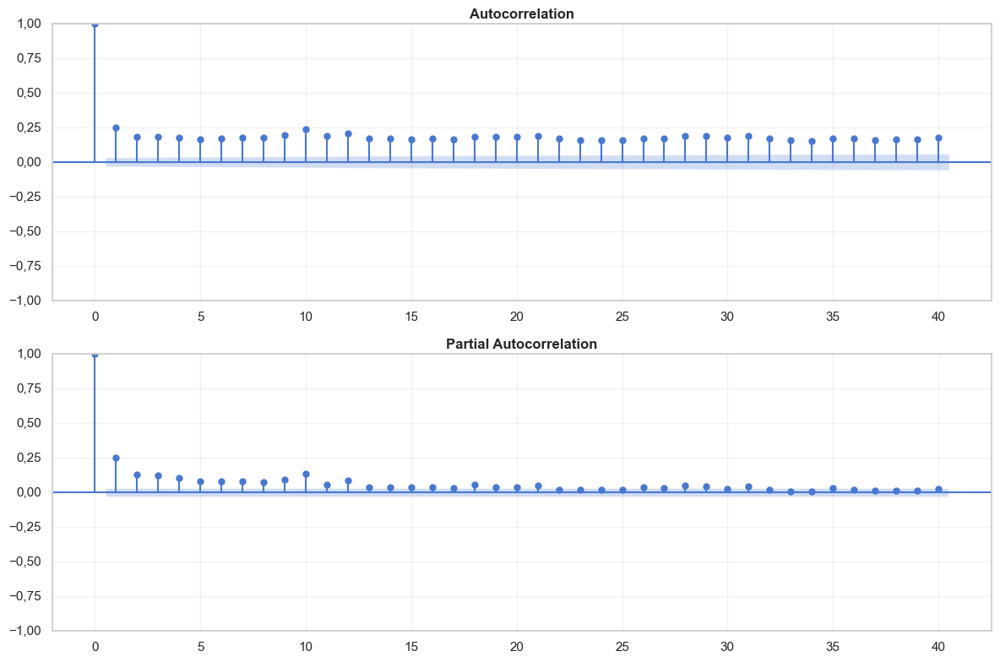

Analizando archivo: PAD_2B_2C.PAD 2B-FS-5.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


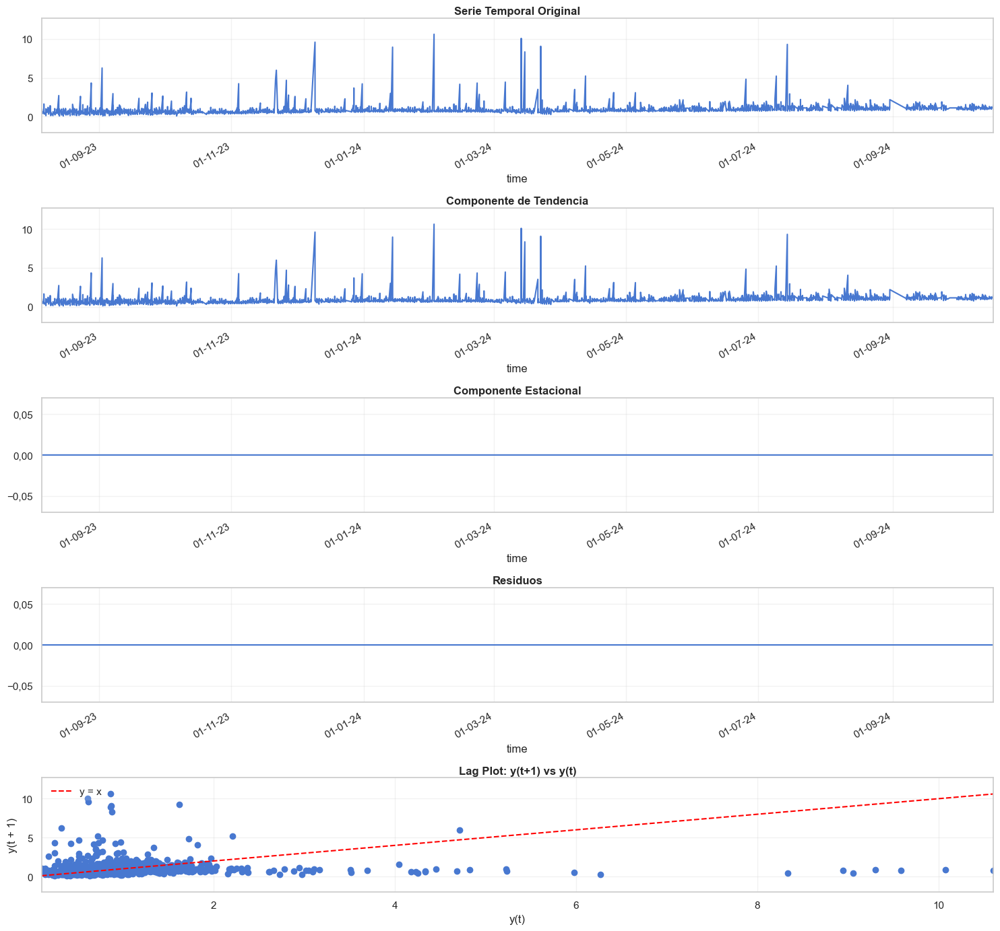

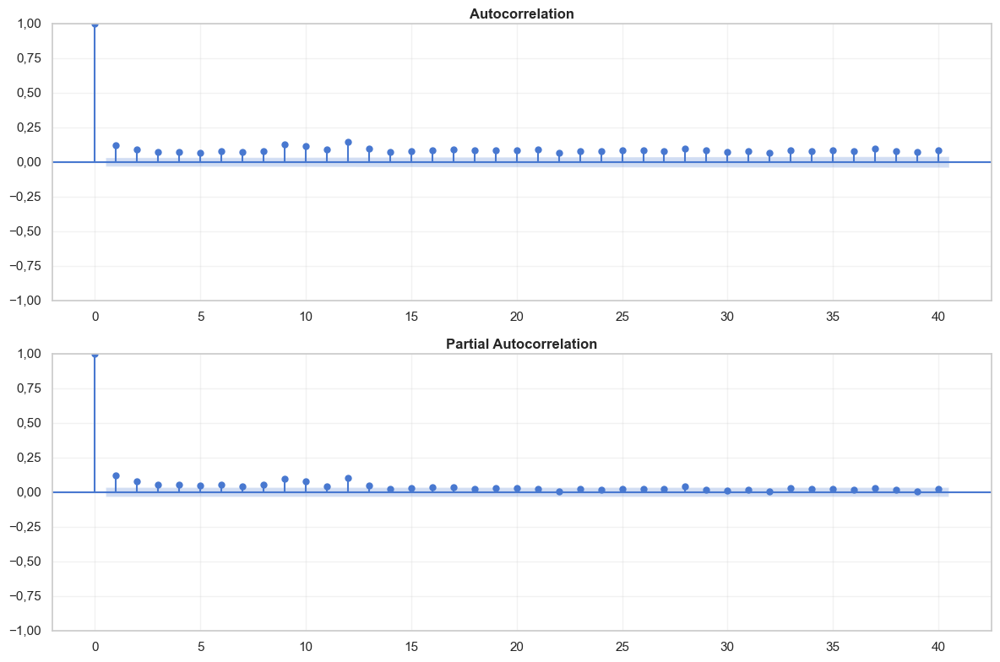

Analizando archivo: PAD_2B_2C.PAD 2B-FS-6.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


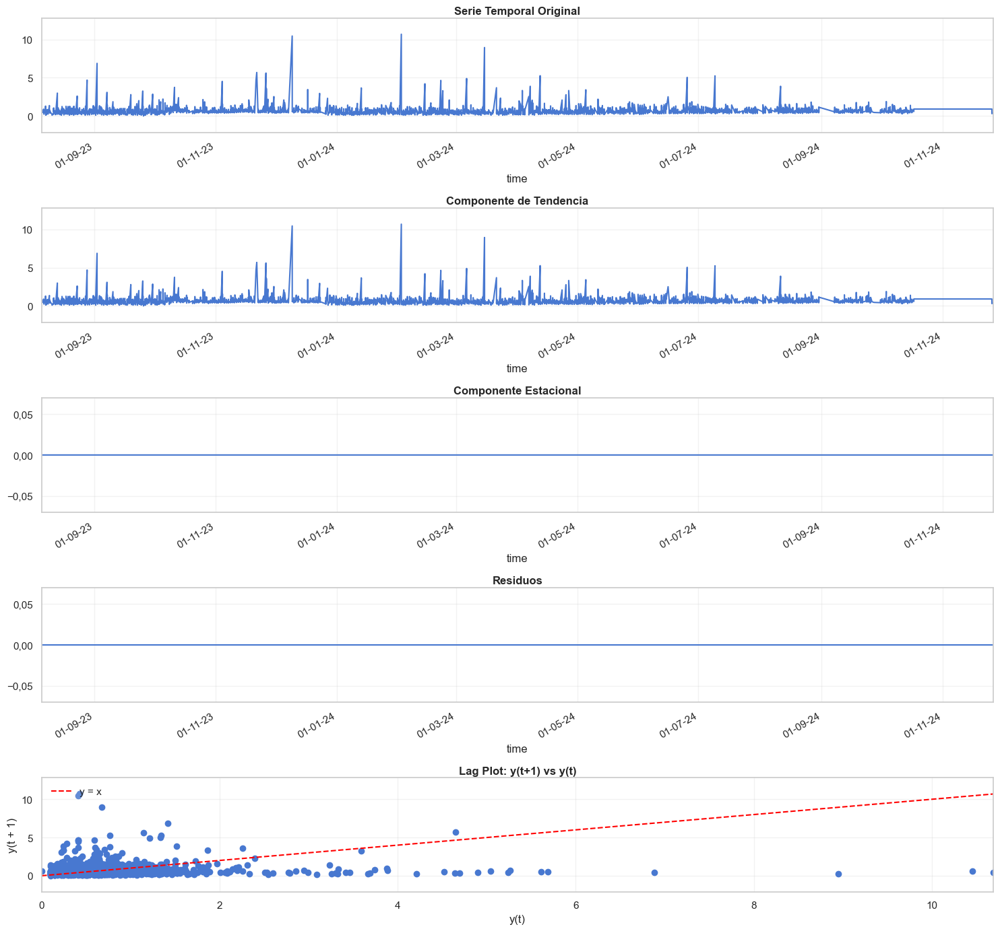

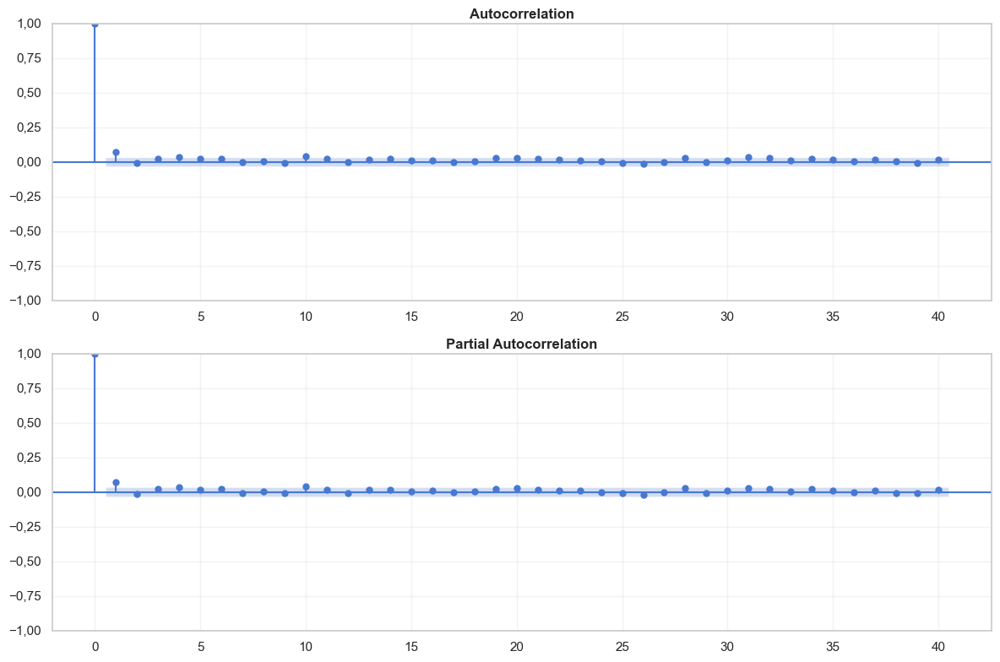

Analizando archivo: PAD_2B_2C.PAD 2B-FS-7.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


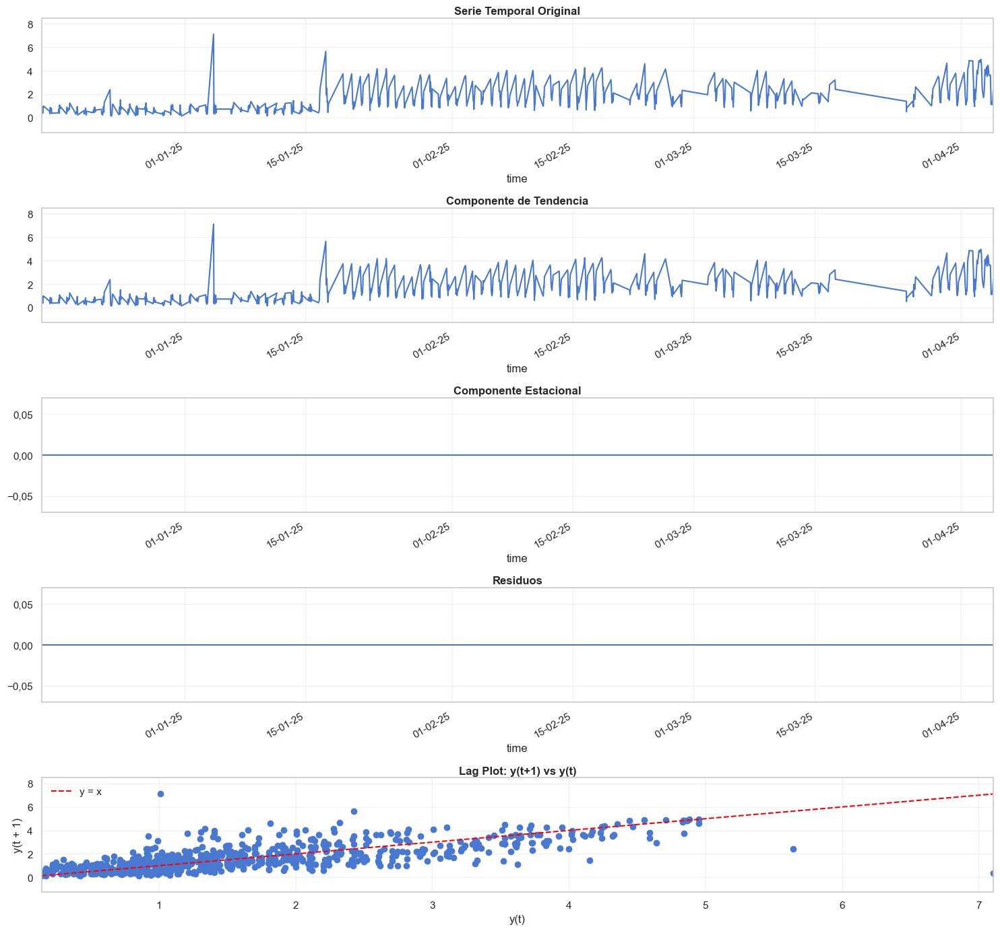

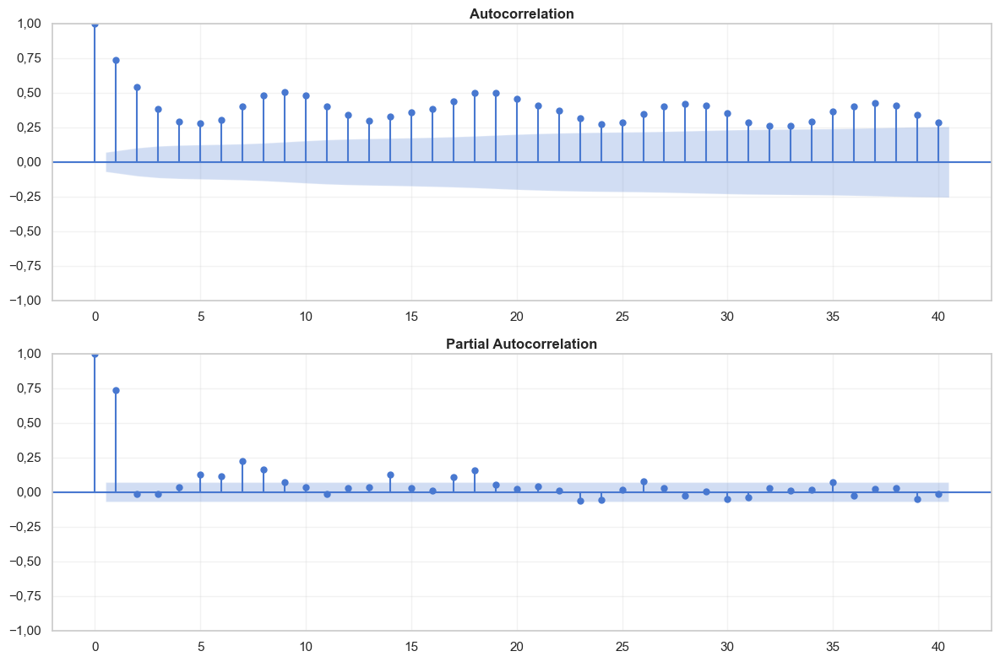

Analizando archivo: PAD_2B_2C.PAD 2B-FS-8.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


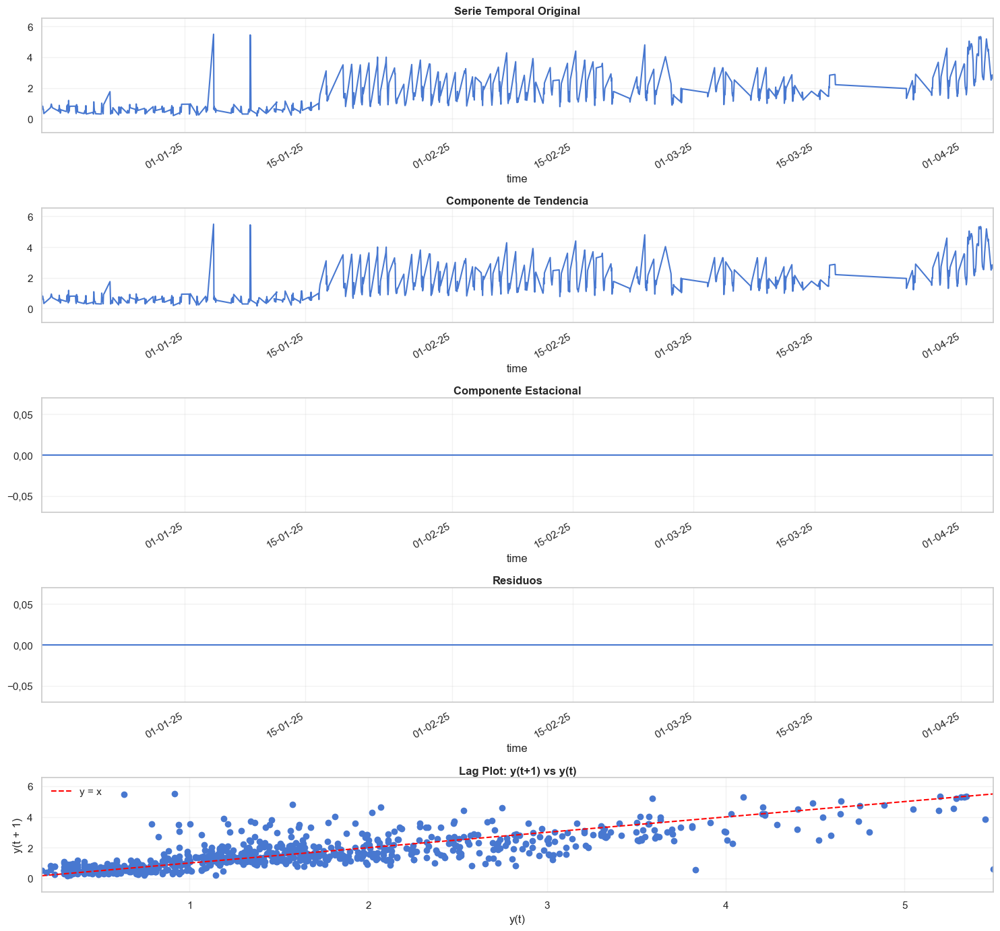

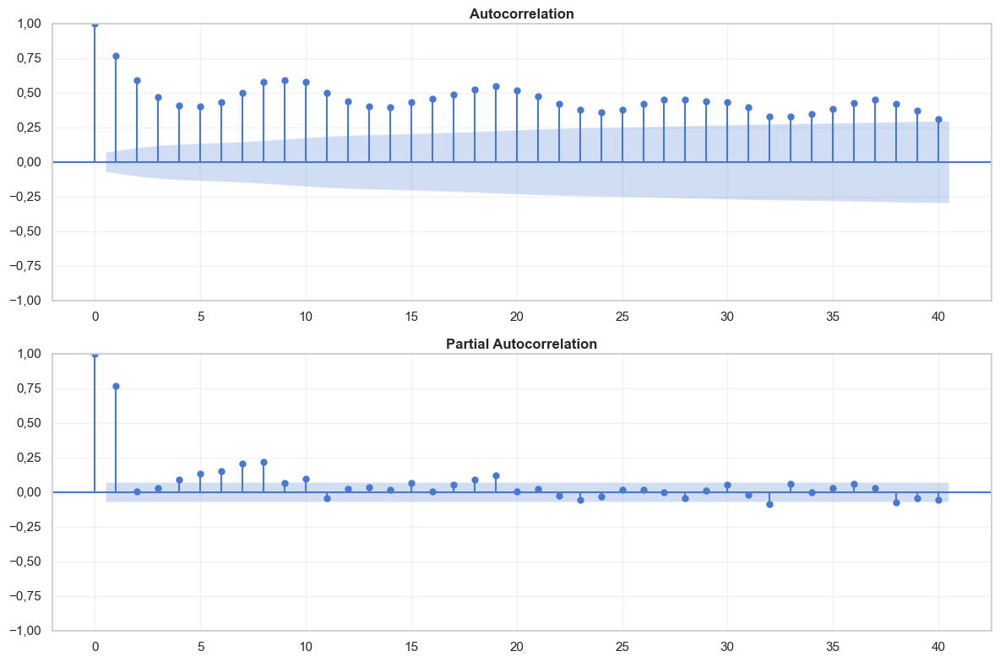

Analizando archivo: PAD_2B_2C.PAD 2B-FS-9.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


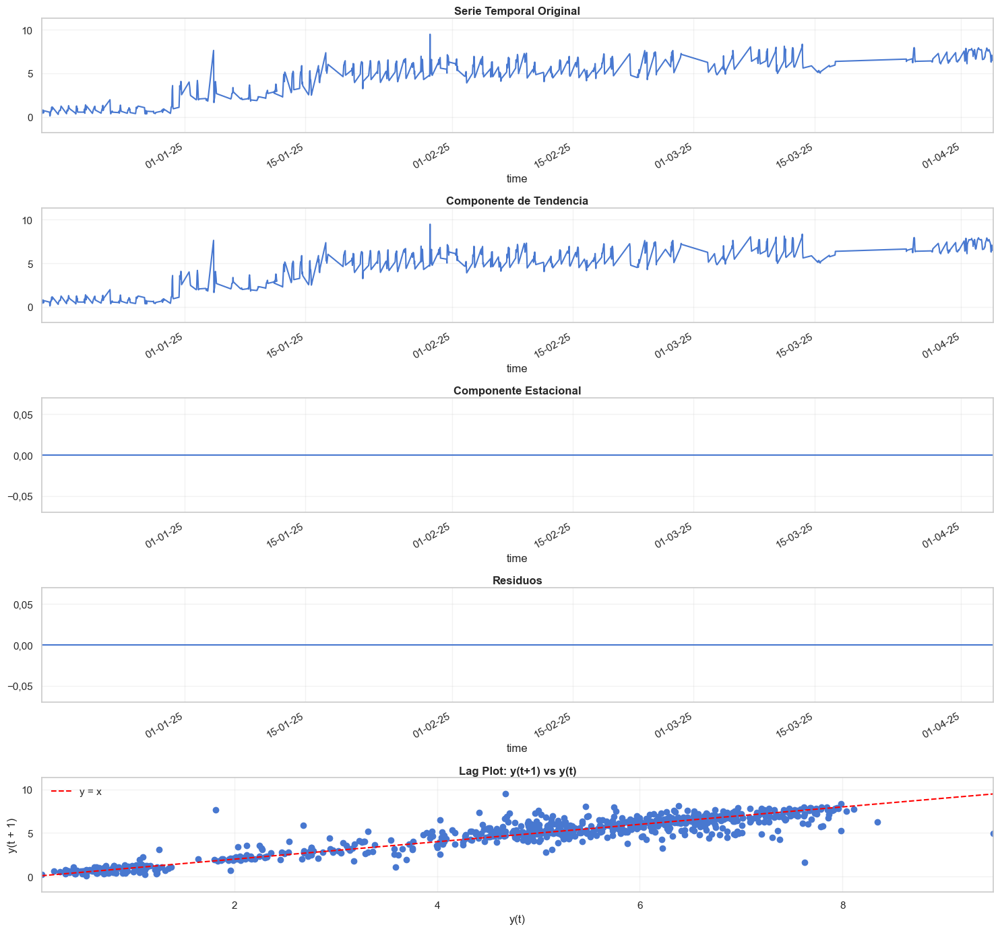

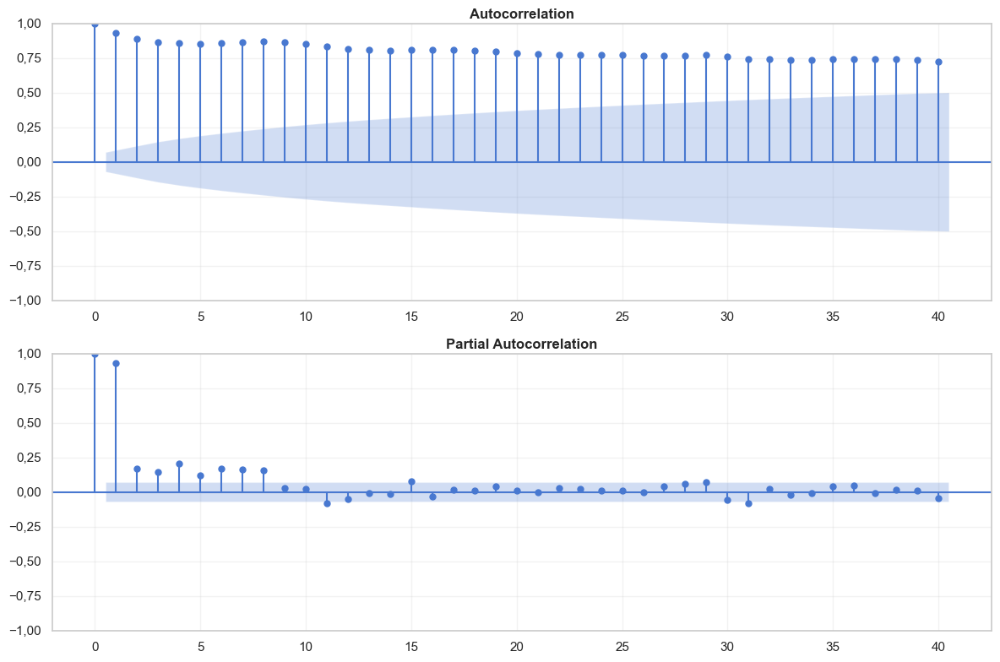

Analizando archivo: PAD_2B_2C.PAD OVER-1.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


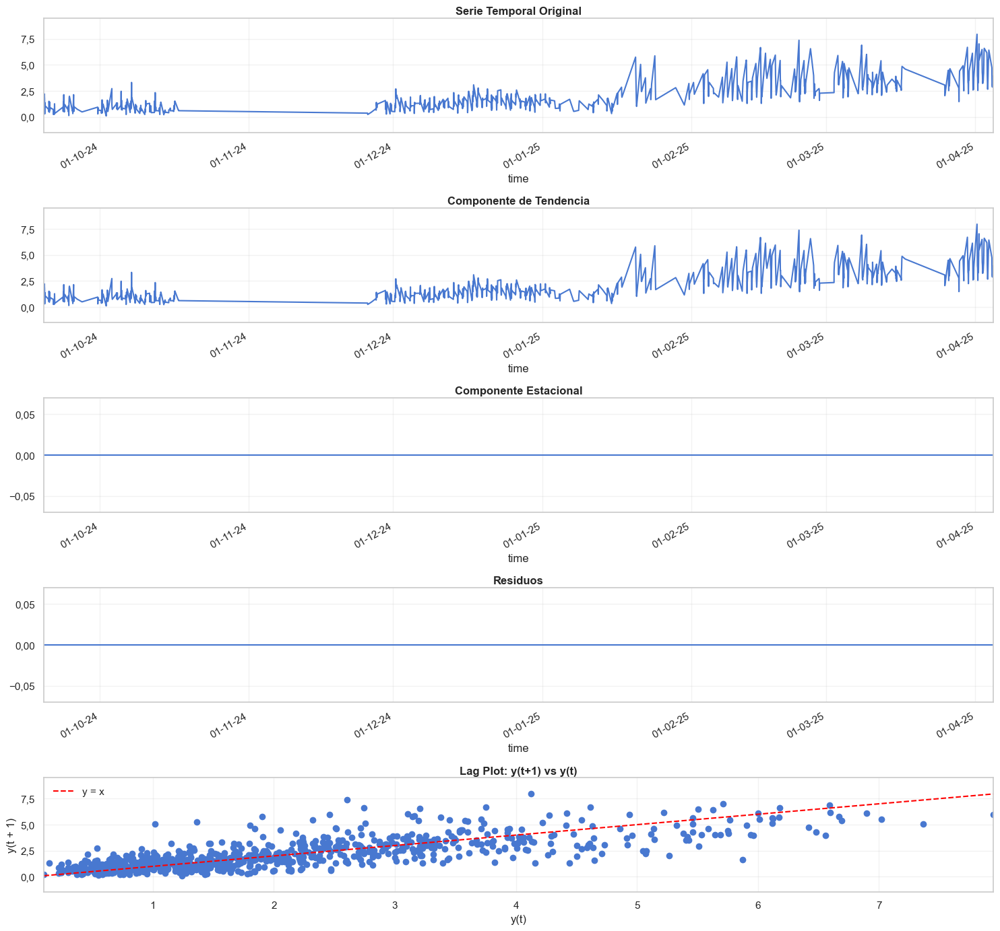

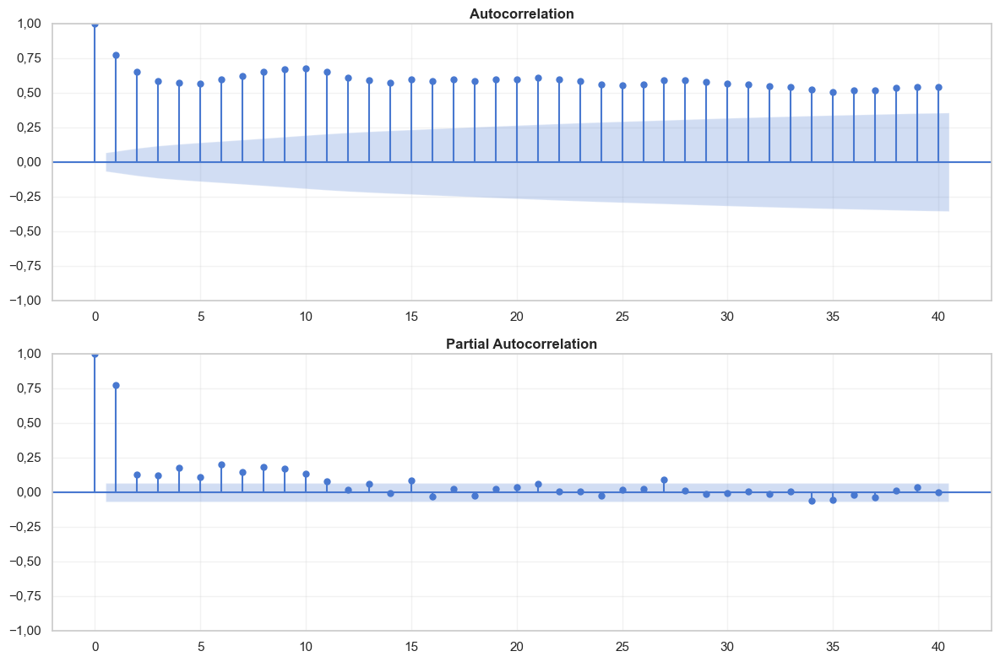

Analizando archivo: PAD_2B_2C.PAD OVER-2.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


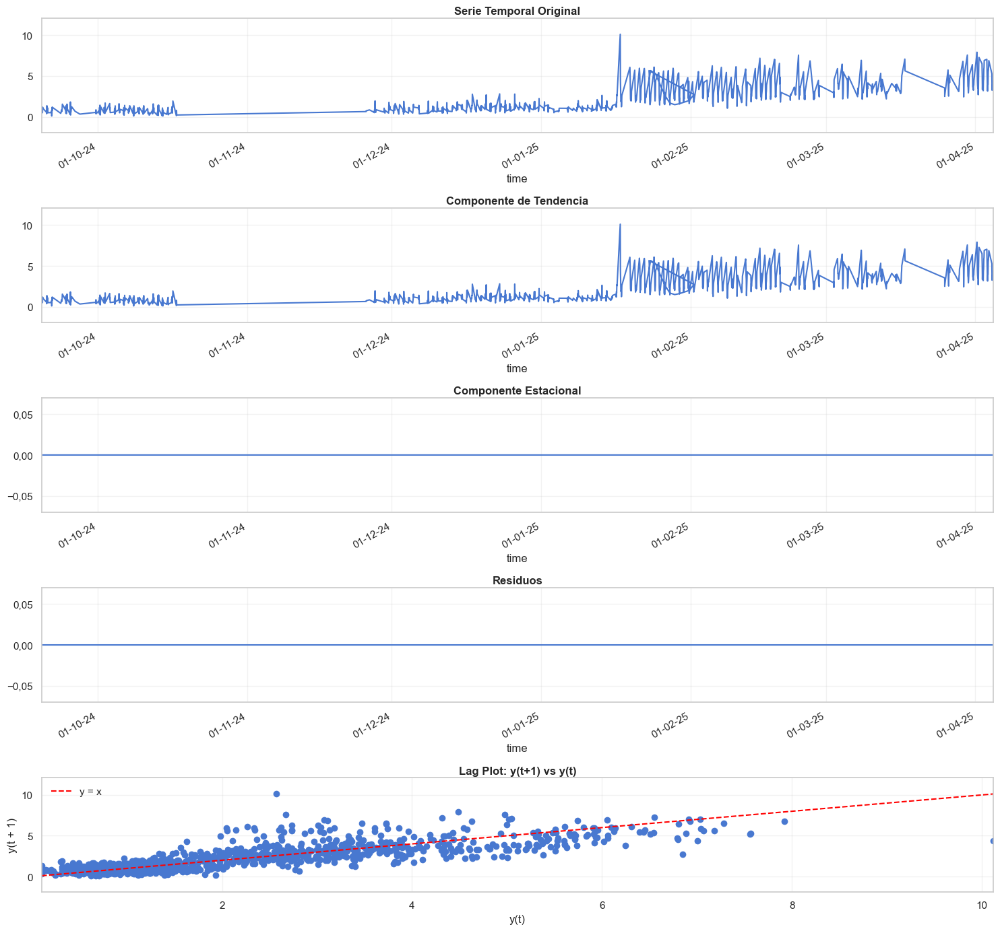

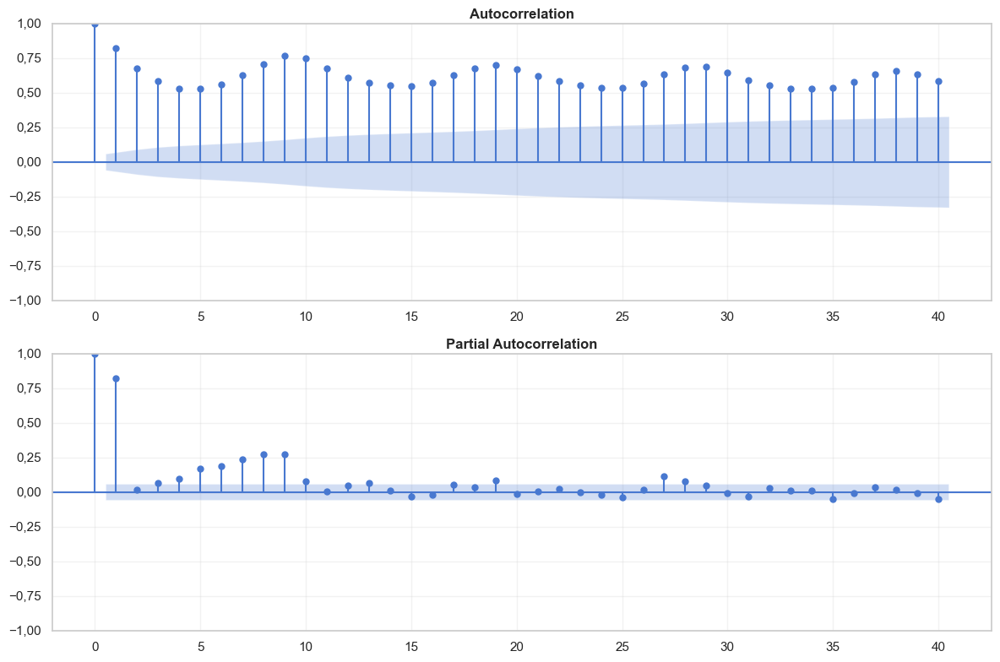

Analizando archivo: PAD_2B_2C.PAD OVER-3.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


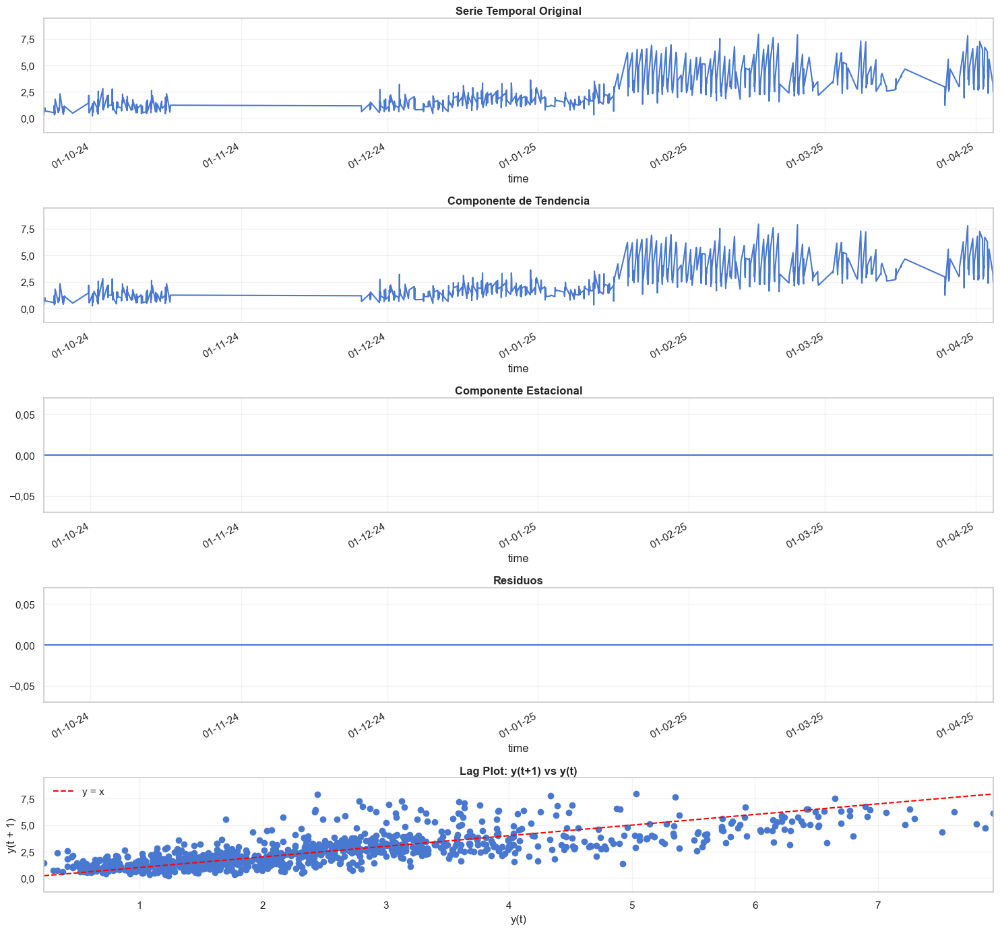

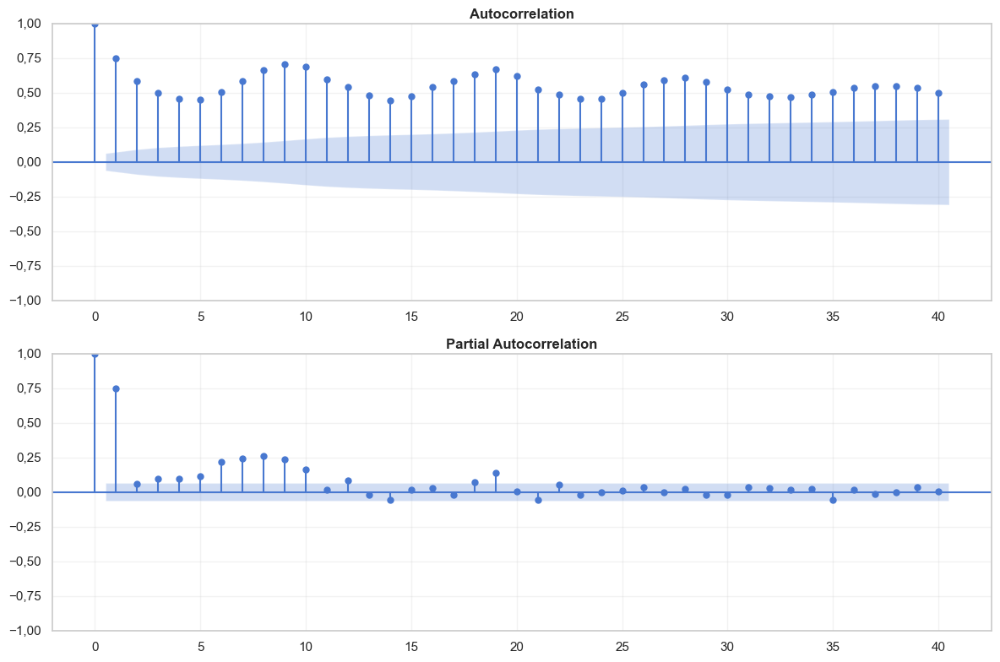

Analizando archivo: PAD_2B_2C.PAD OVER-4.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


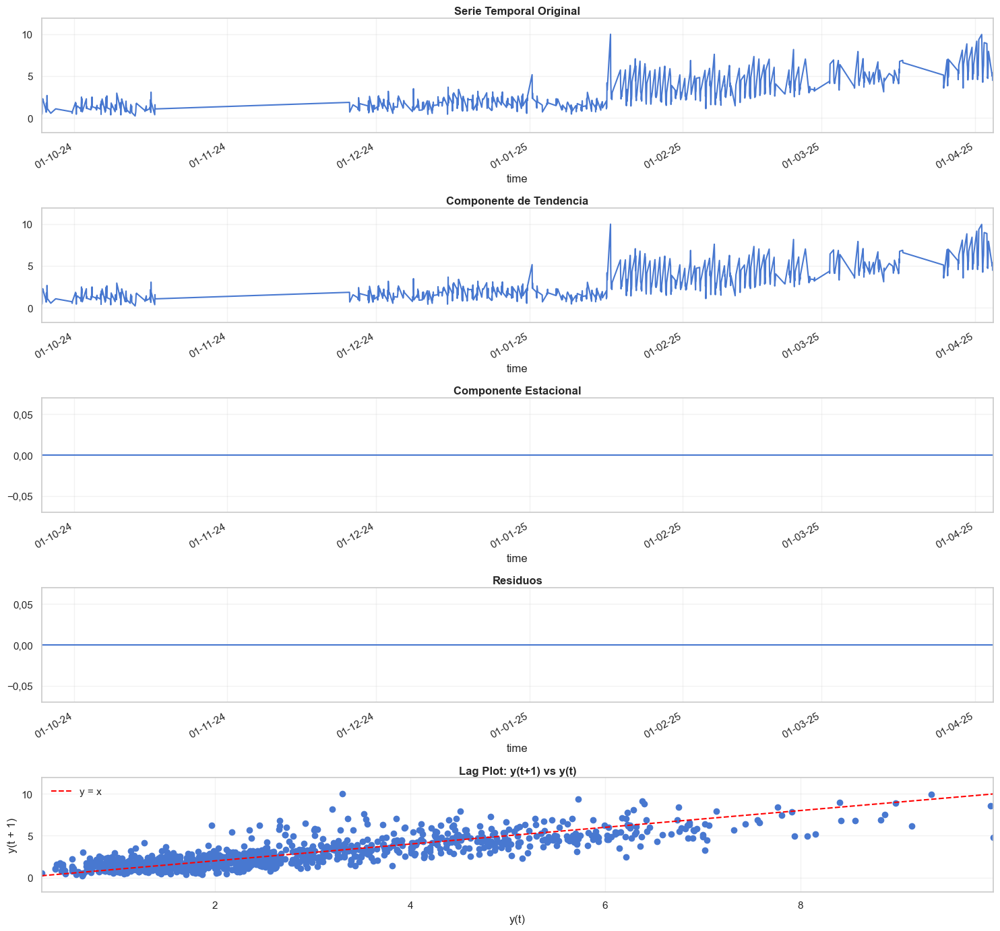

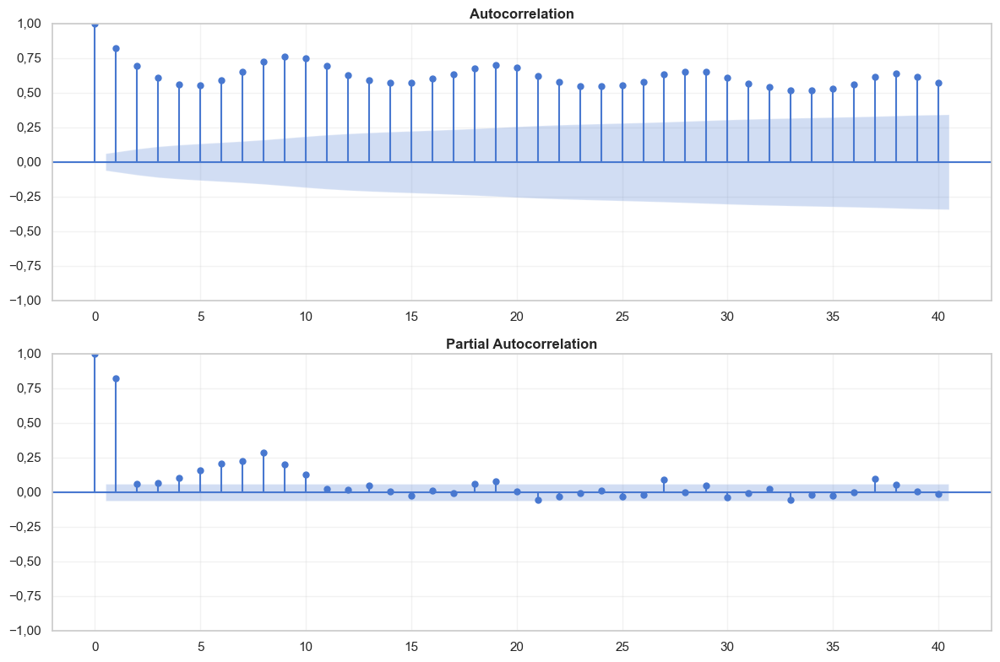

Analizando archivo: PAD_2B_2C.PAD OVER-5.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


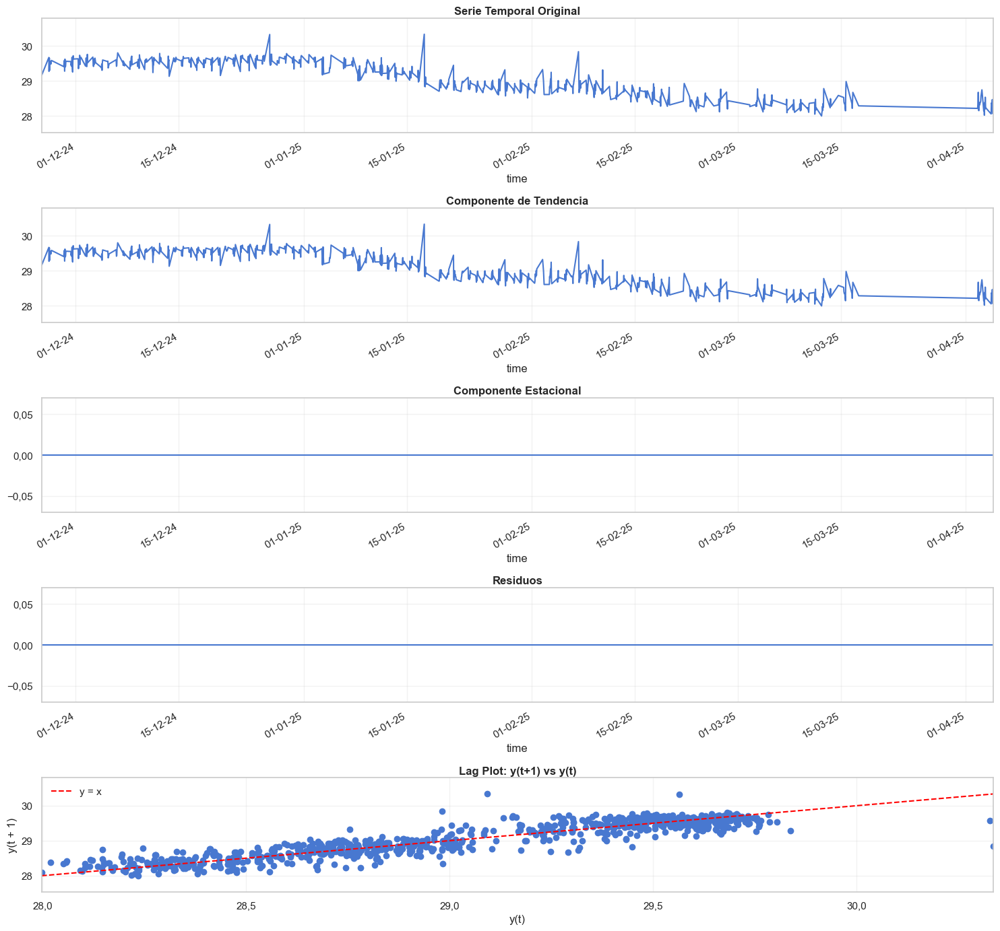

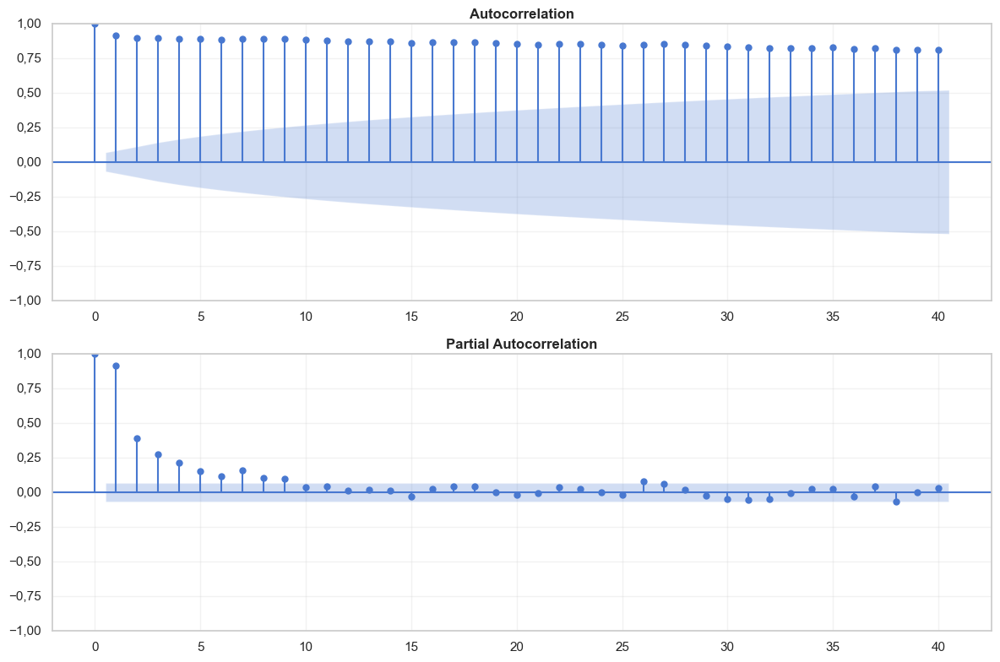

Analizando archivo: PAD_2B_2C.PAD OVER-6.csv


C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:34: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(df, regression='ct')
C:\Users\Joel Efraín\AppData\Local\Temp\ipykernel_7264\3015301180.py:47: RuntimeWarning: invalid value encountered in scalar divide
  seasonal_strength = max(0, 1 - (decomposition.resid.var() / decomposition.seasonal.add(decomposition.resid).var()))


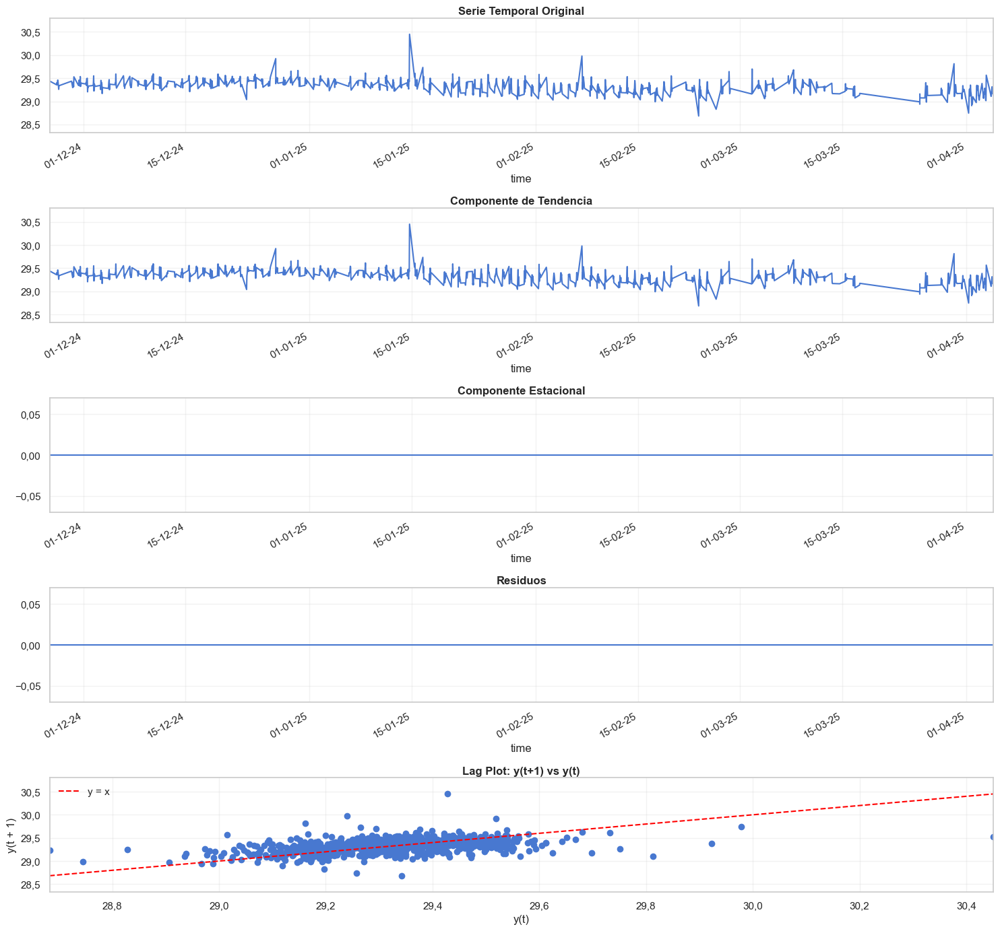

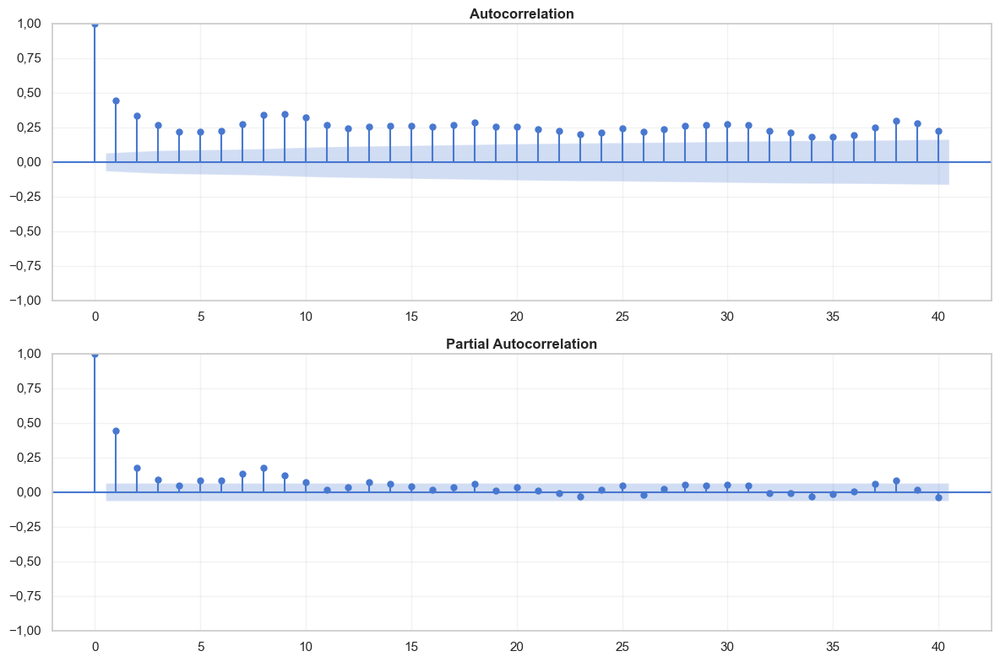

In [32]:
results = []

for df in dfs:
    file_name = df['file_name'].iloc[0]
    print(f"Analizando archivo: {file_name}")
    
    if len(df) > 30:
        ts_analizar = df['diff_disp_total_abs'].dropna()
        analysis = analyze_time_series(ts_analizar, period=1, verbose=False, plot=True)
        
        result = {
            'file_name': file_name,
            'stationarity': analysis['stationarity'],
            'trend': analysis['trend'],
            'seasonality': analysis['seasonality']
        }
    else:
        print("No hay suficientes datos para analizar.")
        result = {
            'file_name': file_name,
            'stationarity': 'insufficient_data',
            'trend': 'insufficient_data',
            'seasonality': 'insufficient_data'
        }

    results.append(result)

df_classification = pd.DataFrame(results)